# Team Info

- Members:
  - Antoniadis Panagiotis - 03115009
  - Bazotis Nikolaos - 03115739
  - Masouris Athanasios - 03115189

We got permission to write this notebook in english

# CIFAR-100 dataset
![alt text](https://datarepository.wolframcloud.com/resources/images/69f/69f1e629-81e6-4eaa-998f-f6734fcd2cb3-io-4-o.en.gif)

The [CIFAR-100](https://www.cs.toronto.edu/~kriz/cifar.html), like the CIFAR-10,are labeled subsets of the “80 million tiny images” dataset. They were created by Alex Krizhevsky, first author of the [AlexNet - 2012](https://papers.nips.cc/paper/4824-imagenet-classification-with-deep-convolutional-neural-networks.pdf)), Vinod Nair (first author of [ReLU - 2010](https://www.cs.toronto.edu/~hinton/absps/reluICML.pdf)) and Geoffrey Hinton.

The CIFAR-100 dataset includes **600000 colored images of 32x32 pixels clustered into 100 categories**. In each category correspond 500 images for training and 100 images for testing, which means that the train-test split is defined. In addition, **each of the 100 categories belongs to one of 20 sub-categories**, for example all of the following categories "maple", "oak", "palm", "pine" and "willow" belong to the subcategory "trees". Each image has two labels, the "fine" one, which corresponds to its category, and the "coarse" label, which corresponds to its subcategory. **We are going to work with the "fine" labels**.

**The CIFAR-100 is, as expected, more challenging than the CIFAR=10**. Up until 2019, the performance of the state-of-the-art models on CIFAR-10 was [99.00%](https://benchmarks.ai/cifar-10) (GPipe: Efficient Training of Giant Neural Networks using Pipeline Parallelism) accuracy, while on CIFAR-100 was [91.70%](https://benchmarks.ai/cifar-100)
(EfficientNet: Rethinking Model Scaling for Convolutional Neural Networks).	

# Installations and Imports

In [0]:
!sudo pip install --upgrade pip
!sudo pip install --upgrade tensorflow
!pip install tensorflow-datasets

Requirement already up-to-date: pip in /usr/local/lib/python3.6/dist-packages (20.0.2)
Requirement already up-to-date: tensorflow in /usr/local/lib/python3.6/dist-packages (2.1.0)


In [0]:
%tensorflow_version 2.x

TensorFlow 2.x selected.


In [0]:
from __future__ import absolute_import, division, print_function, unicode_literals # legacy compatibility

import tensorflow as tf
from tensorflow.keras import datasets, layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.applications.xception import Xception
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow.keras.applications.resnet_v2 import ResNet50V2
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2
from tensorflow.keras.applications.mobilenet import MobileNet
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2
from tensorflow.keras.applications.densenet import DenseNet121
from tensorflow.keras.applications.nasnet import NASNetMobile


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import time
from math import ceil

In [0]:
from google.colab import drive
drive.mount('/content/drive')

### Importing EfficientNet

In [0]:
!git clone https://github.com/qubvel/efficientnet
%cd efficientnet/

Cloning into 'efficientnet'...
remote: Enumerating objects: 12, done.
remote: Counting objects: 100% (12/12), done.
remote: Compressing objects: 100% (11/11), done.
remote: Total 292 (delta 4), reused 5 (delta 1), pack-reused 280
Receiving objects: 100% (292/292), 835.16 KiB | 7.39 MiB/s, done.
Resolving deltas: 100% (160/160), done.
/content/efficientnet


In [0]:
from efficientnet.model import EfficientNetB0, EfficientNetB4, EfficientNetB7
from efficientnet.preprocessing import center_crop_and_resize
from efficientnet.tfkeras import preprocess_input


# Loading the data

In [0]:
# The following code was given to us by our professors.
# helper functions

# select from from_list elements with index in index_list
def select_from_list(from_list, index_list):
  filtered_list= [from_list[i] for i in index_list]
  return(filtered_list)

# append in filtered_list the index of each element of unfilterd_list if it exists in in target_list
def get_ds_index(unfiliterd_list, target_list):
  index = 0
  filtered_list=[]
  for i_ in unfiliterd_list:
    if i_[0] in target_list:
      filtered_list.append(index)
    index += 1
  return(filtered_list)

# select a url for a unique subset of CIFAR-100 with 20, 40, 60, or 80 classes
def select_classes_number(classes_number = 20):
  cifar100_20_classes_url = "https://pastebin.com/raw/nzE1n98V"
  cifar100_40_classes_url = "https://pastebin.com/raw/zGX4mCNP"
  cifar100_60_classes_url = "https://pastebin.com/raw/nsDTd3Qn"
  cifar100_80_classes_url = "https://pastebin.com/raw/SNbXz700"
  if classes_number == 20:
    return cifar100_20_classes_url
  elif classes_number == 40:
    return cifar100_40_classes_url
  elif classes_number == 60:
    return cifar100_60_classes_url
  elif classes_number == 80:
    return cifar100_80_classes_url
  else:
    return -1

In [0]:
# load the entire dataset
(x_train_all, y_train_all), (x_test_all, y_test_all) = tf.keras.datasets.cifar100.load_data(label_mode='fine')

169009152/169001437 [==============================] - 4s 0us/step


Each team has a specific seed number which will determine the subset on which we are going to work.


In [0]:
# REPLACE WITH YOUR TEAM NUMBER
team_seed = 16

Below we choose the number of categories we want: 20 (default), 40, 60, 80.


In [0]:
# select the number of classes
cifar100_classes_url = select_classes_number()

Now we create the team's unique dataset

In [0]:
team_classes = pd.read_csv(cifar100_classes_url, sep=',', header=None)
CIFAR100_LABELS_LIST = pd.read_csv('https://pastebin.com/raw/qgDaNggt', sep=',', header=None).astype(str).values.tolist()[0]

our_index = team_classes.iloc[team_seed,:].values.tolist()
our_classes = select_from_list(CIFAR100_LABELS_LIST, our_index)
train_index = get_ds_index(y_train_all, our_index)
test_index = get_ds_index(y_test_all, our_index)

x_train_ds = np.asarray(select_from_list(x_train_all, train_index))
y_train_ds = np.asarray(select_from_list(y_train_all, train_index))
x_test_ds = np.asarray(select_from_list(x_test_all, test_index))
y_test_ds = np.asarray(select_from_list(y_test_all, test_index))

In [0]:
# print our classes
print(our_classes)

[' aquarium_fish', ' beaver', ' bed', ' bottle', ' boy', ' bridge', ' bus', ' camel', ' caterpillar', ' cockroach', ' crab', ' fox', ' lawn_mower', ' mountain', ' oak_tree', ' poppy', ' porcupine', ' possum', ' raccoon', ' rocket']


Train: X=(8500, 32, 32, 3), y=(8500, 1)
Validation: X=(1500, 32, 32, 3), y=(1500, 1)
Test: X=(2000, 32, 32, 3), y=(2000, 1)


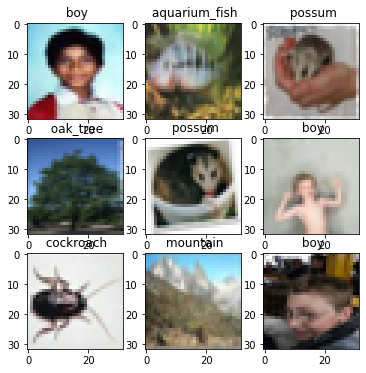

In [0]:
# get (train) dataset dimensions
data_size, img_rows, img_cols, img_channels = x_train_ds.shape

# set validation set percentage (wrt the training set size)
validation_percentage = 0.15
val_size = round(validation_percentage * data_size)

# Reserve val_size samples for validation and normalize all values
x_val = x_train_ds[-val_size:]/255
y_val = y_train_ds[-val_size:]
x_train = x_train_ds[:-val_size]/255
y_train = y_train_ds[:-val_size]
x_test = x_test_ds/255
y_test = y_test_ds

# summarize loaded dataset
print('Train: X=%s, y=%s' % (x_train.shape, y_train.shape))
print('Validation: X=%s, y=%s' % (x_val.shape, y_val.shape))
print('Test: X=%s, y=%s' % (x_test.shape, y_test.shape))

# get class label from class index
def class_label_from_index(fine_category):
  return(CIFAR100_LABELS_LIST[fine_category.item(0)])

# plot first few images
plt.figure(figsize=(6, 6))
for i in range(9):
	# define subplot
  plt.subplot(330 + 1 + i).set_title(class_label_from_index(y_train[i]))
	# plot raw pixel data
  plt.imshow(x_train[i], cmap=plt.get_cmap('gray'))
  #show the figure
plt.show()

# TFRecords

We are going to create TFRecords for our dataset in which we will increase our default image size from (32,32) to (78,78).

In [0]:
TARGET_SIZE = (78,78,3)

In [0]:
tfr_directory = "/content/drive/My Drive/NN/Lab3/tfrecords/"

## Creating TFRecords

In [0]:
def _bytes_feature(value):
    """Returns a bytes_list from a string / byte."""
    # If the value is an eager tensor BytesList won't unpack a string from an EagerTensor.
    if isinstance(value, type(tf.constant(0))):
        value = value.numpy() 
    return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value]))

def _int64_feature(value):
    """Returns an int64_list from a bool / enum / int / uint."""
    return tf.train.Feature(int64_list=tf.train.Int64List(value=[value]))

In [0]:
def serialize_example(image, label, image_shape):
    feature = {
        "image": _bytes_feature(image),
        "label": _int64_feature(label),
        'height': _int64_feature(image_shape[0]),
        'width': _int64_feature(image_shape[1]),
        'depth': _int64_feature(image_shape[2]),
    }

    example_proto = tf.train.Example(features=tf.train.Features(feature=feature))
    return example_proto.SerializeToString()

In [0]:
def write_TFR(tfrecord_dir, x, y):
  with tf.io.TFRecordWriter(tfrecord_dir) as writer:
      for img_array, label in zip(x, y):
                
          img_array = tf.image.resize(img_array, (TARGET_SIZE[0], TARGET_SIZE[1]))
          
          img_bytes = tf.io.serialize_tensor(img_array)
          image_shape = img_array.shape
          
          example = serialize_example(img_bytes, label, image_shape)
          writer.write(example)
  return None

In [0]:
write_TFR(tfr_directory + "train.tfrecords", x_train, y_train)
write_TFR(tfr_directory + "validation.tfrecords", x_val, y_val)
write_TFR(tfr_directory + "test.tfrecords", x_test, y_test)

## Reading TFRecords

In [0]:
def _parse_function(example_proto):
    feature_description = {
        'image': tf.io.FixedLenFeature([], tf.string),
        'label': tf.io.FixedLenFeature([], tf.int64),
        'height': tf.io.FixedLenFeature([], tf.int64),
        'width': tf.io.FixedLenFeature([], tf.int64),
        'depth': tf.io.FixedLenFeature([], tf.int64)
    }
    example = tf.io.parse_single_example(example_proto, feature_description)

    label = example["label"]
    image_shape = TARGET_SIZE

    image = tf.io.parse_tensor(example["image"], float)
    image = tf.reshape(image, image_shape)


    return  image , [label]

In [0]:
def read_dataset(file):
    dataset = tf.data.TFRecordDataset(file)
    return dataset.map(_parse_function)

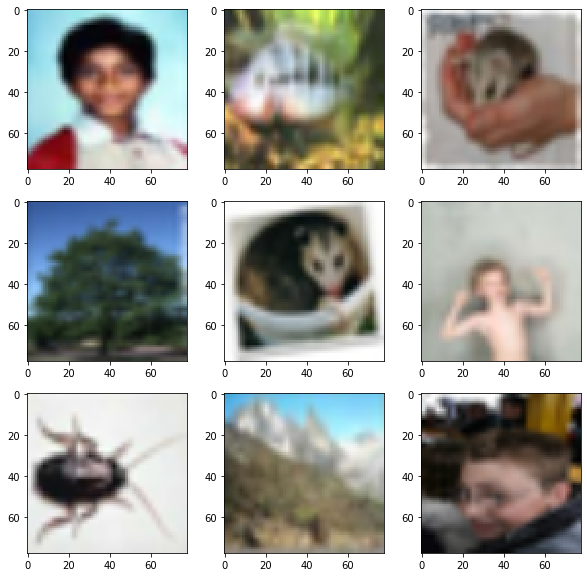

In [0]:
train_ds_78 = read_dataset(tfr_directory + "train.tfrecords")
validation_ds_78 = read_dataset(tfr_directory + "validation.tfrecords")
test_ds_78 = read_dataset(tfr_directory + "test.tfrecords")

plt.figure(figsize=(10,10))
for i, data in enumerate(train_ds_78.take(9)):
    img = tf.keras.preprocessing.image.array_to_img(data[0])
    plt.subplot(3,3,i+1)
    plt.imshow(img)
plt.show()

# Training Functions

## Preprocessing dataset

We will use the data prefetch property of tf2:

In [0]:
# we user prefetch https://www.tensorflow.org/api_docs/python/tf/data/Dataset#prefetch 
# see also AUTOTUNE
# the dataset is now "infinite"

BATCH_SIZE = [32,64,128]
AUTOTUNE = tf.data.experimental.AUTOTUNE # https://www.tensorflow.org/guide/data_performance

def _input_fn(ds, BATCH_SIZE):
  ds = ds.shuffle(buffer_size=data_size)
  ds = ds.repeat()
  #ds = ds.cache()
  ds = ds.batch(BATCH_SIZE)
  ds = ds.prefetch(buffer_size=AUTOTUNE)
  return ds

In [0]:


#INPUT DATA SIZE : (32,32,3)
train_ds = tf.data.Dataset.from_tensor_slices((x_train,y_train))
validation_ds = tf.data.Dataset.from_tensor_slices((x_val,y_val))
test_ds = tf.data.Dataset.from_tensor_slices((x_test,y_test))


### BATCH_SIZE=32
train_ds_b32 = _input_fn(train_ds, BATCH_SIZE[0]) #PrefetchDataset object
validation_ds_b32 =_input_fn(validation_ds, BATCH_SIZE[0]) #PrefetchDataset object
test_ds_b32 =_input_fn(test_ds, BATCH_SIZE[0]) #PrefetchDataset object

### BATCH_SIZE=64
train_ds_b64 = _input_fn(train_ds, BATCH_SIZE[1]) #PrefetchDataset object
validation_ds_b64 =_input_fn(validation_ds, BATCH_SIZE[1]) #PrefetchDataset object
test_ds_b64 =_input_fn(test_ds, BATCH_SIZE[1]) #PrefetchDataset object

### BATCH_SIZE=128
train_ds = _input_fn(train_ds, BATCH_SIZE[2]) #PrefetchDataset object
validation_ds =_input_fn(validation_ds, BATCH_SIZE[2]) #PrefetchDataset object
test_ds =_input_fn(test_ds, BATCH_SIZE[2]) #PrefetchDataset object


#INPUT DATA SIZE : (78,78,3)

### BATCH_SIZE=32
train_ds_78_b32 =_input_fn(train_ds_78, BATCH_SIZE[0]) #PrefetchDataset object
validation_ds_78_b32 =_input_fn(validation_ds_78, BATCH_SIZE[0]) #PrefetchDataset object
test_ds_78_b32 =_input_fn(test_ds_78, BATCH_SIZE[0]) #PrefetchDataset object

### BATCH_SIZE=64
train_ds_78_b64 =_input_fn(train_ds_78, BATCH_SIZE[1]) #PrefetchDataset object
validation_ds_78_b64 =_input_fn(validation_ds_78, BATCH_SIZE[1]) #PrefetchDataset object
test_ds_78_b64 =_input_fn(test_ds_78, BATCH_SIZE[1]) #PrefetchDataset object

### BATCH_SIZE=128

train_ds_78 =_input_fn(train_ds_78, BATCH_SIZE[2]) #PrefetchDataset object
validation_ds_78 =_input_fn(validation_ds_78, BATCH_SIZE[2]) #PrefetchDataset object
test_ds_78 =_input_fn(test_ds_78, BATCH_SIZE[2]) #PrefetchDataset object


## Training Functions for our models

We are going to use early stopping and reducing learning rate. Therefore we add the early_stopping and reduce_lr callbacks to our train_model_TL function's callbacks. The early_stopping callback will stop the training when there is no improvement in the validation loss for 25 consecutive epochs. The reduce_lr callback will reduce the trainings's learning rate by a factor of 0.2 if there is no improvement regarding the validation loss after 5 consecutive epochs.

In [0]:
# steps_per_epoch and validation_steps for training and validation: https://www.tensorflow.org/guide/keras/train_and_evaluate

def train_model(model, name, size, epochs = 10, steps_per_epoch = 2, validation_steps = 1 ,optimization = False ):
  
  logdir = os.path.join("/content/drive/My Drive/NN/Lab3/MODELS/logs", name + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)
  early_stopping_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience = 25,restore_best_weights=True) 
  reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=5, min_lr=0.00001)
  
  if optimization :
    
    if (size==32):
      #Train Generator
      gen_train = ImageDataGenerator(rotation_range=45,width_shift_range=.15,height_shift_range=.15,horizontal_flip=True,zoom_range=0.5)
      gen_train.fit(x_train)
      gen_train =gen_train.flow(x_train, y_train, batch_size=128)
      history = model.fit_generator(gen_train, epochs=epochs, steps_per_epoch=steps_per_epoch, 
                                    validation_data=validation_ds, validation_steps=validation_steps,
                                    use_multiprocessing=False,callbacks=[tensorboard_callback, early_stopping_callback ,reduce_lr])
    elif (size == 78):
      history = model.fit(train_ds_78, epochs=epochs, steps_per_epoch=steps_per_epoch,
                                    validation_data=validation_ds_78, validation_steps=validation_steps,
                                    callbacks=[tensorboard_callback, early_stopping_callback,reduce_lr])
    else:
      history = None

  else:
    if (size==32):
      history = model.fit(train_ds, epochs=epochs, steps_per_epoch=steps_per_epoch, validation_data=validation_ds, validation_steps=validation_steps,callbacks=[tensorboard_callback,reduce_lr])
    elif (size == 78):
      history = model.fit(train_ds_78, epochs=epochs, steps_per_epoch=steps_per_epoch, validation_data=validation_ds_78, validation_steps=validation_steps,callbacks=[tensorboard_callback,reduce_lr])
    else:
      history = None
  
  return(history)


We will use the basic training function for our models just to define which of them scores best in our dataset CIFAR100 . Then we will test different parameters on these such as batch size in input dataset . Finally ,the best model will be tested with different optimizers 

In [0]:
def train_best_models(model, name, size, epochs = 10, steps_per_epoch = 2, validation_steps = 1 ,optimization = False,batch_size=128):
  
  logdir = os.path.join("/content/drive/My Drive/Νευρωνικά/Lab3/NIKOS_MODELS/logs", name)
  tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)
  early_stopping_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience = 15,restore_best_weights=True) 
  reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=5, min_lr=0.00001)
  if batch_size==32:
    if size==32:
      train = train_ds_b32
      val = validation_ds_b32
    else:
      train = train_ds_78_b32
      val = validation_ds_78_b32

  elif batch_size==64:
    if size==32:
      train = train_ds_b64
      val = validation_ds_b64
    else:
      train = train_ds_78_b64
      val = validation_ds_78_b64
  else:
    if size==32:
      train = train_ds
      val = validation_ds
    else:
      train = train_ds_78
      val = validation_ds_78

  if optimization :
    
    if size==32:
      #Train Generator
      gen_train = ImageDataGenerator(rotation_range=45,width_shift_range=.15,height_shift_range=.15,horizontal_flip=True,zoom_range=0.5)
      gen_train.fit(x_train)
      gen_train =gen_train.flow(x_train, y_train, batch_size=batch_size )
      history = model.fit_generator(gen_train, epochs=epochs, steps_per_epoch=steps_per_epoch, 
                                    validation_data=val, validation_steps=validation_steps,
                                    use_multiprocessing=False,callbacks=[tensorboard_callback, early_stopping_callback ,reduce_lr])
      
    elif size == 78:
    
      history = model.fit(train, epochs=epochs, steps_per_epoch=steps_per_epoch,
                                    validation_data=val, validation_steps=validation_steps,
                                    callbacks=[tensorboard_callback, early_stopping_callback,reduce_lr])
    else:
      history = None
  else:
    
    history = model.fit(train, epochs=epochs, steps_per_epoch=steps_per_epoch, validation_data = val, validation_steps=validation_steps,callbacks=[tensorboard_callback,reduce_lr])



  return(history)

## Training Function for Transfer Learning

We are going to use early stopping. Therefore we add the early_stopping_callback to our train_model_TL function's callbacks. This callback will stop the training when there is no improvement in the validation loss for ten consecutive epochs.

In [0]:
# steps_per_epoch and validation_steps for training and validation: https://www.tensorflow.org/guide/keras/train_and_evaluate

def train_model_TL(model, name, size, epochs = 10, steps_per_epoch = 2, validation_steps = 1):

  logdir = os.path.join("/content/drive/My Drive/ΝΝ/Lab3/MODELS/logs", name + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)
  early_stopping_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience = 10, restore_best_weights=True) 

  if (size==32):
    history = model.fit(train_ds, epochs=epochs, steps_per_epoch=steps_per_epoch, validation_data=validation_ds, validation_steps=validation_steps, callbacks=[tensorboard_callback, early_stopping_callback])
  elif (size == 78):
    history = model.fit(train_ds_78, epochs=epochs, steps_per_epoch=steps_per_epoch, validation_data=validation_ds_78, validation_steps=validation_steps, callbacks=[tensorboard_callback, early_stopping_callback])
  else:
    history = None
  
  return(history)

# Functions for model evaluation and visualization

In [0]:
# plot diagnostic learning curves
def summarize_diagnostics(history):
	plt.figure(figsize=(8, 8))
	plt.suptitle('Training Curves')
	# plot loss
	plt.subplot(211)
	plt.title('Cross Entropy Loss')
	plt.plot(history.history['loss'], color='blue', label='train')
	plt.plot(history.history['val_loss'], color='orange', label='val')
	plt.legend(loc='upper right')
	# plot accuracy
	plt.subplot(212)
	plt.title('Classification Accuracy')
	plt.plot(history.history['accuracy'], color='blue', label='train')
	plt.plot(history.history['val_accuracy'], color='orange', label='val')
	plt.legend(loc='lower right')
	return plt
 
# print test set evaluation metrics
def model_evaluation(model, evaluation_steps, size):
	print('\nTest set evaluation metrics')
	if (size==32):
		loss0,accuracy0 = model.evaluate(test_ds, steps = evaluation_steps)
	elif (size==78):
		loss0,accuracy0 = model.evaluate(test_ds_78, steps = evaluation_steps)
	else:
		loss0,accuracy0 = None, None
	print("loss: {:.2f}".format(loss0))
	print("accuracy: {:.2f}".format(accuracy0))

def model_report(model, history, size, evaluation_steps = 10):
	plt = summarize_diagnostics(history)
	plt.show()
	model_evaluation(model, evaluation_steps, size)

# Models from scratch

We define training and evaluating functions for our best models "from scratch"


In [0]:
def best_models_evaluation(model,size, evaluation_steps,batch_size):
  print('\nTest set evaluation metrics')
  if batch_size==32:
    if size==32:
      test = test_ds_b32
    else:
      test = test_ds_78_b32

  elif batch_size==64:
    if size==32:
      test = test_ds_b64
    else:
      test = test_ds_78_b64

  else:
    if size==32:
      test = test_ds
    else:
      test = test_ds_78
  
  print()
  
  loss0,accuracy0 = model.evaluate(test , steps = evaluation_steps)

  print("loss: {:.2f}".format(loss0))
  print("accuracy: {:.2f}".format(accuracy0))

def best_models_report(model, history, size, evaluation_steps = 10,batch_size=128):
	plt = summarize_diagnostics(history)
	plt.show()
	best_models_evaluation(model,size,evaluation_steps,batch_size)

## Net Models for 32x32x3 images

### Small CNN "from scratch"

In [0]:
# a simple CNN https://www.tensorflow.org/tutorials/images/cnn

def init_simple_model(summary ,input):
  model = models.Sequential()
  model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(input,input, 3)))
  model.add(layers.MaxPooling2D((2, 2)))
  model.add(layers.Conv2D(64, (3, 3), activation='relu'))
  model.add(layers.MaxPooling2D((2, 2)))
  model.add(layers.Conv2D(64, (3, 3), activation='relu'))
  model.add(layers.Flatten())
  model.add(layers.Dense(64, activation='relu'))
  model.add(layers.Dense(100, activation='softmax'))
  model.compile(optimizer=tf.keras.optimizers.Adam(), loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=["accuracy"])
  if summary: 
    model.summary()
  return model

In [0]:
SIMPLE_MODEL_32 = init_simple_model(summary = True, input=32)
SIMPLE_MODEL_32_history = train_model(SIMPLE_MODEL_32,'SIMPLE_MODEL_32',32, 50, 30, 5,optimization=False)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 30, 30, 32)        896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 13, 13, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 6, 6, 64)          0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 4, 4, 64)          36928     
_________________________________________________________________
flatten (Flatten)            (None, 1024)              0         
_________________________________________________________________
dense (Dense)                (None, 64)                6

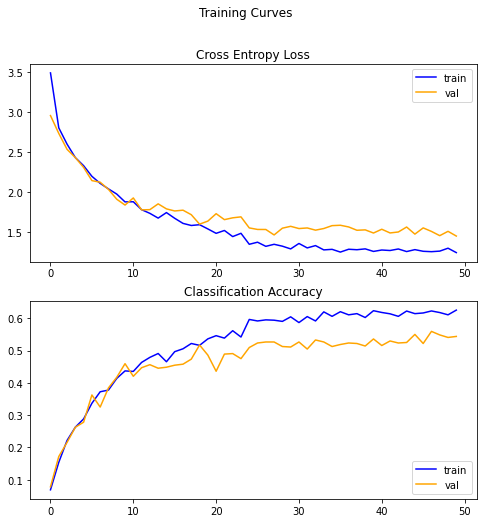


Test set evaluation metrics
5/5 [==============================] - 0s 10ms/step - loss: 1.4793 - accuracy: 0.5609
loss: 1.48
accuracy: 0.56


In [0]:
SIMPLE_MODEL_32.save("/content/drive/My Drive/NN/Lab3/MODELS/SIMPLE_MODEL_32x32.h5")
model_report(SIMPLE_MODEL_32,SIMPLE_MODEL_32_history,32, 5)

##  First Model from Scratch
---

### This model consists of 4 blocks 

Architecture's Brief Description

1st Block
```
- Convolutional Layer
- Maxpooling Layer
```
2nd Block
```
- Convolutional Layer
- Maxpooling Layer
```
3rd Block
```
- Convolutional Layer
```
4th Block
```
- Convolutional Layer
```
Fully Connected Layers
```
- Dense layer
- Dropout layer
- Dense layer
```

Definition

In [0]:
def init_first_model(summary,input):
  model = models.Sequential()
  ##Conv1
  model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(input, input, 3)))
  model.add(layers.MaxPooling2D((2, 2)))
  ##Conv2
  model.add(layers.Conv2D(64, (3, 3), activation='relu'))
  model.add(layers.MaxPooling2D((2, 2)))
  ##Conv3
  model.add(layers.Conv2D(64, (3, 3), activation='relu'))
  ##Conv4
  model.add(layers.Conv2D(64, (3, 3), activation='relu'))

  ###Linear
  model.add(layers.Flatten())
  model.add(layers.Dense(64, activation='relu'))
  model.add(layers.Dropout(rate=0.5))
  model.add(layers.Dense(100, activation='softmax'))
  
  model.compile(optimizer=tf.optimizers.Adam(), loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=["accuracy"])
  if summary: 
    model.summary()
  return model

In [0]:
first_model_32 = init_first_model(summary = True , input=32)
epochs = 150
steps_per_epoch = 50
validation_steps = 10

first_model_32_history = train_model(first_model_32,'first_model_32',32 , epochs, steps_per_epoch , validation_steps,optimization=False)

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 30, 30, 32)        896       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 13, 13, 64)        18496     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 6, 6, 64)          0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 4, 4, 64)          36928     
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 2, 2, 64)          36928     
_________________________________________________________________
flatten_1 (Flatten)          (None, 256)              

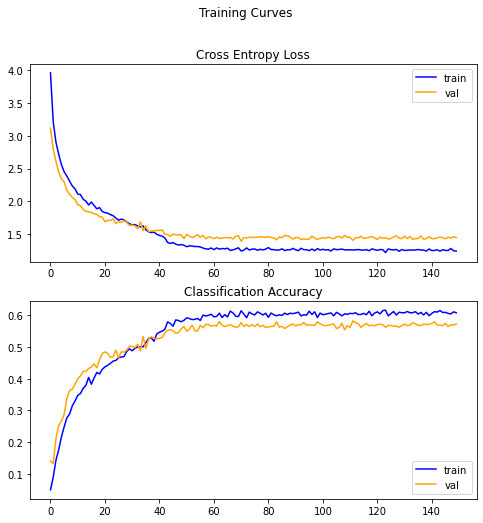


Test set evaluation metrics
5/5 [==============================] - 0s 10ms/step - loss: 1.4650 - accuracy: 0.5734
loss: 1.47
accuracy: 0.57


In [0]:
first_model_32.save("/content/drive/My Drive/NN/Lab3/MODELS/first_model_32x32.h5")
model_report(first_model_32, first_model_32_history,32, 5)

### First Model's optimization

In [0]:
first_model_32_opt = init_first_model(summary = True , input=32)
epochs = 200
steps_per_epoch = 60
validation_steps = 10
first_model_32_opt_history = train_model(first_model_32_opt,'first_model_32_opt',32 , epochs, steps_per_epoch , validation_steps,optimization=True)

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_27 (Conv2D)           (None, 30, 30, 32)        896       
_________________________________________________________________
max_pooling2d_14 (MaxPooling (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_28 (Conv2D)           (None, 13, 13, 64)        18496     
_________________________________________________________________
max_pooling2d_15 (MaxPooling (None, 6, 6, 64)          0         
_________________________________________________________________
conv2d_29 (Conv2D)           (None, 4, 4, 64)          36928     
_________________________________________________________________
conv2d_30 (Conv2D)           (None, 2, 2, 64)          36928     
_________________________________________________________________
flatten_7 (Flatten)          (None, 256)              

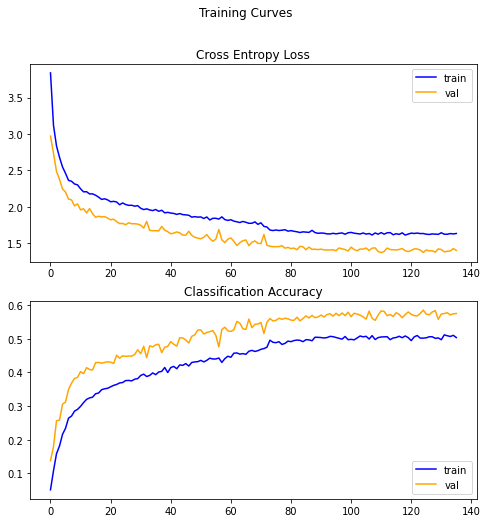


Test set evaluation metrics
5/5 [==============================] - 0s 10ms/step - loss: 1.3628 - accuracy: 0.5656
loss: 1.36
accuracy: 0.57


In [0]:
first_model_32_opt.save("/content/drive/My Drive/NN/Lab3/MODELS/first_model_opt_32x32.h5")
model_report(first_model_32_opt, first_model_32_opt_history,32, 5)

##  Second Model from Scratch
---

NOTE: This model scores the best in our dataset , so we will test here different parameters 

- Batch_size = [32,64,128] 
- Optimizers: 
-- ADAM
-- Nadam
-- RMSprop
-- SGD

### This model consists of 3 blocks and adds Batch normalization in layers

Architecture's Brief Description

1st Block
```
- Convolutional Layer
- Maxpooling Layer
- Batch Normalization
```
2nd Block
```
- Convolutional Layer
- Maxpooling Layer

```
3rd Block
```
- Convolutional Layer
- Maxpooling Layer
```
Fully Connected Layers
```
- Dense layer
- Dense layer
- Dense layer
```

In [0]:
def init_second_model(summary,input,optimizer):
  model = models.Sequential()
  
  #1st block
  model.add(layers.Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(input,input,3)))
  model.add(layers.MaxPooling2D(pool_size=(2, 2)))
  model.add(layers.BatchNormalization(axis=-1,scale=False))
  
  #2nd block
  model.add(layers.Conv2D(64, kernel_size=(3, 3), activation='relu'))
  model.add(layers.MaxPooling2D(pool_size=(2, 2)))
  #model.add(layers.BatchNormalization(axis=-1,scale=False))
  
  #3rd block
  model.add(layers.Conv2D(128, kernel_size=(3, 3), activation='relu'))
  model.add(layers.MaxPooling2D(pool_size=(2, 2)))
  #model.add(layers.BatchNormalization(axis=-1,scale=False))
  

  model.add(layers.Flatten())
  model.add(layers.Dense(256, activation='relu'))
  #model.add(layers.Dropout(rate=0.4))
  model.add(layers.Dense(64, activation='relu'))
  #model.add(layers.Dropout(rate=0.4))
  model.add(layers.Dense(100, activation='softmax'))
  
  model.compile(optimizer=optimizer, loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=["accuracy"])
  if summary: 
    model.summary()
  return model

In [0]:
optimizer = tf.optimizers.Adam()
second_model_32_b32 = init_second_model(summary = True,input=32,optimizer=optimizer)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 30, 30, 32)        896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 15, 15, 32)        0         
_________________________________________________________________
batch_normalization (BatchNo (None, 15, 15, 32)        96        
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 13, 13, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 6, 6, 64)          0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 4, 4, 128)         73856     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 2, 2, 128)         0

In [0]:
epochs = 100
steps_per_epoch = 50
validation_steps = 5
second_model_32_b32_history = train_best_models(second_model_32_b32,'second_model_32_b32',32, epochs, steps_per_epoch , validation_steps,optimization=False,batch_size=32)

Train for 50 steps, validate for 5 steps
Epoch 1/100
50/50 [==============================] - 8s 154ms/step - loss: 3.2479 - accuracy: 0.1581 - val_loss: 3.7607 - val_accuracy: 0.0688
Epoch 2/100
50/50 [==============================] - 0s 7ms/step - loss: 2.3616 - accuracy: 0.3019 - val_loss: 3.6291 - val_accuracy: 0.1750
Epoch 3/100
50/50 [==============================] - 0s 6ms/step - loss: 2.1467 - accuracy: 0.3250 - val_loss: 3.2675 - val_accuracy: 0.2875
Epoch 4/100
50/50 [==============================] - 0s 6ms/step - loss: 2.0584 - accuracy: 0.3562 - val_loss: 3.0160 - val_accuracy: 0.3625
Epoch 5/100
50/50 [==============================] - 0s 7ms/step - loss: 1.9162 - accuracy: 0.4212 - val_loss: 2.7626 - val_accuracy: 0.3125
Epoch 6/100
50/50 [==============================] - 0s 8ms/step - loss: 1.7892 - accuracy: 0.4519 - val_loss: 2.6046 - val_accuracy: 0.3562
Epoch 7/100
50/50 [==============================] - 0s 7ms/step - loss: 1.7535 - accuracy: 0.4594 - val_loss: 

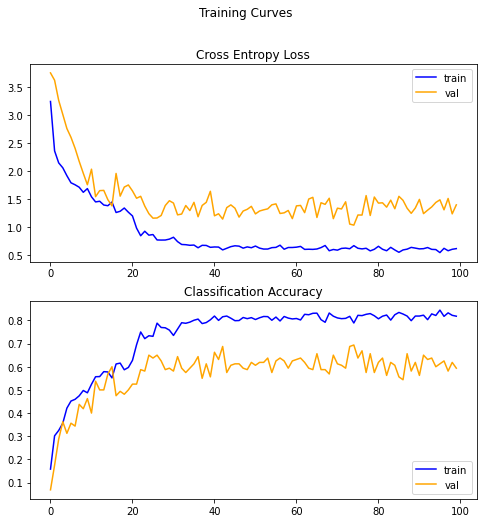


Test set evaluation metrics

5/5 [==============================] - 0s 7ms/step - loss: 1.1397 - accuracy: 0.6500
loss: 1.14
accuracy: 0.65


In [0]:
second_model_32_b32.save("/content/drive/My Drive/Νευρωνικά/Lab3/NIKOS_MODELS/second_model_32x32_b32.h5")
best_models_report(second_model_32_b32, second_model_32_b32_history, size=32, evaluation_steps= 5,batch_size=32)

In [0]:
optimizer = tf.optimizers.Adam()
second_model_32_b64 = init_second_model(summary = True,input=32,optimizer=optimizer)
epochs = 100
steps_per_epoch = 50
validation_steps = 5
second_model_32_b64_history = train_best_models(second_model_32_b64,'second_model_32_b64',32, epochs, steps_per_epoch , validation_steps,optimization=False,batch_size=64)

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_9 (Conv2D)            (None, 30, 30, 32)        896       
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 15, 15, 32)        0         
_________________________________________________________________
batch_normalization_3 (Batch (None, 15, 15, 32)        96        
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 13, 13, 64)        18496     
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 6, 6, 64)          0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 4, 4, 128)         73856     
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 2, 2, 128)        

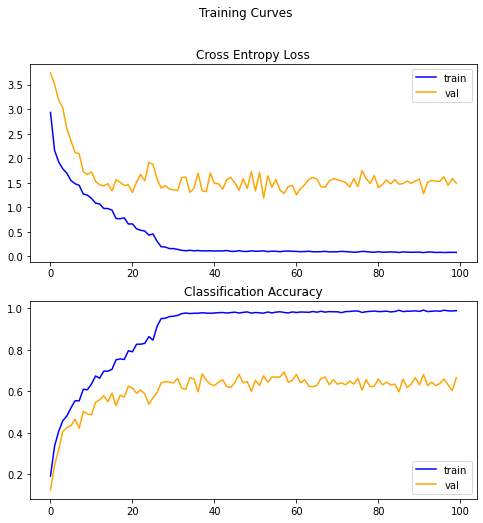


Test set evaluation metrics

5/5 [==============================] - 0s 9ms/step - loss: 1.4332 - accuracy: 0.6781
loss: 1.43
accuracy: 0.68


In [0]:
second_model_32_b64.save("/content/drive/My Drive/Νευρωνικά/Lab3/NIKOS_MODELS/second_model_32x32_b64.h5")
best_models_report(second_model_32_b64, second_model_32_b64_history, size=32, evaluation_steps= 5,batch_size=64)

In [0]:
optimizer = tf.optimizers.Adam()
second_model_32 = init_second_model(summary = True,input=32,optimizer=optimizer)
epochs = 100
steps_per_epoch = 40
validation_steps = 5
second_model_32_history = train_best_models(second_model_32,'second_model_32',32, epochs, steps_per_epoch , validation_steps,optimization=False,batch_size=128)

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 30, 30, 32)        896       
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 15, 15, 32)        0         
_________________________________________________________________
batch_normalization_2 (Batch (None, 15, 15, 32)        96        
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 13, 13, 64)        18496     
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 6, 6, 64)          0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 4, 4, 128)         73856     
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 2, 2, 128)        

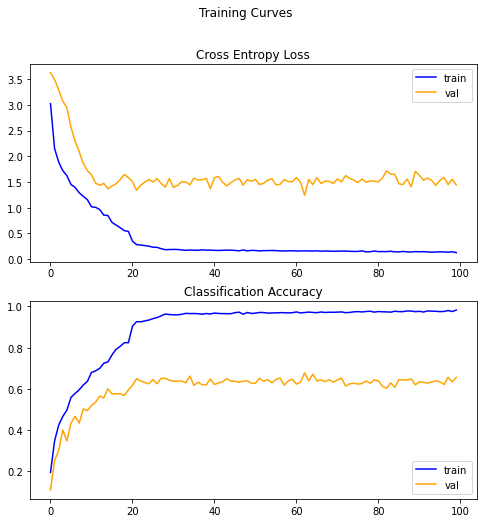


Test set evaluation metrics

5/5 [==============================] - 0s 10ms/step - loss: 1.5979 - accuracy: 0.6844
loss: 1.60
accuracy: 0.68


In [0]:
second_model_32.save("/content/drive/My Drive/Νευρωνικά/Lab3/NIKOS_MODELS/second_model_32x32.h5")
best_models_report(second_model_32, second_model_32_history, size=32, evaluation_steps= 5,batch_size=128)

### Second Model's Optimization

In [0]:
optimizer = tf.optimizers.Adam()
second_model_32_b32_opt = init_second_model(summary = True,input=32,optimizer=optimizer)
epochs = 200
steps_per_epoch = 50
validation_steps = 5
second_model_32_b32_opt_history = train_best_models(second_model_32_b32_opt,'second_model_32_b32_opt',32, epochs, steps_per_epoch , validation_steps,optimization=True,batch_size=32)

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_12 (Conv2D)           (None, 30, 30, 32)        896       
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 15, 15, 32)        0         
_________________________________________________________________
batch_normalization_4 (Batch (None, 15, 15, 32)        96        
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 13, 13, 64)        18496     
_________________________________________________________________
max_pooling2d_13 (MaxPooling (None, 6, 6, 64)          0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 4, 4, 128)         73856     
_________________________________________________________________
max_pooling2d_14 (MaxPooling (None, 2, 2, 128)        

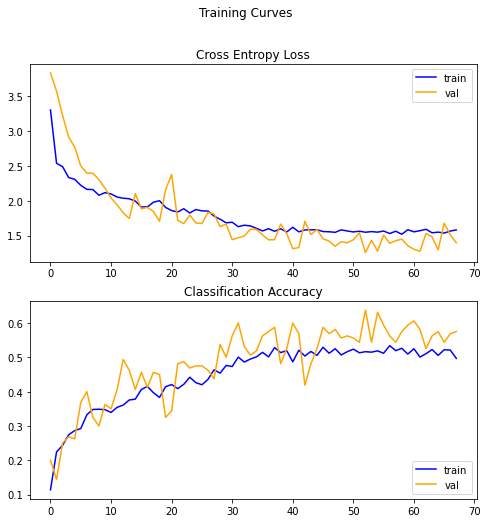


Test set evaluation metrics

5/5 [==============================] - 0s 8ms/step - loss: 1.6803 - accuracy: 0.5000
loss: 1.68
accuracy: 0.50


In [0]:
second_model_32_b32_opt.save("/content/drive/My Drive/Νευρωνικά/Lab3/NIKOS_MODELS/second_model_32x32_b32_opt.h5")
best_models_report(second_model_32_b32_opt, second_model_32_b32_opt_history, size=32, evaluation_steps= 5,batch_size=32)

In [0]:
optimizer = tf.optimizers.Adam()
second_model_32_b64_opt = init_second_model(summary = True,input=32,optimizer=optimizer)
epochs = 200
steps_per_epoch = 50
validation_steps = 5
second_model_32_b64_opt_history = train_best_models(second_model_32_b64_opt,'second_model_32_b64_opt',32, epochs, steps_per_epoch , validation_steps,optimization=True,batch_size=64)

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_15 (Conv2D)           (None, 30, 30, 32)        896       
_________________________________________________________________
max_pooling2d_15 (MaxPooling (None, 15, 15, 32)        0         
_________________________________________________________________
batch_normalization_5 (Batch (None, 15, 15, 32)        96        
_________________________________________________________________
conv2d_16 (Conv2D)           (None, 13, 13, 64)        18496     
_________________________________________________________________
max_pooling2d_16 (MaxPooling (None, 6, 6, 64)          0         
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 4, 4, 128)         73856     
_________________________________________________________________
max_pooling2d_17 (MaxPooling (None, 2, 2, 128)        

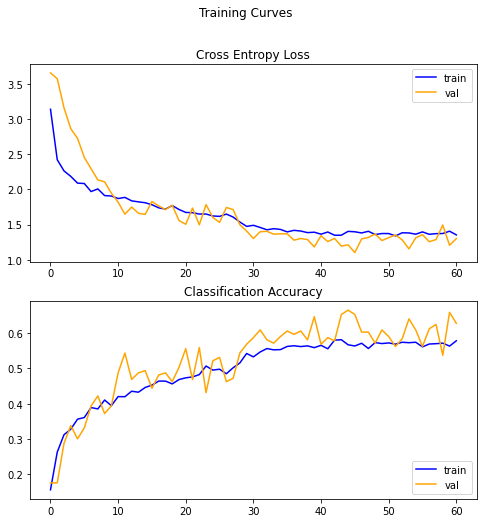


Test set evaluation metrics

5/5 [==============================] - 0s 10ms/step - loss: 1.1738 - accuracy: 0.6313
loss: 1.17
accuracy: 0.63


In [0]:
second_model_32_b64_opt.save("/content/drive/My Drive/Νευρωνικά/Lab3/NIKOS_MODELS/second_model_32x32_b64_opt.h5")
best_models_report(second_model_32_b64_opt, second_model_32_b64_opt_history, size=32, evaluation_steps= 5,batch_size=64)

In [0]:
second_model_32_opt = init_second_model(summary = True,input=32,optimizer=optimizer)
epochs = 200
steps_per_epoch = 50
validation_steps = 5
second_model_32_opt_history = train_best_models(second_model_32_opt,'second_model_32_opt',32, epochs, steps_per_epoch , validation_steps,optimization=True,batch_size=128)

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_18 (Conv2D)           (None, 30, 30, 32)        896       
_________________________________________________________________
max_pooling2d_18 (MaxPooling (None, 15, 15, 32)        0         
_________________________________________________________________
batch_normalization_6 (Batch (None, 15, 15, 32)        96        
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 13, 13, 64)        18496     
_________________________________________________________________
max_pooling2d_19 (MaxPooling (None, 6, 6, 64)          0         
_________________________________________________________________
conv2d_20 (Conv2D)           (None, 4, 4, 128)         73856     
_________________________________________________________________
max_pooling2d_20 (MaxPooling (None, 2, 2, 128)        

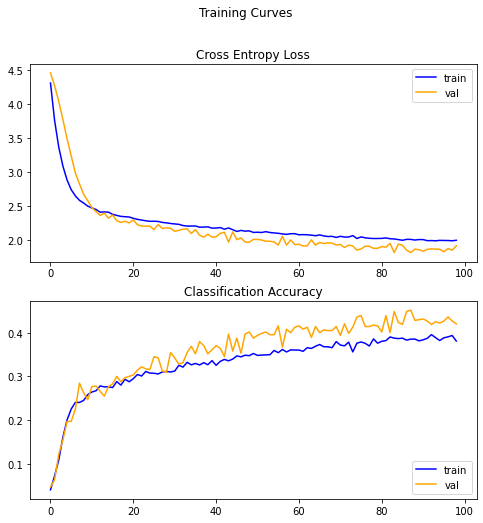


Test set evaluation metrics

10/10 [==============================] - 0s 7ms/step - loss: 1.9090 - accuracy: 0.4172
loss: 1.91
accuracy: 0.42


In [0]:
second_model_32_opt.save("/content/drive/My Drive/Νευρωνικά/Lab3/NIKOS_MODELS/second_model_opt_32x32.h5")
best_models_report(second_model_32_opt, second_model_32_opt_history, size=32, evaluation_steps= 10,batch_size=128)

## Other Optimizers

We will test more Optimizers to our best second model
- Nadam 
- RMSprop
- Stohastic Gradient Descent

In [0]:
optimizer = tf.optimizers.Nadam(learning_rate=0.0002, beta_1=0.9, beta_2=0.999)
second_model_32_b64_opNadam = init_second_model(summary = True,input=32,optimizer=optimizer)
epochs = 100
steps_per_epoch = 50
validation_steps = 5
second_model_32_b64_opNadam_history = train_best_models(second_model_32_b64_opNadam,'second_model_32_b64_opNadam',32, epochs, steps_per_epoch , validation_steps,optimization=False,batch_size=64)

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_21 (Conv2D)           (None, 30, 30, 32)        896       
_________________________________________________________________
max_pooling2d_21 (MaxPooling (None, 15, 15, 32)        0         
_________________________________________________________________
batch_normalization_7 (Batch (None, 15, 15, 32)        96        
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 13, 13, 64)        18496     
_________________________________________________________________
max_pooling2d_22 (MaxPooling (None, 6, 6, 64)          0         
_________________________________________________________________
conv2d_23 (Conv2D)           (None, 4, 4, 128)         73856     
_________________________________________________________________
max_pooling2d_23 (MaxPooling (None, 2, 2, 128)        

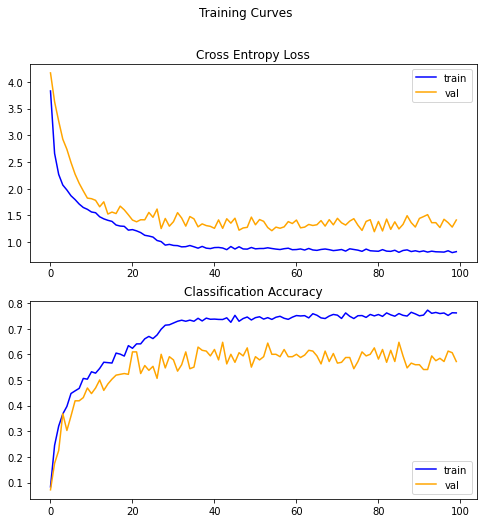


Test set evaluation metrics

5/5 [==============================] - 0s 10ms/step - loss: 1.3563 - accuracy: 0.5844
loss: 1.36
accuracy: 0.58


In [0]:
second_model_32_b64_opNadam.save("/content/drive/My Drive/Νευρωνικά/Lab3/NIKOS_MODELS/second_model_32x32_b64_opNadam.h5")
best_models_report(second_model_32_b64_opNadam, second_model_32_b64_opNadam_history, size=32, evaluation_steps= 5,batch_size=64)

In [0]:
optimizer=tf.optimizers.RMSprop(learning_rate=0.0001, rho=0.9)
second_model_32_b64_opRMSprop = init_second_model(summary = True,input=32,optimizer=optimizer)
epochs = 100
steps_per_epoch = 50
validation_steps = 5
second_model_32_b64_opRMSprop_history = train_best_models(second_model_32_b64_opRMSprop,'second_model_32_b64_opRMSprop',32, epochs, steps_per_epoch , validation_steps,optimization=False,batch_size=64)

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_27 (Conv2D)           (None, 30, 30, 32)        896       
_________________________________________________________________
max_pooling2d_27 (MaxPooling (None, 15, 15, 32)        0         
_________________________________________________________________
batch_normalization_9 (Batch (None, 15, 15, 32)        96        
_________________________________________________________________
conv2d_28 (Conv2D)           (None, 13, 13, 64)        18496     
_________________________________________________________________
max_pooling2d_28 (MaxPooling (None, 6, 6, 64)          0         
_________________________________________________________________
conv2d_29 (Conv2D)           (None, 4, 4, 128)         73856     
_________________________________________________________________
max_pooling2d_29 (MaxPooling (None, 2, 2, 128)        

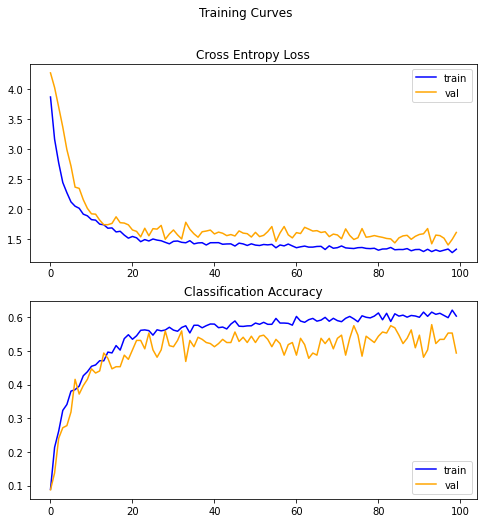


Test set evaluation metrics

5/5 [==============================] - 0s 8ms/step - loss: 1.6445 - accuracy: 0.5063
loss: 1.64
accuracy: 0.51


In [0]:
second_model_32_b64_opRMSprop.save("/content/drive/My Drive/Νευρωνικά/Lab3/NIKOS_MODELS/second_model_32x32_b64_opRMSprop.h5")
best_models_report(second_model_32_b64_opRMSprop, second_model_32_b64_opRMSprop_history, size=32, evaluation_steps= 5,batch_size=64)

In [0]:
optimizer=tf.optimizers.SGD(learning_rate=0.0002, momentum=0.0, nesterov=False)
second_model_32_b64_opSGD = init_second_model(summary = True,input=32,optimizer=optimizer)
epochs = 200
steps_per_epoch = 50
validation_steps = 5
second_model_32_b64_opSGD_history = train_best_models(second_model_32_b64_opSGD,'second_model_32_b64_opSGD',32, epochs, steps_per_epoch , validation_steps,optimization=False,batch_size=64)

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_30 (Conv2D)           (None, 30, 30, 32)        896       
_________________________________________________________________
max_pooling2d_30 (MaxPooling (None, 15, 15, 32)        0         
_________________________________________________________________
batch_normalization_10 (Batc (None, 15, 15, 32)        96        
_________________________________________________________________
conv2d_31 (Conv2D)           (None, 13, 13, 64)        18496     
_________________________________________________________________
max_pooling2d_31 (MaxPooling (None, 6, 6, 64)          0         
_________________________________________________________________
conv2d_32 (Conv2D)           (None, 4, 4, 128)         73856     
_________________________________________________________________
max_pooling2d_32 (MaxPooling (None, 2, 2, 128)       

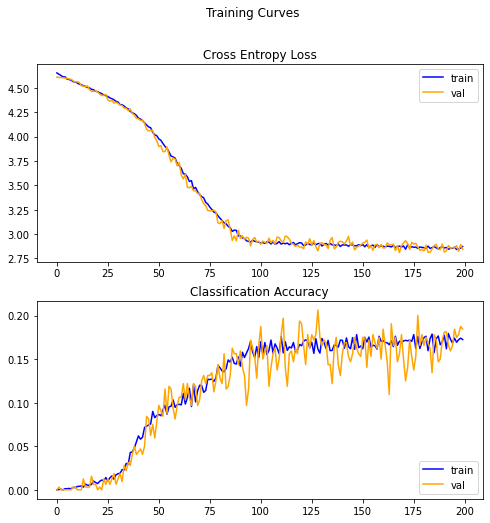


Test set evaluation metrics

5/5 [==============================] - 0s 8ms/step - loss: 2.8540 - accuracy: 0.1781
loss: 2.85
accuracy: 0.18


In [0]:
second_model_32_b64_opSGD.save("/content/drive/My Drive/Νευρωνικά/Lab3/NIKOS_MODELS/second_model_32x32_b64_opSGD.h5")
best_models_report(second_model_32_b64_opSGD, second_model_32_b64_opSGD_history, size=32, evaluation_steps= 5,batch_size=64)

##  Third Model from Scratch
---

### This model consists of 3 blocks and adds Batch normalization in layers and Average Pooling before Fully connected layers

Architecture's Brief Description
```
- Convolutional Layer
```


1st Block
```
- Batch Normalization layer
- RELU layer
- Convolutional Layer

```
2nd Block
```
- Batch Normalization layer
- RELU layer
- Convolutional Layer
```
3rd Block
```
- Batch Normalization layer
- RELU layer
- Convolutional Layer
```
Fully Connected Layers
```
- AveragePooling Layer
- Dense layer
- Dropout layer
- Dense layer
```

In [0]:
def init_third_model(summary,input):
  model = models.Sequential()
  model.add(layers.Conv2D(32, (3, 3),padding='valid',activation='relu', input_shape=(input, input, 3)))
  
  ##1st Block
  model.add(layers.BatchNormalization(axis=-1,scale=False))
  model.add(layers.ReLU())
  model.add(layers.Conv2D(64, (3, 3),padding='valid'))
  
  ##2nd Block
  model.add(layers.BatchNormalization(axis=-1,scale=False))
  model.add(layers.ReLU())
  model.add(layers.Conv2D(128, (3, 3),padding='valid' ))

  ##3rd block
  model.add(layers.BatchNormalization(axis=-1,scale=False))
  model.add(layers.ReLU())
  model.add(layers.Conv2D(128, (3, 3),padding='valid'))


  ###Linear
  model.add(layers.AveragePooling2D(pool_size=(2, 2), strides=None, padding='valid', data_format=None))
  model.add(layers.Flatten())
  model.add(layers.Dense(125, activation='relu'))
  model.add(layers.Dropout(rate=0.5))
  model.add(layers.Dense(100, activation='softmax'))
  
  model.compile(optimizer=tf.optimizers.Adam(), loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=["accuracy"])
  if summary: 
    model.summary()
  return model

In [0]:
third_model_32 = init_third_model(summary = True,input=32)
epochs = 90
steps_per_epoch = 40
validation_steps = 10
third_model_32_history = train_model(third_model_32,'third_model_32',32 ,epochs, steps_per_epoch , validation_steps,optimization=False)

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_37 (Conv2D)           (None, 30, 30, 32)        896       
_________________________________________________________________
batch_normalization_2 (Batch (None, 30, 30, 32)        96        
_________________________________________________________________
re_lu (ReLU)                 (None, 30, 30, 32)        0         
_________________________________________________________________
conv2d_38 (Conv2D)           (None, 28, 28, 64)        18496     
_________________________________________________________________
batch_normalization_3 (Batch (None, 28, 28, 64)        192       
_________________________________________________________________
re_lu_1 (ReLU)               (None, 28, 28, 64)        0         
_________________________________________________________________
conv2d_39 (Conv2D)           (None, 26, 26, 128)     

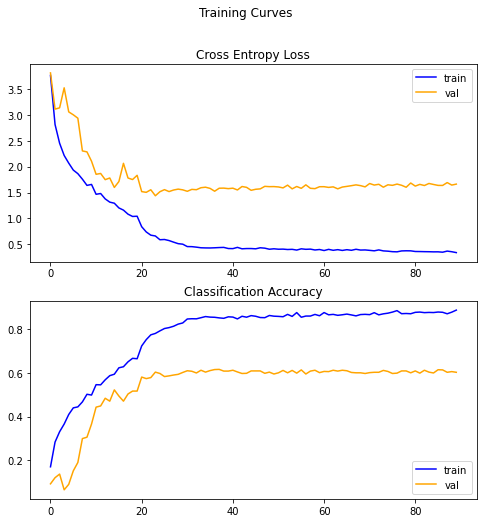


Test set evaluation metrics
5/5 [==============================] - 0s 22ms/step - loss: 1.5685 - accuracy: 0.6453
loss: 1.57
accuracy: 0.65


In [0]:
third_model_32.save("/content/drive/My Drive/NN/Lab3/MODELS/third_model_32x32.h5")
model_report(third_model_32, third_model_32_history,32, 5)

### Third Model's Optimization

In [0]:
third_model_32_opt = init_third_model(summary = True,input=32)
epochs = 120
steps_per_epoch = 50
validation_steps = 10
third_model_32_opt_history = train_model(third_model_32_opt,'third_model_32_opt',32 ,epochs, steps_per_epoch , validation_steps,optimization=True)


Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_41 (Conv2D)           (None, 30, 30, 32)        896       
_________________________________________________________________
batch_normalization_5 (Batch (None, 30, 30, 32)        96        
_________________________________________________________________
re_lu_3 (ReLU)               (None, 30, 30, 32)        0         
_________________________________________________________________
conv2d_42 (Conv2D)           (None, 28, 28, 64)        18496     
_________________________________________________________________
batch_normalization_6 (Batch (None, 28, 28, 64)        192       
_________________________________________________________________
re_lu_4 (ReLU)               (None, 28, 28, 64)        0         
_________________________________________________________________
conv2d_43 (Conv2D)           (None, 26, 26, 128)     

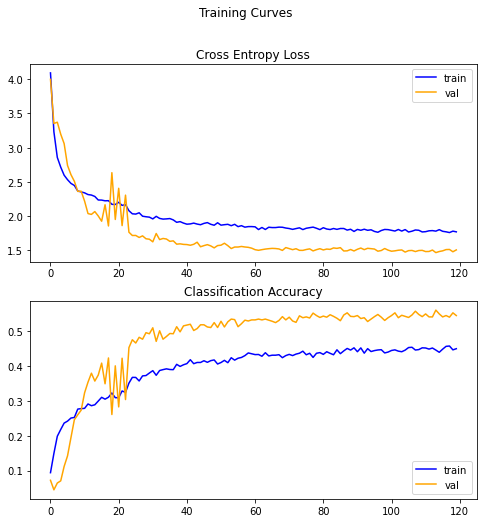


Test set evaluation metrics
5/5 [==============================] - 0s 23ms/step - loss: 1.4437 - accuracy: 0.5891
loss: 1.44
accuracy: 0.59


In [0]:
third_model_32_opt.save("/content/drive/My Drive/NN/Lab3/MODELS/third_model_opt_32x32.h5")
model_report(third_model_32_opt, third_model_32_opt_history,32, 5) 

##  Fourth Model from Scratch
---

### This model consists of 2 blocks , with 2 consecutive Conv Layers maxpooling and dropout each one 

Architecture's Brief Description

1st Block
```
- Convolutional Layer
- Convolutional Layer
- Maxpooling Layer
- Dropout
```
2nd Block
```
- Convolutional Layer
- Convolutional Layer
- Maxpooling Layer
- Dropout
```
Fully Connected Layers
```
- Dense layer
- Dropout layer
- Dense layer
- Dropout layer
- Dense layer
```

In [0]:
def init_fourth_model(summary,input):
  model = models.Sequential()


  model.add(layers.Conv2D(32, (5, 5),padding='valid',activation='relu', input_shape=(input, input, 3)))
  model.add(layers.Conv2D(64, (5, 5),padding='valid',activation='relu'))

  model.add(layers.MaxPooling2D(pool_size=(2, 2)))
  model.add(layers.Dropout(rate=0.25))
  
  model.add(layers.Conv2D(64, (3, 3),padding='valid',activation='relu'))
  model.add(layers.Conv2D(64, (3, 3),padding='valid',activation='relu'))
  
  model.add(layers.MaxPooling2D(pool_size=(2, 2)))
  model.add(layers.Dropout(rate=0.25))

  ###Linear
  
  model.add(layers.Flatten())
  model.add(layers.Dense(1024, activation='relu'))
  model.add(layers.Dropout(rate=0.4))

  model.add(layers.Dense(512, activation='relu'))
  model.add(layers.Dropout(rate=0.4))
  
  model.add(layers.Dense(100, activation='softmax'))
  
  model.compile(optimizer=tf.optimizers.Adam(), loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=["accuracy"])
  if summary: 
    model.summary()
  return model
  

  
  model.compile(optimizer=tf.optimizers.Adam(), loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=["accuracy"])
  if summary: 
    model.summary()
  return model

In [0]:
fourth_model_32 = init_fourth_model(summary = True ,input=32)
epochs = 70
steps_per_epoch = 40
validation_steps = 10
fourth_model_32_history = train_model(fourth_model_32,'fourth_model_32',32, epochs, steps_per_epoch , validation_steps,optimization=False)

Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_45 (Conv2D)           (None, 28, 28, 32)        2432      
_________________________________________________________________
conv2d_46 (Conv2D)           (None, 24, 24, 64)        51264     
_________________________________________________________________
max_pooling2d_22 (MaxPooling (None, 12, 12, 64)        0         
_________________________________________________________________
dropout_9 (Dropout)          (None, 12, 12, 64)        0         
_________________________________________________________________
conv2d_47 (Conv2D)           (None, 10, 10, 64)        36928     
_________________________________________________________________
conv2d_48 (Conv2D)           (None, 8, 8, 64)          36928     
_________________________________________________________________
max_pooling2d_23 (MaxPooling (None, 4, 4, 64)        

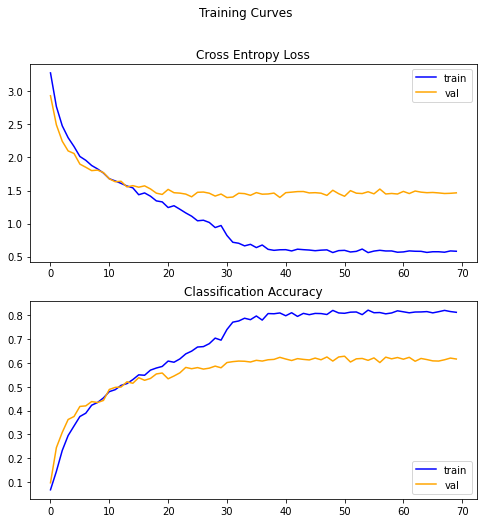


Test set evaluation metrics
5/5 [==============================] - 0s 12ms/step - loss: 1.3174 - accuracy: 0.6344
loss: 1.32
accuracy: 0.63


In [0]:
fourth_model_32.save("/content/drive/My Drive/NN/Lab3/MODELS/fourth_model_32x32.h5")
model_report(fourth_model_32,fourth_model_32_history,32, 5)

### Fourth Model's Optimization

In [0]:
fourth_model_32_opt = init_fourth_model(summary = True ,input=32)
epochs = 100
steps_per_epoch = 50
validation_steps = 10
fourth_model_32_opt_history = train_model(fourth_model_32_opt,'fourth_model_32_opt',32, epochs, steps_per_epoch , validation_steps,optimization=True)


Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_49 (Conv2D)           (None, 28, 28, 32)        2432      
_________________________________________________________________
conv2d_50 (Conv2D)           (None, 24, 24, 64)        51264     
_________________________________________________________________
max_pooling2d_24 (MaxPooling (None, 12, 12, 64)        0         
_________________________________________________________________
dropout_13 (Dropout)         (None, 12, 12, 64)        0         
_________________________________________________________________
conv2d_51 (Conv2D)           (None, 10, 10, 64)        36928     
_________________________________________________________________
conv2d_52 (Conv2D)           (None, 8, 8, 64)          36928     
_________________________________________________________________
max_pooling2d_25 (MaxPooling (None, 4, 4, 64)        

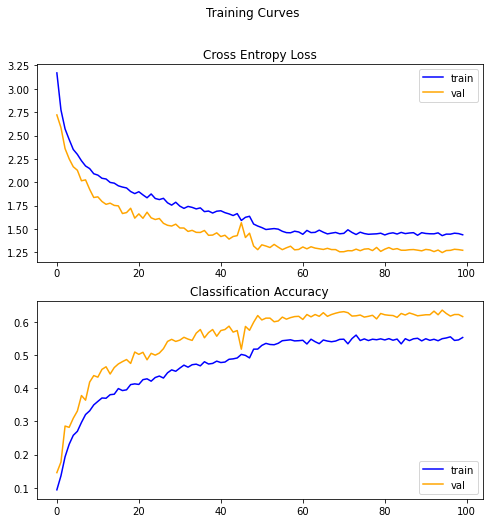


Test set evaluation metrics
5/5 [==============================] - 0s 11ms/step - loss: 1.1796 - accuracy: 0.6281
loss: 1.18
accuracy: 0.63


In [0]:
fourth_model_32_opt.save("/content/drive/My Drive/NN/Lab3/MODELS/fourth_model_opt_32x32.h5")
model_report(fourth_model_32_opt,fourth_model_32_opt_history,32, 5)

---
## Net Models for 78x78x3 images
---

## First model for image size 78x78x3 

In [0]:
first_model_78 = init_first_model(summary = True ,input=78)
epochs = 100
steps_per_epoch = 40
validation_steps = 10
first_model_78_history = train_model(first_model_78,'first_model_78',78, epochs, steps_per_epoch , validation_steps,optimization=False)

Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_53 (Conv2D)           (None, 76, 76, 32)        896       
_________________________________________________________________
max_pooling2d_26 (MaxPooling (None, 38, 38, 32)        0         
_________________________________________________________________
conv2d_54 (Conv2D)           (None, 36, 36, 64)        18496     
_________________________________________________________________
max_pooling2d_27 (MaxPooling (None, 18, 18, 64)        0         
_________________________________________________________________
conv2d_55 (Conv2D)           (None, 16, 16, 64)        36928     
_________________________________________________________________
conv2d_56 (Conv2D)           (None, 14, 14, 64)        36928     
_________________________________________________________________
flatten_14 (Flatten)         (None, 12544)           

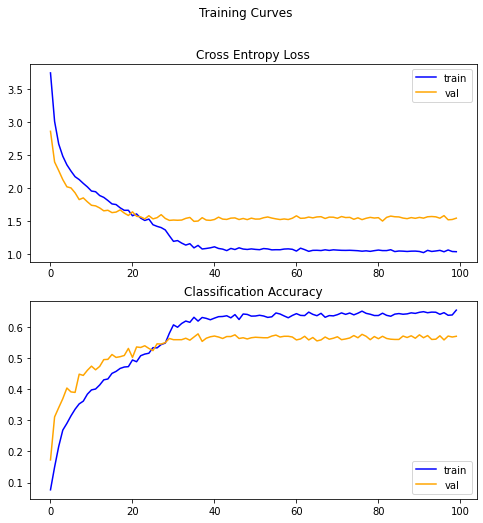


Test set evaluation metrics
5/5 [==============================] - 1s 112ms/step - loss: 1.5037 - accuracy: 0.5688
loss: 1.50
accuracy: 0.57


In [0]:
first_model_78.save("/content/drive/My Drive/NN/Lab3/MODELS/first_model_78x78.h5")
model_report(first_model_78,78, first_model_78_history, 5)

### First Model's Optimization for image size 78x78x3

In [0]:
first_model_78_opt = init_first_model(summary = True ,input=78)
epochs = 150
steps_per_epoch = 50
validation_steps = 10
first_model_78_opt_history = train_model(first_model_78_opt,'first_model_78_opt',78, epochs, steps_per_epoch , validation_steps,optimization=True)

Model: "sequential_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_57 (Conv2D)           (None, 76, 76, 32)        896       
_________________________________________________________________
max_pooling2d_28 (MaxPooling (None, 38, 38, 32)        0         
_________________________________________________________________
conv2d_58 (Conv2D)           (None, 36, 36, 64)        18496     
_________________________________________________________________
max_pooling2d_29 (MaxPooling (None, 18, 18, 64)        0         
_________________________________________________________________
conv2d_59 (Conv2D)           (None, 16, 16, 64)        36928     
_________________________________________________________________
conv2d_60 (Conv2D)           (None, 14, 14, 64)        36928     
_________________________________________________________________
flatten_15 (Flatten)         (None, 12544)           

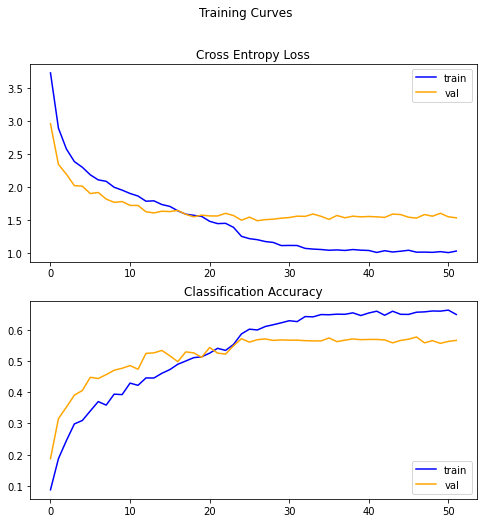


Test set evaluation metrics
5/5 [==============================] - 1s 107ms/step - loss: 1.6168 - accuracy: 0.5562
loss: 1.62
accuracy: 0.56


In [0]:
first_model_78_opt.save("/content/drive/My Drive/NN/Lab3/MODELS/first_model_opt_78x78.h5")
model_report(first_model_78_opt, first_model_78_opt_history,78, 5)

## Second model for image size 78x78x3 

In [0]:
second_model_78 = init_second_model(summary = True ,input=78)
epochs = 70
steps_per_epoch = 40
validation_steps = 10
second_model_78_history = train_model(second_model_78,'second_model_78',78, epochs, steps_per_epoch , validation_steps,optimization=False)

Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_61 (Conv2D)           (None, 76, 76, 32)        896       
_________________________________________________________________
max_pooling2d_30 (MaxPooling (None, 38, 38, 32)        0         
_________________________________________________________________
batch_normalization_8 (Batch (None, 38, 38, 32)        96        
_________________________________________________________________
conv2d_62 (Conv2D)           (None, 36, 36, 64)        18496     
_________________________________________________________________
max_pooling2d_31 (MaxPooling (None, 18, 18, 64)        0         
_________________________________________________________________
conv2d_63 (Conv2D)           (None, 16, 16, 128)       73856     
_________________________________________________________________
max_pooling2d_32 (MaxPooling (None, 8, 8, 128)       

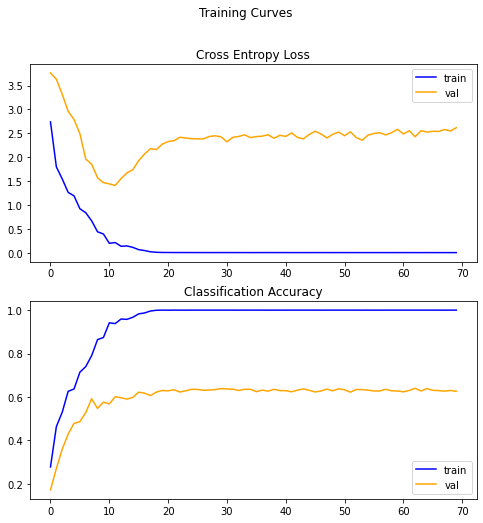


Test set evaluation metrics
5/5 [==============================] - 1s 104ms/step - loss: 2.2610 - accuracy: 0.6641
loss: 2.26
accuracy: 0.66


In [0]:
second_model_78.save("/content/drive/My Drive/NN/Lab3/MODELS/second_model_78x78.h5")
model_report(second_model_78, second_model_78_history,78, 5)

### Second Model's Optimization for image size 78x78x3

In [0]:
second_model_78_opt = init_second_model(summary = True ,input=78)
epochs = 150
steps_per_epoch = 50
validation_steps = 10
second_model_78_opt_history = train_model(second_model_78_opt,'second_model_78_opt',78, epochs, steps_per_epoch , validation_steps,optimization=True)

Model: "sequential_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_64 (Conv2D)           (None, 76, 76, 32)        896       
_________________________________________________________________
max_pooling2d_33 (MaxPooling (None, 38, 38, 32)        0         
_________________________________________________________________
batch_normalization_9 (Batch (None, 38, 38, 32)        96        
_________________________________________________________________
conv2d_65 (Conv2D)           (None, 36, 36, 64)        18496     
_________________________________________________________________
max_pooling2d_34 (MaxPooling (None, 18, 18, 64)        0         
_________________________________________________________________
conv2d_66 (Conv2D)           (None, 16, 16, 128)       73856     
_________________________________________________________________
max_pooling2d_35 (MaxPooling (None, 8, 8, 128)       

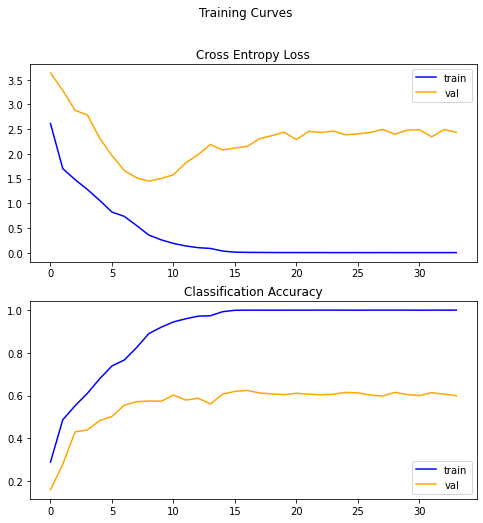


Test set evaluation metrics
5/5 [==============================] - 1s 109ms/step - loss: 1.3864 - accuracy: 0.6125
loss: 1.39
accuracy: 0.61


In [0]:
second_model_78_opt.save("/content/drive/My Drive/NN/Lab3/MODELS/second_model_opt_78x78.h5")
model_report(second_model_78_opt,second_model_78_opt_history,78, 5)

## Fifth model

### This model consists of 3 blocks , with Conv Layers maxpooling and Batch Normalization 

Architecture's Brief Description

1st Block
```
- Convolutional Layer
- Maxpooling Layer
- BatchNormalization
- Dropout layer

```
2nd Block
```
- Convolutional Layer
- Maxpooling Layer
- BatchNormalization
- Dropout layer
```
3rd Block
```
- Convolutional Layer
- Maxpooling Layer
- BatchNormalization
- Dropout layer
```
Fully Connected Layers
```
- AveragePooling2D
- Dense layer
- BatchNormalization
- Dropout layer
- Dense layer
```

In [0]:
def init_fifth_model(summary,input,optimizer):
  model = models.Sequential()

  model.add(layers.Conv2D(32, (5, 5),padding='valid',activation='relu', input_shape=(input, input, 3)))
  model.add(layers.MaxPooling2D(pool_size=(2, 2)))
  model.add(layers.BatchNormalization(axis=-1,scale=False))
  model.add(layers.Dropout(rate=0.2))
  
  model.add(layers.Conv2D(64, (3, 3),padding='valid',activation='relu'))
  model.add(layers.MaxPooling2D(pool_size=(2, 2)))
  model.add(layers.BatchNormalization(axis=-1,scale=False))
  model.add(layers.Dropout(rate=0.2))

  model.add(layers.Conv2D(64, (3, 3),padding='valid',activation='relu'))
  model.add(layers.MaxPooling2D(pool_size=(2, 2)))
  model.add(layers.BatchNormalization(axis=-1,scale=False))
  model.add(layers.Dropout(rate=0.2))
  ###Linear
  model.add(layers.AveragePooling2D(pool_size=(2, 2), strides=None, padding='valid', data_format=None))
  model.add(layers.Flatten())
  model.add(layers.Dense(125,kernel_regularizer=tf.keras.regularizers.l2(0.0001), activation='relu'))
  model.add(layers.BatchNormalization(axis=-1,scale=False))
  model.add(layers.Dropout(rate=0.5))
  model.add(layers.Dense(100, activation='softmax'))
  
  model.compile(optimizer=optimizer, loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=["accuracy"])
  if summary: 
    model.summary()
  return model

In [0]:
optimizer=tf.optimizers.Adam()
fifth_model_78_b32 = init_fifth_model(summary = True ,input=78,optimizer=optimizer)
epochs = 80
steps_per_epoch = 40
validation_steps = 10
fifth_model_78_b32_history = train_best_models(fifth_model_78_b32,'fifth_model_78_b32',78, epochs, steps_per_epoch , validation_steps,optimization=False,batch_size=32)

Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_36 (Conv2D)           (None, 74, 74, 32)        2432      
_________________________________________________________________
max_pooling2d_36 (MaxPooling (None, 37, 37, 32)        0         
_________________________________________________________________
batch_normalization_15 (Batc (None, 37, 37, 32)        96        
_________________________________________________________________
dropout_4 (Dropout)          (None, 37, 37, 32)        0         
_________________________________________________________________
conv2d_37 (Conv2D)           (None, 35, 35, 64)        18496     
_________________________________________________________________
max_pooling2d_37 (MaxPooling (None, 17, 17, 64)        0         
_________________________________________________________________
batch_normalization_16 (Batc (None, 17, 17, 64)      

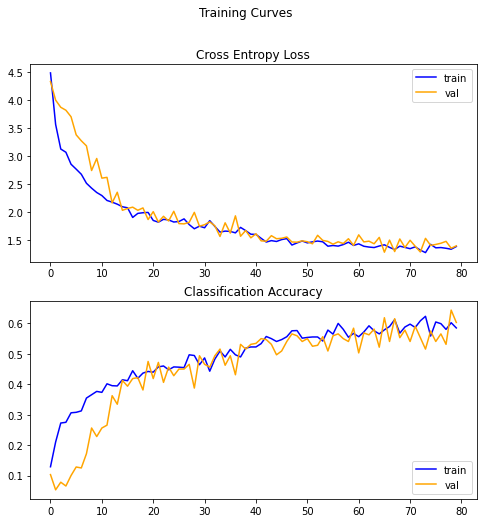


Test set evaluation metrics

5/5 [==============================] - 0s 100ms/step - loss: 1.2689 - accuracy: 0.6750
loss: 1.27
accuracy: 0.68


In [0]:
fifth_model_78_b32.save("/content/drive/My Drive/Νευρωνικά/Lab3/NIKOS_MODELS/fifth_model_78x78_b32.h5")
best_models_report(fifth_model_78_b32, fifth_model_78_b32_history, size=78, evaluation_steps=5 ,batch_size=32)

In [0]:
optimizer=tf.optimizers.Adam()
fifth_model_78_b64 = init_fifth_model(summary = True ,input=78,optimizer=optimizer)
epochs = 80
steps_per_epoch = 40
validation_steps = 10
fifth_model_78_b64_history = train_best_models(fifth_model_78_b64,'fifth_model_78_b64',78, epochs, steps_per_epoch , validation_steps,optimization=False,batch_size=64)

Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_39 (Conv2D)           (None, 74, 74, 32)        2432      
_________________________________________________________________
max_pooling2d_39 (MaxPooling (None, 37, 37, 32)        0         
_________________________________________________________________
batch_normalization_19 (Batc (None, 37, 37, 32)        96        
_________________________________________________________________
dropout_8 (Dropout)          (None, 37, 37, 32)        0         
_________________________________________________________________
conv2d_40 (Conv2D)           (None, 35, 35, 64)        18496     
_________________________________________________________________
max_pooling2d_40 (MaxPooling (None, 17, 17, 64)        0         
_________________________________________________________________
batch_normalization_20 (Batc (None, 17, 17, 64)      

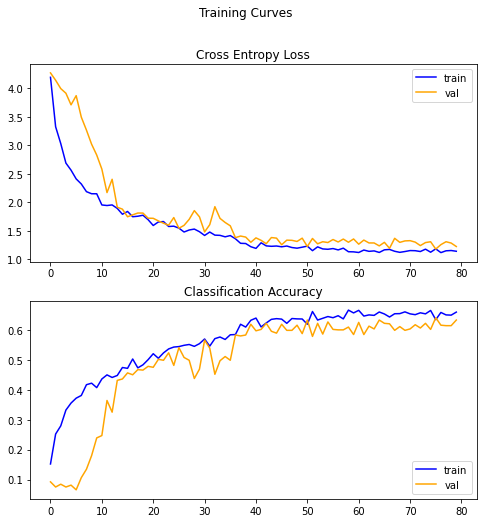


Test set evaluation metrics

5/5 [==============================] - 0s 92ms/step - loss: 1.2675 - accuracy: 0.6406
loss: 1.27
accuracy: 0.64


In [0]:
fifth_model_78_b64.save("/content/drive/My Drive/Νευρωνικά/Lab3/NIKOS_MODELS/fifth_model_78x78_b64.h5")
best_models_report(fifth_model_78_b64, fifth_model_78_b64_history, size=78, evaluation_steps= 5,batch_size=64)

In [0]:
epochs = 80
steps_per_epoch = 40
validation_steps = 10
fifth_model_78_history = train_best_models(fifth_model_78,'fifth_model_78',78, epochs, steps_per_epoch , validation_steps,optimization=False,batch_size=128)

Train for 40 steps, validate for 10 steps
Epoch 1/80
40/40 [==============================] - 5s 117ms/step - loss: 3.9752 - accuracy: 0.1930 - val_loss: 4.2722 - val_accuracy: 0.0836
Epoch 2/80
40/40 [==============================] - 3s 80ms/step - loss: 2.9734 - accuracy: 0.3090 - val_loss: 4.0314 - val_accuracy: 0.0922
Epoch 3/80
40/40 [==============================] - 1s 37ms/step - loss: 2.6037 - accuracy: 0.3654 - val_loss: 3.9592 - val_accuracy: 0.0812
Epoch 4/80
40/40 [==============================] - 3s 78ms/step - loss: 2.3836 - accuracy: 0.3879 - val_loss: 3.8728 - val_accuracy: 0.1055
Epoch 5/80
40/40 [==============================] - 3s 77ms/step - loss: 2.2957 - accuracy: 0.3996 - val_loss: 3.4882 - val_accuracy: 0.1070
Epoch 6/80
40/40 [==============================] - 1s 35ms/step - loss: 2.1391 - accuracy: 0.4264 - val_loss: 3.2227 - val_accuracy: 0.1531
Epoch 7/80
40/40 [==============================] - 3s 76ms/step - loss: 2.0463 - accuracy: 0.4494 - val_loss: 

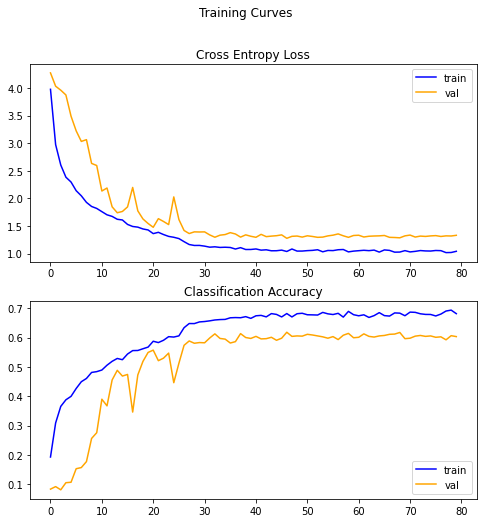


Test set evaluation metrics

5/5 [==============================] - 1s 104ms/step - loss: 1.2121 - accuracy: 0.6375
loss: 1.21
accuracy: 0.64


In [0]:
fifth_model_78.save("/content/drive/My Drive/Νευρωνικά/Lab3/NIKOS_MODELS/fifth_model_78x78.h5")
best_models_report(fifth_model_78, fifth_model_78_history, size=78, evaluation_steps= 5,batch_size=128)

### Fifth Model's Optimization

In [0]:
fifth_model_78_b32_opt = init_fifth_model(summary = True ,input=78,optimizer=optimizer)
epochs = 120
steps_per_epoch = 50
validation_steps = 10
fifth_model_78_b32_opt_history = train_best_models(fifth_model_78_b32_opt,'fifth_model_78_b32_opt',78, epochs, steps_per_epoch , validation_steps,optimization=True,batch_size=32)

Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_42 (Conv2D)           (None, 74, 74, 32)        2432      
_________________________________________________________________
max_pooling2d_42 (MaxPooling (None, 37, 37, 32)        0         
_________________________________________________________________
batch_normalization_23 (Batc (None, 37, 37, 32)        96        
_________________________________________________________________
dropout_12 (Dropout)         (None, 37, 37, 32)        0         
_________________________________________________________________
conv2d_43 (Conv2D)           (None, 35, 35, 64)        18496     
_________________________________________________________________
max_pooling2d_43 (MaxPooling (None, 17, 17, 64)        0         
_________________________________________________________________
batch_normalization_24 (Batc (None, 17, 17, 64)      

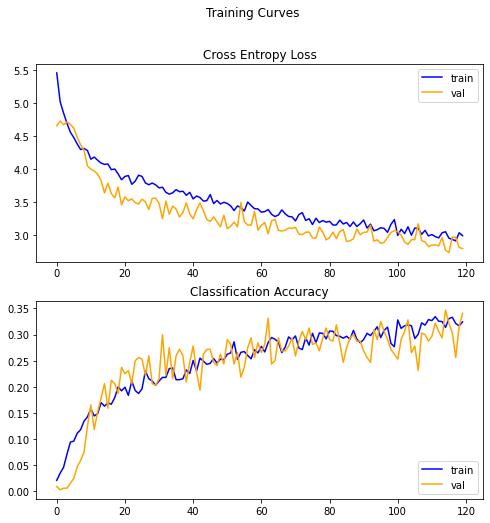


Test set evaluation metrics

5/5 [==============================] - 0s 89ms/step - loss: 2.7064 - accuracy: 0.3313
loss: 2.71
accuracy: 0.33


In [0]:
fifth_model_78_b32_opt.save("/content/drive/My Drive/Νευρωνικά/Lab3/NIKOS_MODELS/fifth_model_78x78_b32_opt.h5")
best_models_report(fifth_model_78_b32_opt, fifth_model_78_b32_opt_history, size=78, evaluation_steps= 5,batch_size=32)

In [0]:
fifth_model_78_b64_opt = init_fifth_model(summary = True ,input=78,optimizer=optimizer)
epochs = 200
steps_per_epoch = 50
validation_steps = 10
fifth_model_78_b64_opt_history = train_best_models(fifth_model_78_b64_opt,'fifth_model_78_b64_opt',78, epochs, steps_per_epoch , validation_steps,optimization=True,batch_size=64)

Model: "sequential_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_45 (Conv2D)           (None, 74, 74, 32)        2432      
_________________________________________________________________
max_pooling2d_45 (MaxPooling (None, 37, 37, 32)        0         
_________________________________________________________________
batch_normalization_27 (Batc (None, 37, 37, 32)        96        
_________________________________________________________________
dropout_16 (Dropout)         (None, 37, 37, 32)        0         
_________________________________________________________________
conv2d_46 (Conv2D)           (None, 35, 35, 64)        18496     
_________________________________________________________________
max_pooling2d_46 (MaxPooling (None, 17, 17, 64)        0         
_________________________________________________________________
batch_normalization_28 (Batc (None, 17, 17, 64)      

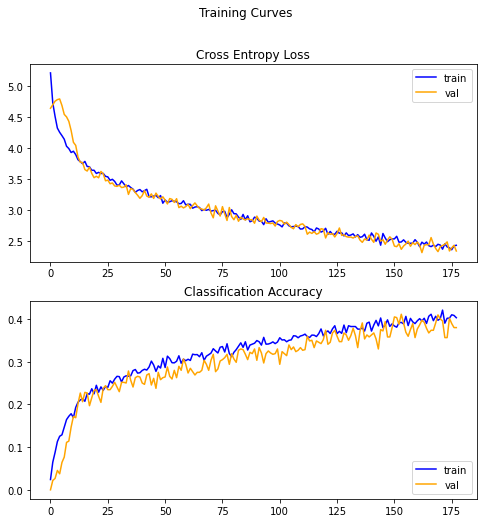


Test set evaluation metrics

5/5 [==============================] - 1s 104ms/step - loss: 2.3704 - accuracy: 0.4094
loss: 2.37
accuracy: 0.41


In [0]:
fifth_model_78_b64_opt.save("/content/drive/My Drive/Νευρωνικά/Lab3/NIKOS_MODELS/fifth_model_78x78_b64_opt.h5")
best_models_report(fifth_model_78_b64_opt, fifth_model_78_b64_opt_history, size=78, evaluation_steps= 5,batch_size=64)

In [0]:
fifth_model_78_opt = init_fifth_model(summary = True ,input=78,optimizer=optimizer)
epochs = 200
steps_per_epoch = 30
validation_steps = 10
fifth_model_78_opt_history = train_best_models(fifth_model_78_opt,'fifth_model_78_opt',78, epochs, steps_per_epoch , validation_steps,optimization=True,batch_size=128)

Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_48 (Conv2D)           (None, 74, 74, 32)        2432      
_________________________________________________________________
max_pooling2d_48 (MaxPooling (None, 37, 37, 32)        0         
_________________________________________________________________
batch_normalization_31 (Batc (None, 37, 37, 32)        96        
_________________________________________________________________
dropout_20 (Dropout)         (None, 37, 37, 32)        0         
_________________________________________________________________
conv2d_49 (Conv2D)           (None, 35, 35, 64)        18496     
_________________________________________________________________
max_pooling2d_49 (MaxPooling (None, 17, 17, 64)        0         
_________________________________________________________________
batch_normalization_32 (Batc (None, 17, 17, 64)      

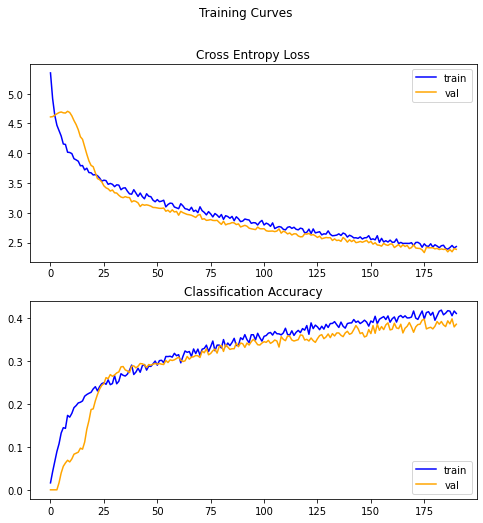


Test set evaluation metrics

5/5 [==============================] - 0s 100ms/step - loss: 2.2561 - accuracy: 0.4375
loss: 2.26
accuracy: 0.44


In [0]:
fifth_model_78_opt.save("/content/drive/My Drive/Νευρωνικά/Lab3/NIKOS_MODELS/fifth_model_opt_78x78.h5")
best_models_report(fifth_model_78_opt, fifth_model_78_opt_history, size=78, evaluation_steps= 5,batch_size=128)

## Sixth model

### This model consists of 3 blocks , with Conv Layers maxpooling and Batch Normalization 

Architecture's Brief Description

1st Block
```
- Convolutional Layer
- Convolutional Layer
- Maxpooling Layer
- Dropout
```
2nd Block
```
- Convolutional Layer
- Convolutional Layer
- Maxpooling Layer
- Dropout
```
3rd Block
```
- Convolutional Layer
- Convolutional Layer
```
Fully Connected Layers
```
- AveragePooling2D
- Dense layer
- Dropout layer
- Dense layer
```

In [0]:
def init_sixth_model(summary,input):
  model = models.Sequential()

  model.add(layers.Conv2D(32, (7, 7),padding='valid',activation='relu', input_shape=(input, input, 3)))
  model.add(layers.Conv2D(64, (7, 7),padding='valid',activation='relu'))

  model.add(layers.MaxPooling2D(pool_size=(2, 2)))
  model.add(layers.Dropout(rate=0.25))
  


  model.add(layers.Conv2D(64, (5, 5),padding='valid',activation='relu'))
  model.add(layers.Conv2D(64, (5, 5),padding='valid',activation='relu'))
  
  model.add(layers.MaxPooling2D(pool_size=(2, 2)))
  model.add(layers.Dropout(rate=0.25))
  
  model.add(layers.Conv2D(64, (3, 3),padding='valid',activation='relu'))
  model.add(layers.Conv2D(64, (3, 3),padding='valid',activation='relu'))

  ###Linear
  
  model.add(layers.AveragePooling2D(pool_size=(2, 2)))
  model.add(layers.Flatten())
  model.add(layers.Dense(512, activation='relu'))
  model.add(layers.Dropout(rate=0.5))
  model.add(layers.Dense(100, activation='softmax'))
  
  model.compile(optimizer=tf.optimizers.Adam(), loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=["accuracy"])
  if summary: 
    model.summary()
  return model

In [0]:
sixth_model_78 = init_sixth_model(summary = True ,input=78)
epochs = 90
steps_per_epoch = 40
validation_steps = 10
sixth_model_78_history = train_model(sixth_model_78,'sixth_model_78',78, epochs, steps_per_epoch , validation_steps,optimization=False)

Model: "sequential_21"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_76 (Conv2D)           (None, 72, 72, 32)        4736      
_________________________________________________________________
conv2d_77 (Conv2D)           (None, 66, 66, 64)        100416    
_________________________________________________________________
max_pooling2d_45 (MaxPooling (None, 33, 33, 64)        0         
_________________________________________________________________
dropout_31 (Dropout)         (None, 33, 33, 64)        0         
_________________________________________________________________
conv2d_78 (Conv2D)           (None, 29, 29, 64)        102464    
_________________________________________________________________
conv2d_79 (Conv2D)           (None, 25, 25, 64)        102464    
_________________________________________________________________
max_pooling2d_46 (MaxPooling (None, 12, 12, 64)      

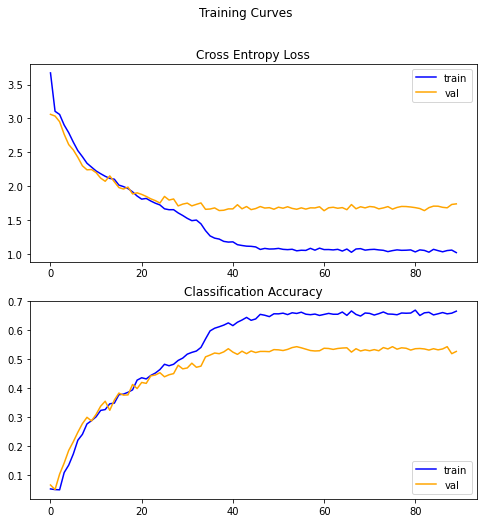


Test set evaluation metrics
5/5 [==============================] - 1s 126ms/step - loss: 1.6201 - accuracy: 0.5281
loss: 1.62
accuracy: 0.53


In [0]:
sixth_model_78.save("/content/drive/My Drive/NN/Lab3/MODELS/sixth_model_78x78.h5")
model_report(sixth_model_78, sixth_model_78_history,78, 5)


### Sixth Model's Optimization


In [0]:
sixth_model_78_opt = init_sixth_model(summary = True ,input=78)
epochs = 150
steps_per_epoch = 50
validation_steps = 10
sixth_model_78_opt_history = train_model(sixth_model_78_opt,'sixth_model_78_opt',78, epochs, steps_per_epoch , validation_steps,optimization=True)


Model: "sequential_22"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_82 (Conv2D)           (None, 72, 72, 32)        4736      
_________________________________________________________________
conv2d_83 (Conv2D)           (None, 66, 66, 64)        100416    
_________________________________________________________________
max_pooling2d_47 (MaxPooling (None, 33, 33, 64)        0         
_________________________________________________________________
dropout_34 (Dropout)         (None, 33, 33, 64)        0         
_________________________________________________________________
conv2d_84 (Conv2D)           (None, 29, 29, 64)        102464    
_________________________________________________________________
conv2d_85 (Conv2D)           (None, 25, 25, 64)        102464    
_________________________________________________________________
max_pooling2d_48 (MaxPooling (None, 12, 12, 64)      

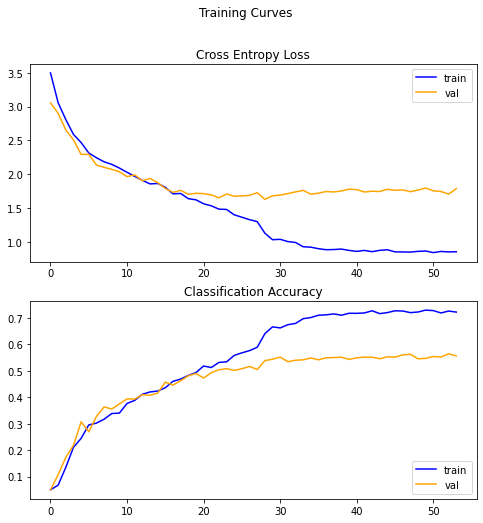


Test set evaluation metrics
5/5 [==============================] - 1s 137ms/step - loss: 1.7264 - accuracy: 0.5344
loss: 1.73
accuracy: 0.53


In [0]:
sixth_model_78_opt.save("/content/drive/My Drive/NN/Lab3/MODELS/sixth_model_opt_78x78.h5")
model_report(sixth_model_78_opt, sixth_model_78_opt_history,78, 5)

TensorBoard


---


In [0]:
%load_ext tensorboard

---


### Μεταφορά μάθησης: VGG16

In [0]:
# transfer learning: VGG16 trained on ImageNet without the top layer

def init_VGG16_model(summary):
  VGG16_MODEL=tf.keras.applications.VGG16(input_shape=(img_rows, img_cols, img_channels), include_top=False, weights='imagenet')

  # unfreeze conv layers
  VGG16_MODEL.trainable=True

  dropout_layer = tf.keras.layers.Dropout(rate = 0.5)
  global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

  # add top layer for CIFAR100 classification
  prediction_layer = tf.keras.layers.Dense(len(CIFAR100_LABELS_LIST),activation='softmax')
  model = tf.keras.Sequential([VGG16_MODEL, dropout_layer, global_average_layer, prediction_layer])
  model.compile(optimizer=tf.optimizers.Adam(learning_rate=0.00005), loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=["accuracy"])
  if summary: 
    model.summary()
  return model

In [0]:
VGG16_MODEL = init_VGG16_model(summary = True)
VGG16_MODEL_history = train_model(VGG16_MODEL, 25, 40, 10)

In [0]:
model_report(VGG16_MODEL, VGG16_MODEL_history, 30)

# Transfer Learning

##  XCEPTION

The Xception model constists of 71 layers:
![Xception](https://imgur.com/tA2qDIQ.jpg)
The default input size is 299x299x3. Keras allows us to change the input size of the model using the parameter `input_shape`. For this model though, the width and height should be no smaller than 71. Therefore, we are going to resize our images.

In addition, we won't include its default top layer. We will add a top layer specified for CIFAR100 classification (20 classes).


In [0]:
def init_Xception_model(summary, trainable):
  Xception_MODEL=Xception(input_shape=TARGET_SIZE, include_top=False, weights='imagenet')

  if (trainable == "all"):
    # unfreeze conv layers
    Xception_MODEL.trainable=True
  elif (trainable == "top"):
    Xception_MODEL.trainable=False
  else:
    percentage = float(trainable)/100
    nlayers =  len(Xception_MODEL.layers)
    nfreeze = ceil(nlayers*percentage)

    for layer in Xception_MODEL.layers[:nfreeze]:
	    layer.trainable = False


  dropout_layer = tf.keras.layers.Dropout(rate = 0.5)
  global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

  # add top layer for CIFAR100 classification
  prediction_layer = tf.keras.layers.Dense(len(CIFAR100_LABELS_LIST),activation='softmax')
  model = tf.keras.Sequential([Xception_MODEL, dropout_layer, global_average_layer, prediction_layer])
  model.compile(optimizer=tf.optimizers.Adam(learning_rate=0.00005), loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=["accuracy"])
  if summary: 
    model.summary()
  return model

### All layers are trainable

In [0]:
Xception_MODEL_all = init_Xception_model( True, "all")
Xception_MODEL_history_all = train_model_TL(Xception_MODEL_all, "Xception_all", 78, 200, 40, 10)

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
xception (Model)             (None, 3, 3, 2048)        20861480  
_________________________________________________________________
dropout_4 (Dropout)          (None, 3, 3, 2048)        0         
_________________________________________________________________
global_average_pooling2d_4 ( (None, 2048)              0         
_________________________________________________________________
dense_4 (Dense)              (None, 100)               204900    
Total params: 21,066,380
Trainable params: 21,011,852
Non-trainable params: 54,528
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 44s 1s/step - loss: 4.1637 - accuracy: 0.1420 - val_loss: 3.1762 - val_accuracy: 0.3508
Epoch 2/200
40/40 [==============================] -

In [0]:
Xception_MODEL_all.save("/content/drive/My Drive/NN/Lab3/MODELS/Xception_all_trainable_78x78.h5")

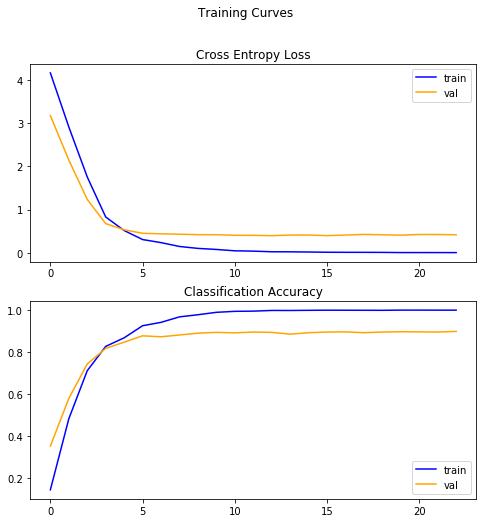


Test set evaluation metrics
30/30 [==============================] - 7s 237ms/step - loss: 0.4006 - accuracy: 0.8969
loss: 0.40
accuracy: 0.90


In [0]:
model_report(Xception_MODEL_all, Xception_MODEL_history_all, 78, 30)

### Freeze first 10%

In [0]:
Xception_MODEL_10 = init_Xception_model(summary = True, trainable = "10")
Xception_MODEL_history_10 = train_model_TL(Xception_MODEL_10,"Xception_10", 78, 200, 40, 10)

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
xception (Model)             (None, 3, 3, 2048)        20861480  
_________________________________________________________________
dropout_3 (Dropout)          (None, 3, 3, 2048)        0         
_________________________________________________________________
global_average_pooling2d_3 ( (None, 2048)              0         
_________________________________________________________________
dense_3 (Dense)              (None, 100)               204900    
Total params: 21,066,380
Trainable params: 20,957,356
Non-trainable params: 109,024
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 37s 928ms/step - loss: 4.1517 - accuracy: 0.1533 - val_loss: 3.2252 - val_accuracy: 0.3406
Epoch 2/200
40/40 [=============================

In [0]:
Xception_MODEL_10.save("/content/drive/My Drive/NN/Lab3/MODELS/Xception_10_trainable_78x78.h5")

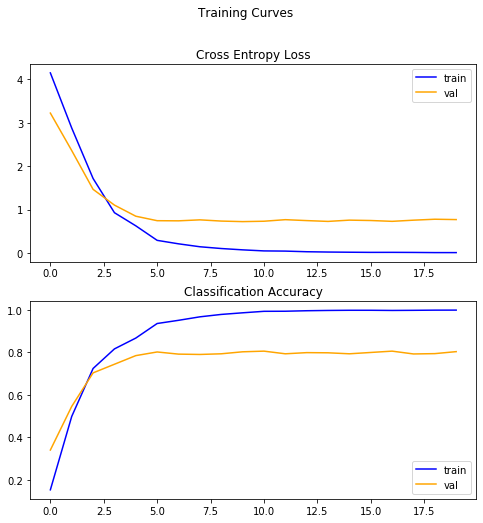


Test set evaluation metrics
30/30 [==============================] - 7s 239ms/step - loss: 0.7589 - accuracy: 0.8008
loss: 0.76
accuracy: 0.80


In [0]:
model_report(Xception_MODEL_10, Xception_MODEL_history_10, 78, 30)

### Freeze first 20%

In [0]:
Xception_MODEL_20 = init_Xception_model(summary = True, trainable = "20")
Xception_MODEL_history_20 = train_model_TL(Xception_MODEL_20,"Xception_20", 78, 200, 40, 10)

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
xception (Model)             (None, 3, 3, 2048)        20861480  
_________________________________________________________________
dropout_2 (Dropout)          (None, 3, 3, 2048)        0         
_________________________________________________________________
global_average_pooling2d_2 ( (None, 2048)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 100)               204900    
Total params: 21,066,380
Trainable params: 20,821,036
Non-trainable params: 245,344
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 18s 450ms/step - loss: 4.0939 - accuracy: 0.1592 - val_loss: 3.2111 - val_accuracy: 0.3227
Epoch 2/200
40/40 [=============================

In [0]:
Xception_MODEL_20.save("/content/drive/My Drive/NN/Lab3/MODELS/Xception_20_trainable_78x78.h5")

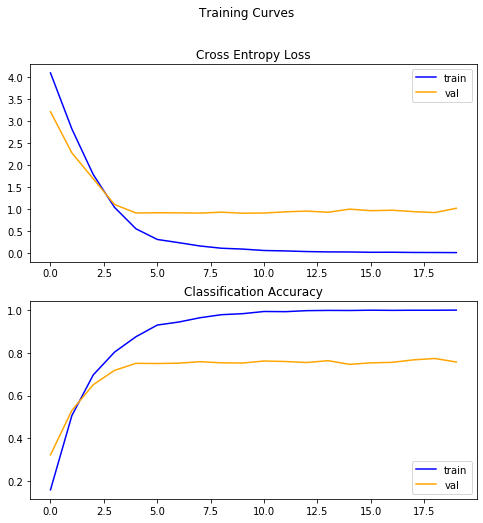


Test set evaluation metrics
30/30 [==============================] - 3s 97ms/step - loss: 0.9077 - accuracy: 0.7677
loss: 0.91
accuracy: 0.77


In [0]:
model_report(Xception_MODEL_20, Xception_MODEL_history_20, 78, 30)

### Only top layer is trainable

In [0]:
Xception_MODEL_top = init_Xception_model(summary = True, trainable = "top")
Xception_MODEL_history_top = train_model_TL(Xception_MODEL_top,"Xception_top", 78, 200, 40, 10)

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
xception (Model)             (None, 3, 3, 2048)        20861480  
_________________________________________________________________
dropout_3 (Dropout)          (None, 3, 3, 2048)        0         
_________________________________________________________________
global_average_pooling2d_3 ( (None, 2048)              0         
_________________________________________________________________
dense_3 (Dense)              (None, 100)               204900    
Total params: 21,066,380
Trainable params: 204,900
Non-trainable params: 20,861,480
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 11s 274ms/step - loss: 4.4610 - accuracy: 0.0375 - val_loss: 3.9733 - val_accuracy: 0.0586
Epoch 2/200
40/40 [=============================

In [0]:
Xception_MODEL_top.save("/content/drive/My Drive/NN/Lab3/MODELS/Xception_top_trainable_78x78.h5")

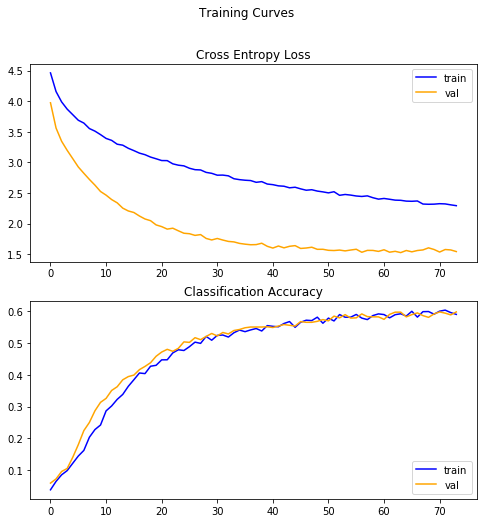


Test set evaluation metrics
30/30 [==============================] - 3s 98ms/step - loss: 1.5799 - accuracy: 0.5896
loss: 1.58
accuracy: 0.59


In [0]:
model_report(Xception_MODEL_top, Xception_MODEL_history_top, 78, 30)

##  VGG16 

VGG16 consists of the following 16 layers:

![VGG16](https://neurohive.io/wp-content/uploads/2018/11/vgg16-1-e1542731207177.png)

The default input size is 224x224x3. Keras allows us to change the input size of the model using the parameter `input_shape`.

In addition, we won't include its default top layer. We will add a top layer specified for CIFAR100 classification (20 classes).

In [0]:
# transfer learning: VGG16 trained on ImageNet without the top layer

def init_VGG16_model(summary, trainable):
  VGG16_MODEL=VGG16(input_shape=(img_rows, img_cols, img_channels), include_top=False, weights='imagenet')

  if (trainable == "all"):
    # unfreeze conv layers
    VGG16_MODEL.trainable=True
  elif (trainable == "top"):
    VGG16_MODEL.trainable=False
  else:
    percentage = float(trainable)/100
    nlayers =  len(VGG16_MODEL.layers)
    nfreeze = ceil(nlayers*percentage)

    for layer in VGG16_MODEL.layers[:nfreeze]:
	    layer.trainable = False


  dropout_layer = tf.keras.layers.Dropout(rate = 0.5)
  global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

  # add top layer for CIFAR100 classification
  prediction_layer = tf.keras.layers.Dense(len(CIFAR100_LABELS_LIST),activation='softmax')
  model = tf.keras.Sequential([VGG16_MODEL, dropout_layer, global_average_layer, prediction_layer])
  model.compile(optimizer=tf.optimizers.Adam(learning_rate=0.00005), loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=["accuracy"])
  if summary: 
    model.summary()
  return model

### All layers are trainable

In [0]:
VGG16_MODEL_all = init_VGG16_model( True, "all")
VGG16_MODEL_history_all = train_model_TL(VGG16_MODEL_all, "VGG16_all", 32, 200, 40, 10)

58892288/58889256 [==============================] - 2s 0us/step
Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 1, 1, 512)         14714688  
_________________________________________________________________
dropout_4 (Dropout)          (None, 1, 1, 512)         0         
_________________________________________________________________
global_average_pooling2d_4 ( (None, 512)               0         
_________________________________________________________________
dense_4 (Dense)              (None, 100)               51300     
Total params: 14,765,988
Trainable params: 14,765,988
Non-trainable params: 0
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 7s 164ms/step - loss: 3.3791 - accuracy: 0.1713 - val_loss: 1.8757 - val_accurac

In [0]:
VGG16_MODEL_all.save("/content/drive/My Drive/NN/Lab3/MODELS/VGG16_all_trainable_32x32.h5")

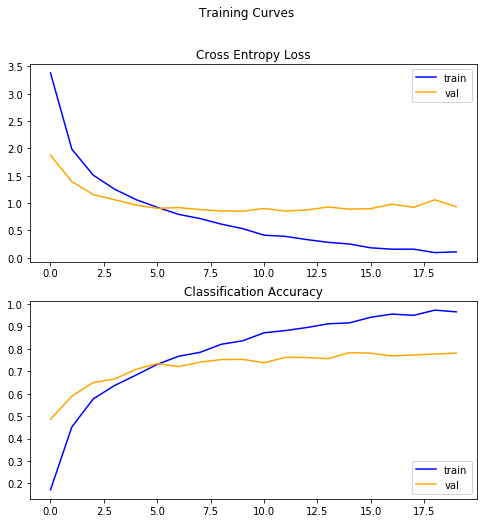


Test set evaluation metrics
30/30 [==============================] - 1s 22ms/step - loss: 0.8879 - accuracy: 0.7865
loss: 0.89
accuracy: 0.79


In [0]:
model_report(VGG16_MODEL_all, VGG16_MODEL_history_all, 32, 30)

### Freeze 10% of the layers

In [0]:
VGG16_MODEL_10 = init_VGG16_model(summary = True, trainable = "10")
VGG16_MODEL_history_10 = train_model_TL(VGG16_MODEL_10,"VGG16_10", 32, 200, 40, 10)

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 1, 1, 512)         14714688  
_________________________________________________________________
dropout_5 (Dropout)          (None, 1, 1, 512)         0         
_________________________________________________________________
global_average_pooling2d_5 ( (None, 512)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 100)               51300     
Total params: 14,765,988
Trainable params: 14,764,196
Non-trainable params: 1,792
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 5s 118ms/step - loss: 3.4114 - accuracy: 0.1939 - val_loss: 1.8993 - val_accuracy: 0.4500
Epoch 2/200
40/40 [==============================] 

In [0]:
VGG16_MODEL_10.save("/content/drive/My Drive/NN/Lab3/MODELS/VGG16_10_trainable_32x32.h5")

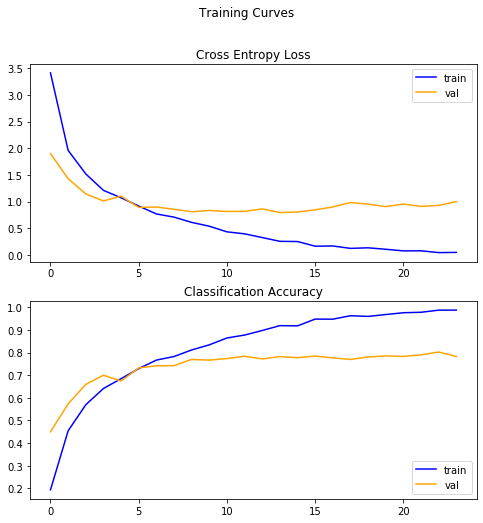


Test set evaluation metrics
30/30 [==============================] - 1s 23ms/step - loss: 0.9929 - accuracy: 0.7919
loss: 0.99
accuracy: 0.79


In [0]:
model_report(VGG16_MODEL_10, VGG16_MODEL_history_10, 32, 30)

### Freeze 20% of the layers

In [0]:
VGG16_MODEL_20 = init_VGG16_model(summary = True, trainable = "20")
VGG16_MODEL_history_20 = train_model_TL(VGG16_MODEL_20,"VGG16_20", 32, 200, 40, 10)

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 1, 1, 512)         14714688  
_________________________________________________________________
dropout_6 (Dropout)          (None, 1, 1, 512)         0         
_________________________________________________________________
global_average_pooling2d_6 ( (None, 512)               0         
_________________________________________________________________
dense_6 (Dense)              (None, 100)               51300     
Total params: 14,765,988
Trainable params: 14,727,268
Non-trainable params: 38,720
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 4s 110ms/step - loss: 3.2535 - accuracy: 0.2092 - val_loss: 1.7967 - val_accuracy: 0.4922
Epoch 2/200
40/40 [==============================]

In [0]:
VGG16_MODEL_20.save("/content/drive/My Drive/NN/Lab3/MODELS/VGG16_20_trainable_32x32.h5")

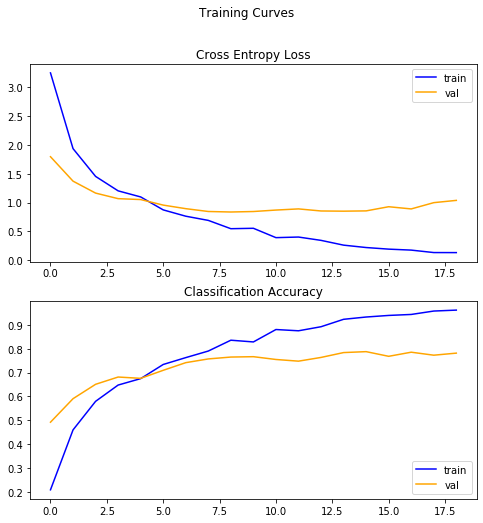


Test set evaluation metrics
30/30 [==============================] - 1s 22ms/step - loss: 0.9377 - accuracy: 0.7898
loss: 0.94
accuracy: 0.79


In [0]:
model_report(VGG16_MODEL_20, VGG16_MODEL_history_20, 32, 30)

### Only top layer is trainable

In [0]:
VGG16_MODEL_top = init_VGG16_model(summary = True, trainable = "top")
VGG16_MODEL_history_top = train_model_TL(VGG16_MODEL_top,"VGG16_top", 32, 200, 40, 10)

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 1, 1, 512)         14714688  
_________________________________________________________________
dropout_7 (Dropout)          (None, 1, 1, 512)         0         
_________________________________________________________________
global_average_pooling2d_7 ( (None, 512)               0         
_________________________________________________________________
dense_7 (Dense)              (None, 100)               51300     
Total params: 14,765,988
Trainable params: 51,300
Non-trainable params: 14,714,688
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 3s 73ms/step - loss: 4.8042 - accuracy: 0.0320 - val_loss: 4.4361 - val_accuracy: 0.0594
Epoch 2/200
40/40 [==============================] 

In [0]:
VGG16_MODEL_top.save("/content/drive/My Drive/NN/Lab3/MODELS/VGG16_top_trainable_32x32.h5")

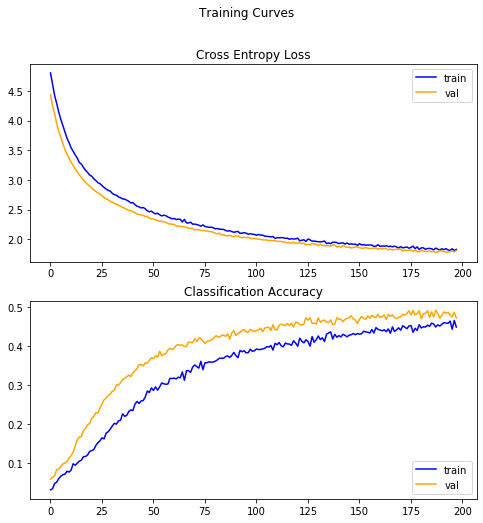


Test set evaluation metrics
30/30 [==============================] - 1s 21ms/step - loss: 1.7357 - accuracy: 0.5003
loss: 1.74
accuracy: 0.50


In [0]:
model_report(VGG16_MODEL_top, VGG16_MODEL_history_top, 32, 30)

##  VGG19

VGG19 consists of the following 19 layers:

![VGG19](https://www.researchgate.net/profile/Clifford_Yang/publication/325137356/figure/fig2/AS:670371271413777@1536840374533/llustration-of-the-network-architecture-of-VGG-19-model-conv-means-convolution-FC-means.jpg)

The default input size is 224x224x3. Keras allows us to change the input size of the model using the parameter `input_shape`.

In addition, we won't include its default top layer. We will add a top layer specified for CIFAR100 classification (20 classes).

In [0]:
# transfer learning: VGG19 trained on ImageNet without the top layer

def init_VGG19_model(summary, trainable):
  VGG19_MODEL=VGG19(input_shape=(img_rows, img_cols, img_channels), include_top=False, weights='imagenet')

  if (trainable == "all"):
    # unfreeze conv layers
    VGG19_MODEL.trainable=True
  elif (trainable == "top"):
    VGG19_MODEL.trainable=False
  else:
    percentage = float(trainable)/100
    nlayers =  len(VGG19_MODEL.layers)
    nfreeze = ceil(nlayers*percentage)

    for layer in VGG19_MODEL.layers[:nfreeze]:
	    layer.trainable = False


  dropout_layer = tf.keras.layers.Dropout(rate = 0.5)
  global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

  # add top layer for CIFAR100 classification
  prediction_layer = tf.keras.layers.Dense(len(CIFAR100_LABELS_LIST),activation='softmax')
  model = tf.keras.Sequential([VGG19_MODEL, dropout_layer, global_average_layer, prediction_layer])
  model.compile(optimizer=tf.optimizers.Adam(learning_rate=0.00005), loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=["accuracy"])
  if summary: 
    model.summary()
  return model

### All layers are trainable

In [0]:
VGG19_MODEL_all = init_VGG19_model( True, "all")
VGG19_MODEL_history_all = train_model_TL(VGG19_MODEL_all, "VGG19_all", 32, 200, 40, 10)

80142336/80134624 [==============================] - 3s 0us/step
Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg19 (Model)                (None, 1, 1, 512)         20024384  
_________________________________________________________________
dropout_8 (Dropout)          (None, 1, 1, 512)         0         
_________________________________________________________________
global_average_pooling2d_8 ( (None, 512)               0         
_________________________________________________________________
dense_8 (Dense)              (None, 100)               51300     
Total params: 20,075,684
Trainable params: 20,075,684
Non-trainable params: 0
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 6s 145ms/step - loss: 3.5806 - accuracy: 0.1506 - val_loss: 2.1776 - val_accurac

In [0]:
VGG19_MODEL_all.save("/content/drive/My Drive/NN/Lab3/MODELS/VGG19_all_trainable_32x32.h5")

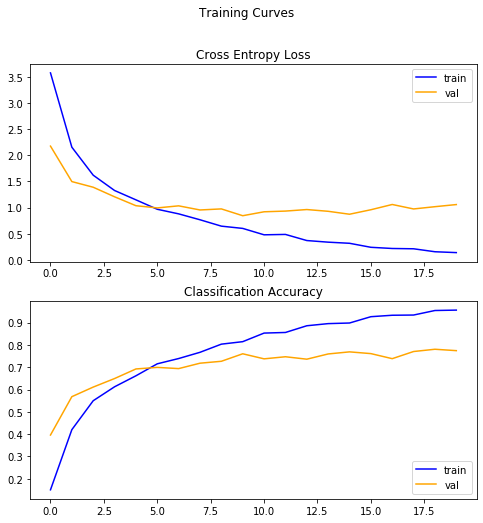


Test set evaluation metrics
30/30 [==============================] - 1s 26ms/step - loss: 1.0925 - accuracy: 0.7656
loss: 1.09
accuracy: 0.77


In [0]:
model_report(VGG19_MODEL_all, VGG19_MODEL_history_all, 32, 30)

### Freeze 10% of the layers

In [0]:
VGG19_MODEL_10 = init_VGG19_model(summary = True, trainable = "10")
VGG19_MODEL_history_10 = train_model_TL(VGG19_MODEL_10,"VGG19_10", 32, 200, 40, 10)

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg19 (Model)                (None, 1, 1, 512)         20024384  
_________________________________________________________________
dropout_9 (Dropout)          (None, 1, 1, 512)         0         
_________________________________________________________________
global_average_pooling2d_9 ( (None, 512)               0         
_________________________________________________________________
dense_9 (Dense)              (None, 100)               51300     
Total params: 20,075,684
Trainable params: 20,036,964
Non-trainable params: 38,720
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 6s 146ms/step - loss: 3.7264 - accuracy: 0.1471 - val_loss: 2.2565 - val_accuracy: 0.4008
Epoch 2/200
40/40 [==============================]

In [0]:
VGG19_MODEL_10.save("/content/drive/My Drive/NN/Lab3/MODELS/VGG19_10_trainable_32x32.h5")

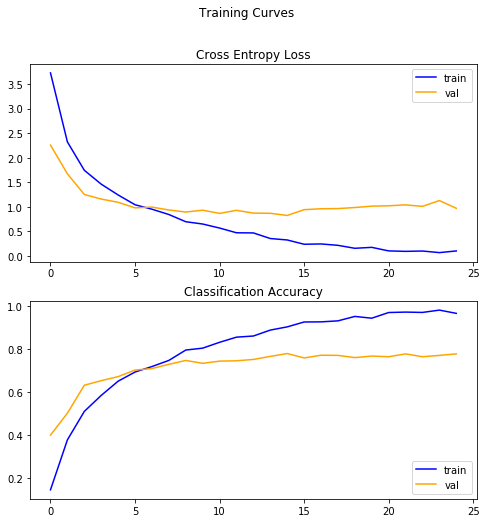


Test set evaluation metrics
30/30 [==============================] - 1s 27ms/step - loss: 1.0279 - accuracy: 0.7656
loss: 1.03
accuracy: 0.77


In [0]:
model_report(VGG19_MODEL_10, VGG19_MODEL_history_10, 32, 30)

### Freeze 20% of the layers

In [0]:
VGG19_MODEL_20 = init_VGG19_model(summary = True, trainable = "20")
VGG19_MODEL_history_20 = train_model_TL(VGG19_MODEL_20,"VGG19_20", 32, 200, 40, 10)

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg19 (Model)                (None, 1, 1, 512)         20024384  
_________________________________________________________________
dropout_10 (Dropout)         (None, 1, 1, 512)         0         
_________________________________________________________________
global_average_pooling2d_10  (None, 512)               0         
_________________________________________________________________
dense_10 (Dense)             (None, 100)               51300     
Total params: 20,075,684
Trainable params: 19,963,108
Non-trainable params: 112,576
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 6s 143ms/step - loss: 3.4012 - accuracy: 0.1764 - val_loss: 1.9725 - val_accuracy: 0.4484
Epoch 2/200
40/40 [=============================

In [0]:
VGG19_MODEL_20.save("/content/drive/My Drive/NN/Lab3/MODELS/VGG19_20_trainable_32x32.h5")

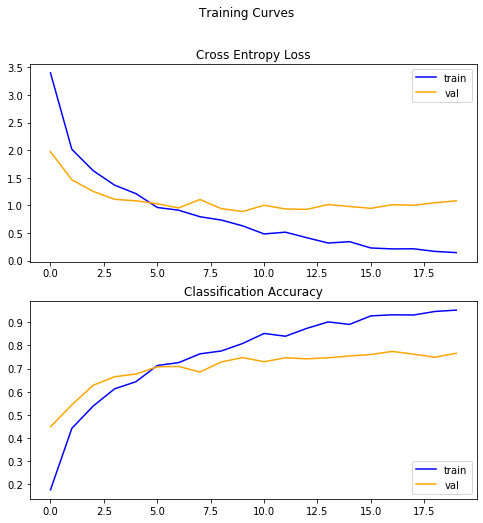


Test set evaluation metrics
30/30 [==============================] - 1s 25ms/step - loss: 1.1608 - accuracy: 0.7591
loss: 1.16
accuracy: 0.76


In [0]:
model_report(VGG19_MODEL_20, VGG19_MODEL_history_20, 32, 30)

### Only top layer is trainable

In [0]:
VGG19_MODEL_top = init_VGG19_model(summary = True, trainable = "top")
VGG19_MODEL_history_top = train_model_TL(VGG19_MODEL_top,"VGG19_top", 32, 200, 40, 10)

Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg19 (Model)                (None, 1, 1, 512)         20024384  
_________________________________________________________________
dropout_11 (Dropout)         (None, 1, 1, 512)         0         
_________________________________________________________________
global_average_pooling2d_11  (None, 512)               0         
_________________________________________________________________
dense_11 (Dense)             (None, 100)               51300     
Total params: 20,075,684
Trainable params: 51,300
Non-trainable params: 20,024,384
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 4s 97ms/step - loss: 4.9758 - accuracy: 0.0150 - val_loss: 4.5579 - val_accuracy: 0.0383
Epoch 2/200
40/40 [==============================]

In [0]:
VGG19_MODEL_top.save("/content/drive/My Drive/NN/Lab3/MODELS/VGG19_top_trainable_32x32.h5")

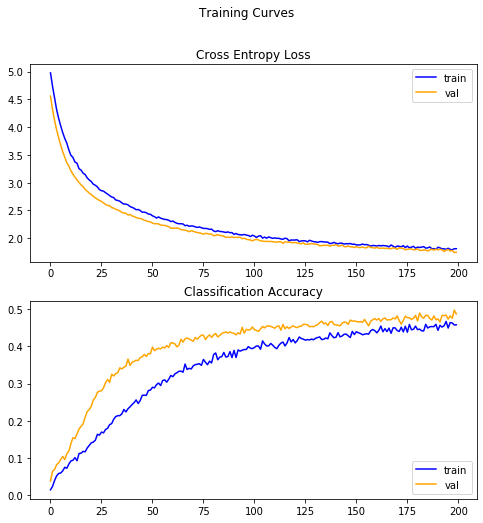


Test set evaluation metrics
30/30 [==============================] - 1s 25ms/step - loss: 1.7301 - accuracy: 0.5023
loss: 1.73
accuracy: 0.50


In [0]:
model_report(VGG19_MODEL_top, VGG19_MODEL_history_top, 32, 30)

##  ResNet50

ResNet50 consists of the following 50 layers:

![ResNet50](https://storage.googleapis.com/kaggle-datasets-images/6209/9122/9dbea1f498f8d02e6c26ead7f130af04/data-original.png?t=2017-12-06-02-54-47)

The default input size is 224x224x3. Keras allows us to change the input size of the model using the parameter `input_shape`.

In addition, we won't include its default top layer. We will add a top layer specified for CIFAR100 classification (20 classes).

In [0]:
# transfer learning: ResNet50 trained on ImageNet without the top layer

def init_ResNet50_model(summary, trainable):
  ResNet50_MODEL=ResNet50(input_shape=(img_rows, img_cols, img_channels), include_top=False, weights='imagenet')

  if (trainable == "all"):
    # unfreeze conv layers
    ResNet50_MODEL.trainable=True
  elif (trainable == "top"):
    ResNet50_MODEL.trainable=False
  else:
    percentage = float(trainable)/100
    nlayers =  len(ResNet50_MODEL.layers)
    nfreeze = ceil(nlayers*percentage)

    for layer in ResNet50_MODEL.layers[:nfreeze]:
	    layer.trainable = False


  dropout_layer = tf.keras.layers.Dropout(rate = 0.5)
  global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

  # add top layer for CIFAR100 classification
  prediction_layer = tf.keras.layers.Dense(len(CIFAR100_LABELS_LIST),activation='softmax')
  model = tf.keras.Sequential([ResNet50_MODEL, dropout_layer, global_average_layer, prediction_layer])
  model.compile(optimizer=tf.optimizers.Adam(learning_rate=0.00005), loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=["accuracy"])
  if summary: 
    model.summary()
  return model

### All layers are trainable

In [0]:
ResNet50_MODEL_all = init_ResNet50_model( True, "all")
ResNet50_MODEL_history_all = train_model_TL(ResNet50_MODEL_all, "ResNet50_all", 32, 200, 40, 10)

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Model)             (None, 1, 1, 2048)        23587712  
_________________________________________________________________
dropout_2 (Dropout)          (None, 1, 1, 2048)        0         
_________________________________________________________________
global_average_pooling2d_2 ( (None, 2048)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 100)               204900    
Total params: 23,792,612
Trainable params: 23,739,492
Non-trainable params: 53,120
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 12s 300ms/step - loss: 6.5759 - accuracy: 0.0314 - val_loss: 30.6070 - val_accuracy: 0.0359
Epoch 2/200
40/40 [=============================

In [0]:
ResNet50_MODEL_all.save("/content/drive/My Drive/NN/Lab3/MODELS/ResNet50_all_trainable_32x32.h5")

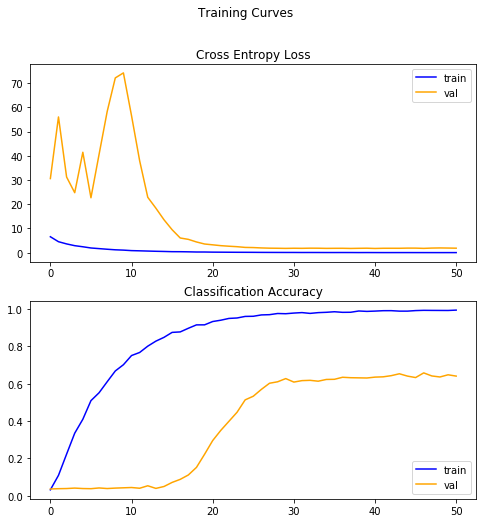


Test set evaluation metrics
30/30 [==============================] - 1s 22ms/step - loss: 1.8762 - accuracy: 0.6414
loss: 1.88
accuracy: 0.64


In [0]:
model_report(ResNet50_MODEL_all, ResNet50_MODEL_history_all, 32, 30)

### Freeze 10% of the layers

In [0]:
ResNet50_MODEL_10 = init_ResNet50_model(summary = True, trainable = "10")
ResNet50_MODEL_history_10 = train_model_TL(ResNet50_MODEL_10,"ResNet50_10", 32, 200, 40, 10)

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Model)             (None, 1, 1, 2048)        23587712  
_________________________________________________________________
dropout_10 (Dropout)         (None, 1, 1, 2048)        0         
_________________________________________________________________
global_average_pooling2d_10  (None, 2048)              0         
_________________________________________________________________
dense_10 (Dense)             (None, 100)               204900    
Total params: 23,792,612
Trainable params: 23,654,244
Non-trainable params: 138,368
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 12s 292ms/step - loss: 6.6350 - accuracy: 0.0275 - val_loss: 13.8795 - val_accuracy: 0.0000e+00
Epoch 2/200
40/40 [=======================

In [0]:
ResNet50_MODEL_10.save("/content/drive/My Drive/NN/Lab3/MODELS/ResNet50_10_trainable_32x32.h5")

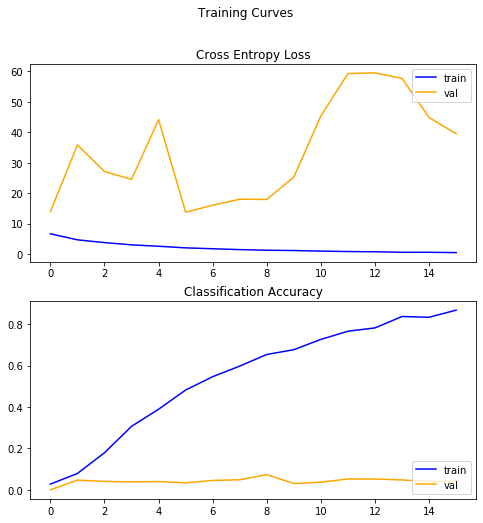


Test set evaluation metrics
30/30 [==============================] - 1s 22ms/step - loss: 39.6375 - accuracy: 0.0495
loss: 39.64
accuracy: 0.05


In [0]:
model_report(ResNet50_MODEL_10, ResNet50_MODEL_history_10, 32, 30)

### Freeze 20% of the layers

In [0]:
ResNet50_MODEL_20 = init_ResNet50_model(summary = True, trainable = "20")
ResNet50_MODEL_history_20 = train_model_TL(ResNet50_MODEL_20,"ResNet50_20", 32, 200, 40, 10)

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Model)             (None, 1, 1, 2048)        23587712  
_________________________________________________________________
dropout_9 (Dropout)          (None, 1, 1, 2048)        0         
_________________________________________________________________
global_average_pooling2d_9 ( (None, 2048)              0         
_________________________________________________________________
dense_9 (Dense)              (None, 100)               204900    
Total params: 23,792,612
Trainable params: 23,529,828
Non-trainable params: 262,784
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 11s 276ms/step - loss: 6.5619 - accuracy: 0.0371 - val_loss: 20.1730 - val_accuracy: 0.0477
Epoch 2/200
40/40 [============================

In [0]:
ResNet50_MODEL_20.save("/content/drive/My Drive/NN/Lab3/MODELS/ResNet50_20_trainable_32x32.h5")

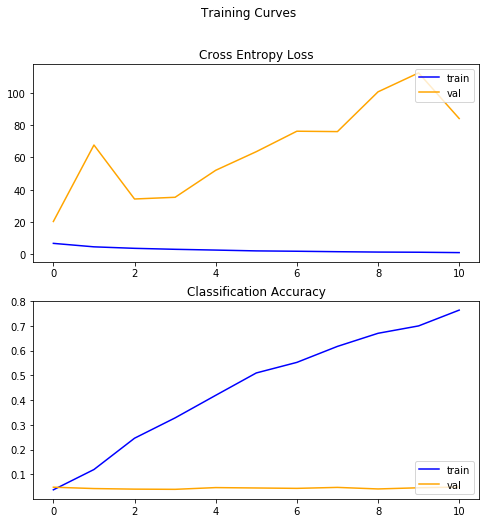


Test set evaluation metrics
30/30 [==============================] - 1s 22ms/step - loss: 82.2401 - accuracy: 0.0487
loss: 82.24
accuracy: 0.05


In [0]:
model_report(ResNet50_MODEL_20, ResNet50_MODEL_history_20, 32, 30)

### Only top layer is trainable

In [0]:
ResNet50_MODEL_top = init_ResNet50_model(summary = True, trainable = "top")
ResNet50_MODEL_history_top = train_model_TL(ResNet50_MODEL_top,"ResNet50_top", 32, 200, 40, 10)

Model: "sequential_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Model)             (None, 1, 1, 2048)        23587712  
_________________________________________________________________
dropout_15 (Dropout)         (None, 1, 1, 2048)        0         
_________________________________________________________________
global_average_pooling2d_15  (None, 2048)              0         
_________________________________________________________________
dense_15 (Dense)             (None, 100)               204900    
Total params: 23,792,612
Trainable params: 204,900
Non-trainable params: 23,587,712
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 7s 172ms/step - loss: 7.7618 - accuracy: 0.0121 - val_loss: 5.4823 - val_accuracy: 0.0000e+00
Epoch 2/200
40/40 [=========================

In [0]:
ResNet50_MODEL_top.save("/content/drive/My Drive/NN/Lab3/MODELS/ResNet50_top_trainable_32x32.h5")

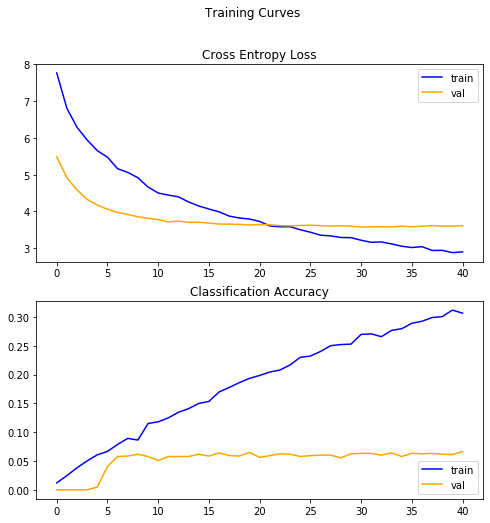


Test set evaluation metrics
30/30 [==============================] - 1s 24ms/step - loss: 3.6265 - accuracy: 0.0495
loss: 3.63
accuracy: 0.05


In [0]:
model_report(ResNet50_MODEL_top, ResNet50_MODEL_history_top, 32, 30)

##  ResNet50V2

ResNet50V2 consists of 50 layers:

![ResNet50V2](https://static.packt-cdn.com/products/9781788629416/graphics/B08956_02_10.jpg)

The default input size is 224x224x3. Keras allows us to change the input size of the model using the parameter `input_shape`.

In addition, we won't include its default top layer. We will add a top layer specified for CIFAR100 classification (20 classes).

In [0]:
# transfer learning: ResNet50V2 trained on ImageNet without the top layer

def init_ResNet50V2_model(summary, trainable):
  ResNet50V2_MODEL=ResNet50V2(input_shape=(img_rows, img_cols, img_channels), include_top=False, weights='imagenet')

  if (trainable == "all"):
    # unfreeze conv layers
    ResNet50V2_MODEL.trainable=True
  elif (trainable == "top"):
    ResNet50V2_MODEL.trainable=False
  else:
    percentage = float(trainable)/100
    nlayers =  len(ResNet50V2_MODEL.layers)
    nfreeze = ceil(nlayers*percentage)

    for layer in ResNet50V2_MODEL.layers[:nfreeze]:
	    layer.trainable = False


  dropout_layer = tf.keras.layers.Dropout(rate = 0.5)
  global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

  # add top layer for CIFAR100 classification
  prediction_layer = tf.keras.layers.Dense(len(CIFAR100_LABELS_LIST),activation='softmax')
  model = tf.keras.Sequential([ResNet50V2_MODEL, dropout_layer, global_average_layer, prediction_layer])
  model.compile(optimizer=tf.optimizers.Adam(learning_rate=0.00005), loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=["accuracy"])
  if summary: 
    model.summary()
  return model

### All layers are trainable

In [0]:
ResNet50V2_MODEL_all = init_ResNet50V2_model( True, "all")
ResNet50V2_MODEL_history_all = train_model_TL(ResNet50V2_MODEL_all, "ResNet50V2_all", 32, 200, 40, 10)

94674944/94668760 [==============================] - 3s 0us/step
Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50v2 (Model)           (None, 1, 1, 2048)        23564800  
_________________________________________________________________
dropout_16 (Dropout)         (None, 1, 1, 2048)        0         
_________________________________________________________________
global_average_pooling2d_16  (None, 2048)              0         
_________________________________________________________________
dense_16 (Dense)             (None, 100)               204900    
Total params: 23,769,700
Trainable params: 23,724,260
Non-trainable params: 45,440
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 12s 294ms/step - loss: 5.0674 - accuracy: 0.0164 - val_loss: 4.5978 - val_

In [0]:
ResNet50V2_MODEL_all.save("/content/drive/My Drive/NN/Lab3/MODELS/ResNet50V2_all_trainable_32x32.h5")

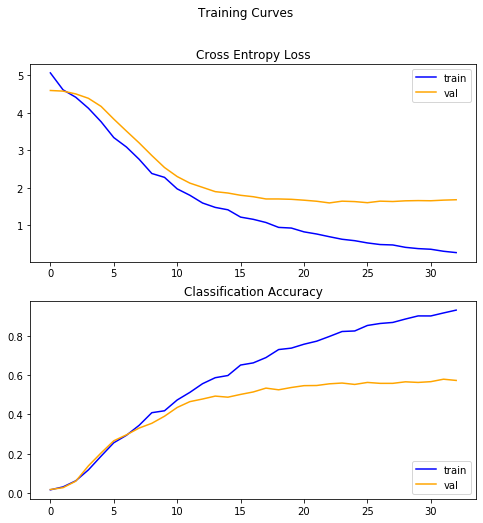


Test set evaluation metrics
30/30 [==============================] - 1s 23ms/step - loss: 1.6552 - accuracy: 0.5737
loss: 1.66
accuracy: 0.57


In [0]:
model_report(ResNet50V2_MODEL_all, ResNet50V2_MODEL_history_all, 32, 30)

### Freeze 20% of the layers

In [0]:
ResNet50V2_MODEL_20 = init_ResNet50V2_model(summary = True, trainable = "20")
ResNet50V2_MODEL_history_20 = train_model_TL(ResNet50V2_MODEL_20,"ResNet50V2_20", 32, 200, 40, 10)

Model: "sequential_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50v2 (Model)           (None, 1, 1, 2048)        23564800  
_________________________________________________________________
dropout_17 (Dropout)         (None, 1, 1, 2048)        0         
_________________________________________________________________
global_average_pooling2d_17  (None, 2048)              0         
_________________________________________________________________
dense_17 (Dense)             (None, 100)               204900    
Total params: 23,769,700
Trainable params: 23,515,492
Non-trainable params: 254,208
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 11s 265ms/step - loss: 5.0647 - accuracy: 0.0176 - val_loss: 4.5862 - val_accuracy: 0.0297
Epoch 2/200
40/40 [============================

In [0]:
ResNet50V2_MODEL_20.save("/content/drive/My Drive/NN/Lab3/MODELS/ResNet50V2_20_trainable_32x32.h5")

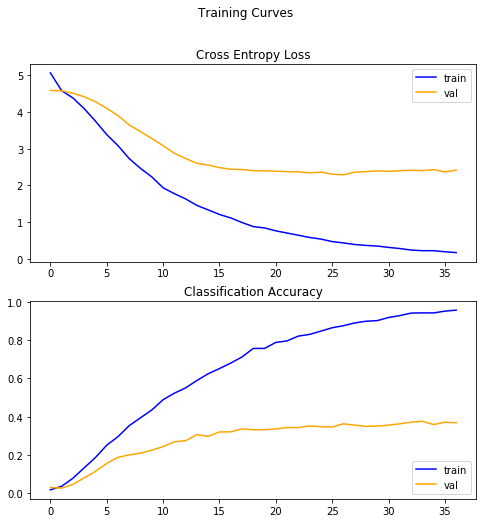


Test set evaluation metrics
30/30 [==============================] - 1s 24ms/step - loss: 2.3998 - accuracy: 0.3570
loss: 2.40
accuracy: 0.36


In [0]:
model_report(ResNet50V2_MODEL_20, ResNet50V2_MODEL_history_20, 32, 30)

### Only top layer is trainable

In [0]:
ResNet50V2_MODEL_top = init_ResNet50V2_model(summary = True, trainable = "top")
ResNet50V2_MODEL_history_top = train_model_TL(ResNet50V2_MODEL_top,"ResNet50V2_top", 32, 200, 40, 10)

Model: "sequential_18"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50v2 (Model)           (None, 1, 1, 2048)        23564800  
_________________________________________________________________
dropout_18 (Dropout)         (None, 1, 1, 2048)        0         
_________________________________________________________________
global_average_pooling2d_18  (None, 2048)              0         
_________________________________________________________________
dense_18 (Dense)             (None, 100)               204900    
Total params: 23,769,700
Trainable params: 204,900
Non-trainable params: 23,564,800
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 7s 168ms/step - loss: 5.5923 - accuracy: 0.0135 - val_loss: 4.5938 - val_accuracy: 0.0133
Epoch 2/200
40/40 [=============================

In [0]:
ResNet50V2_MODEL_top.save("/content/drive/My Drive/NN/Lab3/MODELS/ResNet50V2_top_trainable_32x32.h5")

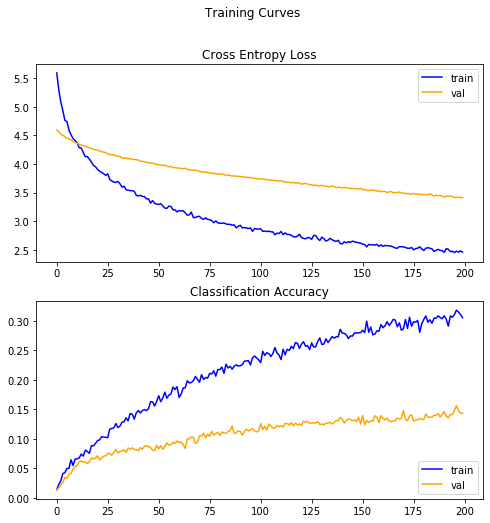


Test set evaluation metrics
30/30 [==============================] - 1s 22ms/step - loss: 3.4152 - accuracy: 0.1385
loss: 3.42
accuracy: 0.14


In [0]:
model_report(ResNet50V2_MODEL_top, ResNet50V2_MODEL_history_top, 32, 30)

##  InceptionV3

InceptionV3's architecture is as follows:

![InceptionV3](https://www.researchgate.net/profile/Masoud_Mahdianpari/publication/326421398/figure/fig6/AS:649353890889730@1531829440919/Schematic-diagram-of-InceptionV3-model-compressed-view.png)

The default input size is 224x224x3. Keras allows us to change the input size of the model using the parameter `input_shape`. For this model though, the width and height should be no smaller than 75. Therefore, we are going to use our resized images.

In addition, we won't include its default top layer. We will add a top layer specified for CIFAR100 classification (20 classes).

In [0]:
# transfer learning: InceptionV3 trained on ImageNet without the top layer

def init_InceptionV3_model(summary, trainable):
  InceptionV3_MODEL=InceptionV3(input_shape=TARGET_SIZE, include_top=False, weights='imagenet')

  if (trainable == "all"):
    # unfreeze conv layers
    InceptionV3_MODEL.trainable=True
  elif (trainable == "top"):
    InceptionV3_MODEL.trainable=False
  else:
    percentage = float(trainable)/100
    nlayers =  len(InceptionV3_MODEL.layers)
    nfreeze = ceil(nlayers*percentage)

    for layer in InceptionV3_MODEL.layers[:nfreeze]:
	    layer.trainable = False


  dropout_layer = tf.keras.layers.Dropout(rate = 0.5)
  global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

  # add top layer for CIFAR100 classification
  prediction_layer = tf.keras.layers.Dense(len(CIFAR100_LABELS_LIST),activation='softmax')
  model = tf.keras.Sequential([InceptionV3_MODEL, dropout_layer, global_average_layer, prediction_layer])
  model.compile(optimizer=tf.optimizers.Adam(learning_rate=0.00005), loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=["accuracy"])
  if summary: 
    model.summary()
  return model

### All layers are trainable

In [0]:
InceptionV3_MODEL_all = init_InceptionV3_model( True, "all")
InceptionV3_MODEL_history_all = train_model_TL(InceptionV3_MODEL_all, "InceptionV3_all", 78, 200, 40, 10)

87916544/87910968 [==============================] - 3s 0us/step
Model: "sequential_19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_v3 (Model)         (None, 1, 1, 2048)        21802784  
_________________________________________________________________
dropout_19 (Dropout)         (None, 1, 1, 2048)        0         
_________________________________________________________________
global_average_pooling2d_19  (None, 2048)              0         
_________________________________________________________________
dense_19 (Dense)             (None, 100)               204900    
Total params: 22,007,684
Trainable params: 21,973,252
Non-trainable params: 34,432
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 22s 541ms/step - loss: 4.3759 - accuracy: 0.0559 - val_loss: 4.3999 - val_

In [0]:
InceptionV3_MODEL_all.save("/content/drive/My Drive/NN/Lab3/MODELS/InceptionV3_all_trainable_78x78.h5")

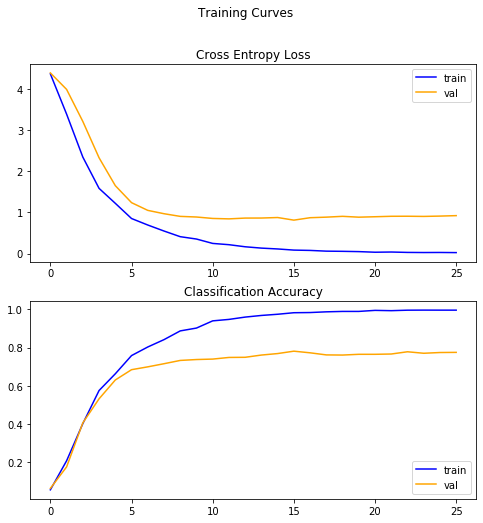


Test set evaluation metrics
30/30 [==============================] - 2s 67ms/step - loss: 0.8709 - accuracy: 0.7792
loss: 0.87
accuracy: 0.78


In [0]:
model_report(InceptionV3_MODEL_all, InceptionV3_MODEL_history_all, 78, 30)

### Freeze 10% of the layers

In [0]:
InceptionV3_MODEL_10 = init_InceptionV3_model(summary = True, trainable = "10")
InceptionV3_MODEL_history_10 = train_model_TL(InceptionV3_MODEL_10,"InceptionV3_10", 78, 200, 40, 10)

Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_v3 (Model)         (None, 1, 1, 2048)        21802784  
_________________________________________________________________
dropout_20 (Dropout)         (None, 1, 1, 2048)        0         
_________________________________________________________________
global_average_pooling2d_20  (None, 2048)              0         
_________________________________________________________________
dense_20 (Dense)             (None, 100)               204900    
Total params: 22,007,684
Trainable params: 21,545,796
Non-trainable params: 461,888
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 15s 386ms/step - loss: 4.3706 - accuracy: 0.0564 - val_loss: 4.4106 - val_accuracy: 0.0750
Epoch 2/200
40/40 [============================

In [0]:
InceptionV3_MODEL_10.save("/content/drive/My Drive/NN/Lab3/MODELS/InceptionV3_10_trainable_78x78.h5")

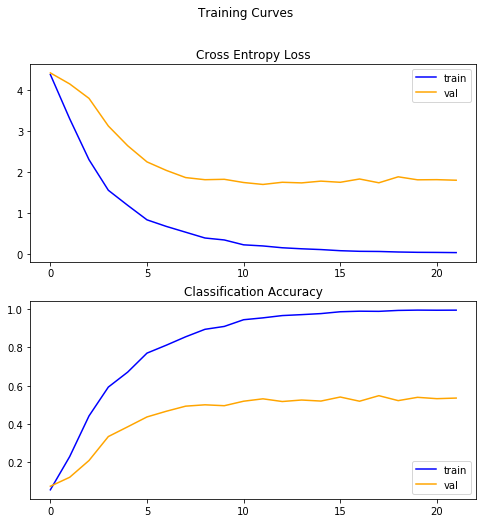


Test set evaluation metrics
30/30 [==============================] - 2s 68ms/step - loss: 1.8440 - accuracy: 0.5383
loss: 1.84
accuracy: 0.54


In [0]:
model_report(InceptionV3_MODEL_10, InceptionV3_MODEL_history_10, 78, 30)

### Freeze 20% of the layers

In [0]:
InceptionV3_MODEL_20 = init_InceptionV3_model(summary = True, trainable = "20")
InceptionV3_MODEL_history_20 = train_model_TL(InceptionV3_MODEL_20,"InceptionV3_20", 78, 200, 40, 10)

Model: "sequential_22"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_v3 (Model)         (None, 1, 1, 2048)        21802784  
_________________________________________________________________
dropout_22 (Dropout)         (None, 1, 1, 2048)        0         
_________________________________________________________________
global_average_pooling2d_22  (None, 2048)              0         
_________________________________________________________________
dense_22 (Dense)             (None, 100)               204900    
Total params: 22,007,684
Trainable params: 21,268,564
Non-trainable params: 739,120
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 15s 374ms/step - loss: 4.3811 - accuracy: 0.0631 - val_loss: 4.2760 - val_accuracy: 0.0891
Epoch 2/200
40/40 [============================

In [0]:
InceptionV3_MODEL_20.save("/content/drive/My Drive/NN/Lab3/MODELS/InceptionV3_20_trainable_78x78.h5")

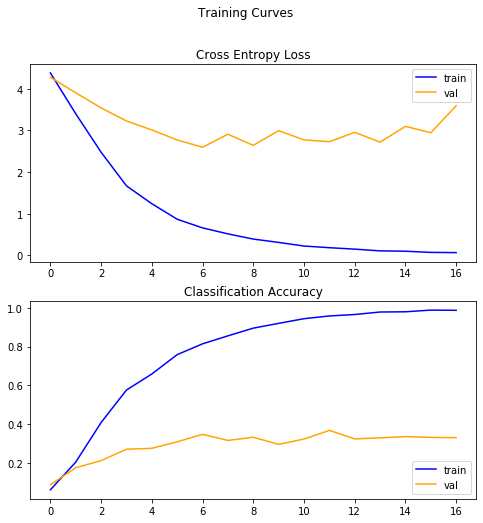


Test set evaluation metrics
30/30 [==============================] - 2s 70ms/step - loss: 3.5706 - accuracy: 0.3021
loss: 3.57
accuracy: 0.30


In [0]:
model_report(InceptionV3_MODEL_20, InceptionV3_MODEL_history_20, 78, 30)

### Only top layer is trainable

In [0]:
InceptionV3_MODEL_top = init_InceptionV3_model(summary = True, trainable = "top")
InceptionV3_MODEL_history_top = train_model_TL(InceptionV3_MODEL_top,"InceptionV3_top", 78, 200, 40, 10)

Model: "sequential_23"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_v3 (Model)         (None, 1, 1, 2048)        21802784  
_________________________________________________________________
dropout_23 (Dropout)         (None, 1, 1, 2048)        0         
_________________________________________________________________
global_average_pooling2d_23  (None, 2048)              0         
_________________________________________________________________
dense_23 (Dense)             (None, 100)               204900    
Total params: 22,007,684
Trainable params: 204,900
Non-trainable params: 21,802,784
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 10s 246ms/step - loss: 4.5538 - accuracy: 0.0254 - val_loss: 4.2352 - val_accuracy: 0.0437
Epoch 2/200
40/40 [============================

In [0]:
InceptionV3_MODEL_top.save("/content/drive/My Drive/NN/Lab3/MODELS/InceptionV3_top_trainable_78x78.h5")

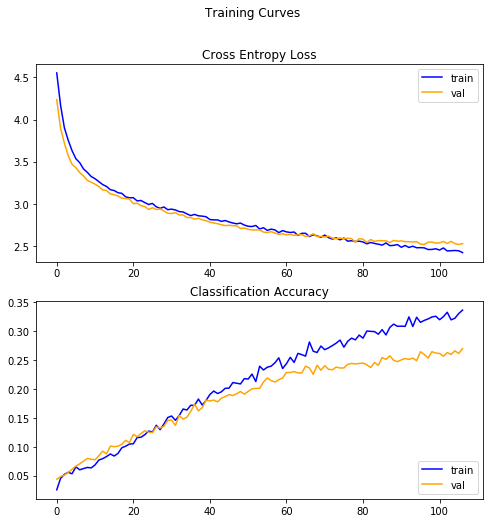


Test set evaluation metrics
30/30 [==============================] - 3s 99ms/step - loss: 2.5102 - accuracy: 0.2760
loss: 2.51
accuracy: 0.28


In [0]:
model_report(InceptionV3_MODEL_top, InceptionV3_MODEL_history_top, 78, 30)

##  InceptionResNetV2

InceptionResNetV2's architecture is as follows:

![InceptionResNetV2](https://www.researchgate.net/profile/Masoud_Mahdianpari/publication/326421398/figure/fig9/AS:649354851385344@1531829669740/Schematic-diagram-of-InceptionResNetV2-model-compressed-view.png)

The default input size is 224x224x3. Keras allows us to change the input size of the model using the parameter `input_shape`.  For this model though, the width and height should be no smaller than 75. Therefore, we are going to use our resized images.

In addition, we won't include its default top layer. We will add a top layer specified for CIFAR100 classification (20 classes).

In [0]:
# transfer learning: InceptionResNetV2 trained on ImageNet without the top layer

def init_InceptionResNetV2_model(summary, trainable):
  InceptionResNetV2_MODEL=InceptionResNetV2(input_shape=TARGET_SIZE, include_top=False, weights='imagenet')

  if (trainable == "all"):
    # unfreeze conv layers
    InceptionResNetV2_MODEL.trainable=True
  elif (trainable == "top"):
    InceptionResNetV2_MODEL.trainable=False
  else:
    percentage = float(trainable)/100
    nlayers =  len(InceptionResNetV2_MODEL.layers)
    nfreeze = ceil(nlayers*percentage)

    for layer in InceptionResNetV2_MODEL.layers[:nfreeze]:
	    layer.trainable = False


  dropout_layer = tf.keras.layers.Dropout(rate = 0.5)
  global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

  # add top layer for CIFAR100 classification
  prediction_layer = tf.keras.layers.Dense(len(CIFAR100_LABELS_LIST),activation='softmax')
  model = tf.keras.Sequential([InceptionResNetV2_MODEL, dropout_layer, global_average_layer, prediction_layer])
  model.compile(optimizer=tf.optimizers.Adam(learning_rate=0.00005), loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=["accuracy"])
  if summary: 
    model.summary()
  return model

### All layers are trainable

In [0]:
InceptionResNetV2_MODEL_all = init_InceptionResNetV2_model( True, "all")
InceptionResNetV2_MODEL_history_all = train_model_TL(InceptionResNetV2_MODEL_all, "InceptionResNetV2_all", 78, 200, 40, 10)

219062272/219055592 [==============================] - 7s 0us/step
Model: "sequential_24"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_resnet_v2 (Model)  (None, 1, 1, 1536)        54336736  
_________________________________________________________________
dropout_24 (Dropout)         (None, 1, 1, 1536)        0         
_________________________________________________________________
global_average_pooling2d_24  (None, 1536)              0         
_________________________________________________________________
dense_24 (Dense)             (None, 100)               153700    
Total params: 54,490,436
Trainable params: 54,429,892
Non-trainable params: 60,544
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 40s 996ms/step - loss: 4.2598 - accuracy: 0.0883 - val_loss: 3.8188 - va

In [0]:
InceptionResNetV2_MODEL_all.save("/content/drive/My Drive/NN/Lab3/MODELS/InceptionResNetV2_all_trainable_78x78.h5")

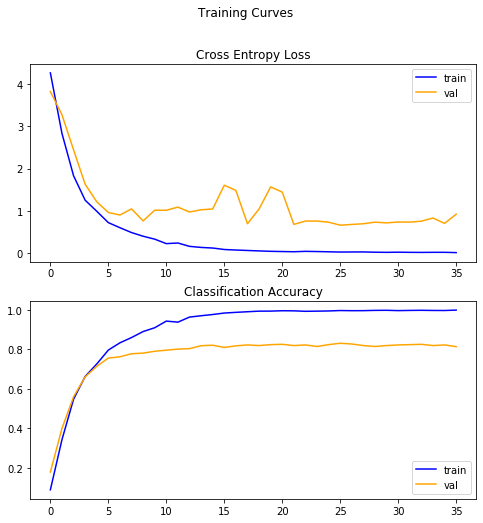


Test set evaluation metrics
30/30 [==============================] - 3s 110ms/step - loss: 0.7321 - accuracy: 0.8310
loss: 0.73
accuracy: 0.83


In [0]:
model_report(InceptionResNetV2_MODEL_all, InceptionResNetV2_MODEL_history_all, 78, 30)

### Freeze 10% of the layers

In [0]:
InceptionResNetV2_MODEL_10 = init_InceptionResNetV2_model(summary = True, trainable = "10")
InceptionResNetV2_MODEL_history_10 = train_model_TL(InceptionResNetV2_MODEL_10,"InceptionResNetV2_10", 78, 200, 40, 10)

Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_resnet_v2 (Model)  (None, 1, 1, 1536)        54336736  
_________________________________________________________________
dropout_13 (Dropout)         (None, 1, 1, 1536)        0         
_________________________________________________________________
global_average_pooling2d_13  (None, 1536)              0         
_________________________________________________________________
dense_13 (Dense)             (None, 100)               153700    
Total params: 54,490,436
Trainable params: 53,785,252
Non-trainable params: 705,184
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 41s 1s/step - loss: 4.2898 - accuracy: 0.0848 - val_loss: 3.8456 - val_accuracy: 0.1695
Epoch 2/200
40/40 [==============================]

In [0]:
InceptionResNetV2_MODEL_10.save("/content/drive/My Drive/NN/Lab3/MODELS/InceptionResNetV2_10_trainable_78x78.h5")

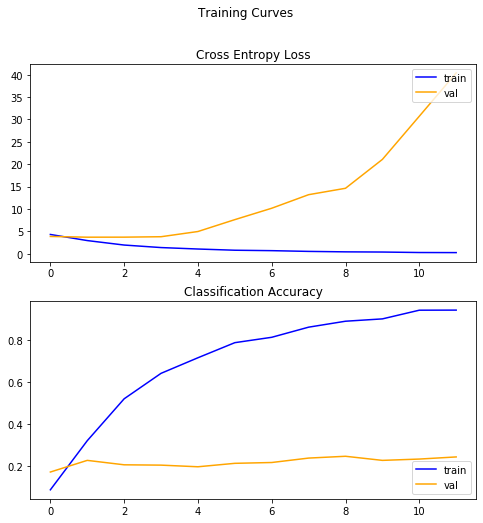


Test set evaluation metrics
30/30 [==============================] - 5s 159ms/step - loss: 17.9703 - accuracy: 0.2510
loss: 17.97
accuracy: 0.25


In [0]:
model_report(InceptionResNetV2_MODEL_10, InceptionResNetV2_MODEL_history_10, 78, 30)

### Freeze 20% of the layers

In [0]:
InceptionResNetV2_MODEL_20 = init_InceptionResNetV2_model(summary = True, trainable = "20")
InceptionResNetV2_MODEL_history_20 = train_model_TL(InceptionResNetV2_MODEL_20,"InceptionResNetV2_20", 78, 200, 40, 10)

Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_resnet_v2 (Model)  (None, 1, 1, 1536)        54336736  
_________________________________________________________________
dropout_14 (Dropout)         (None, 1, 1, 1536)        0         
_________________________________________________________________
global_average_pooling2d_14  (None, 1536)              0         
_________________________________________________________________
dense_14 (Dense)             (None, 100)               153700    
Total params: 54,490,436
Trainable params: 53,340,852
Non-trainable params: 1,149,584
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 39s 987ms/step - loss: 4.3513 - accuracy: 0.0834 - val_loss: 3.8883 - val_accuracy: 0.1625
Epoch 2/200
40/40 [==========================

In [0]:
InceptionResNetV2_MODEL_20.save("/content/drive/My Drive/NN/Lab3/MODELS/InceptionResNetV2_20_trainable_78x78.h5")

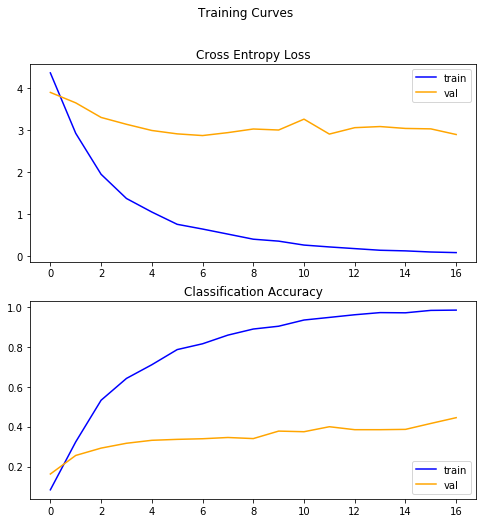


Test set evaluation metrics
30/30 [==============================] - 4s 120ms/step - loss: 2.1526 - accuracy: 0.4378
loss: 2.15
accuracy: 0.44


In [0]:
model_report(InceptionResNetV2_MODEL_20, InceptionResNetV2_MODEL_history_20, 78, 30)

### Only top layer is trainable

In [0]:
InceptionResNetV2_MODEL_top = init_InceptionResNetV2_model(summary = True, trainable = "top")
InceptionResNetV2_MODEL_history_top = train_model_TL(InceptionResNetV2_MODEL_top,"InceptionResNetV2_top", 78, 200, 40, 10)

Model: "sequential_27"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_resnet_v2 (Model)  (None, 1, 1, 1536)        54336736  
_________________________________________________________________
dropout_27 (Dropout)         (None, 1, 1, 1536)        0         
_________________________________________________________________
global_average_pooling2d_27  (None, 1536)              0         
_________________________________________________________________
dense_27 (Dense)             (None, 100)               153700    
Total params: 54,490,436
Trainable params: 153,700
Non-trainable params: 54,336,736
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 21s 520ms/step - loss: 4.7288 - accuracy: 0.0262 - val_loss: 4.3799 - val_accuracy: 0.0656
Epoch 2/200
40/40 [============================

In [0]:
InceptionResNetV2_MODEL_top.save("/content/drive/My Drive/NN/Lab3/MODELS/InceptionResNetV2_top_trainable_78x78.h5")

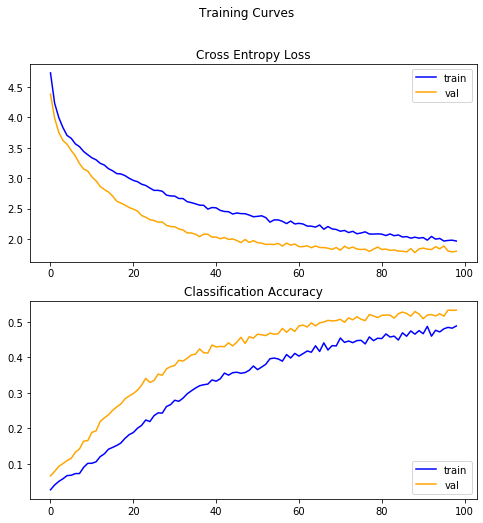


Test set evaluation metrics
30/30 [==============================] - 7s 225ms/step - loss: 1.7948 - accuracy: 0.5130
loss: 1.79
accuracy: 0.51


In [0]:
model_report(InceptionResNetV2_MODEL_top, InceptionResNetV2_MODEL_history_top, 78, 30)

##  MobileNet

MobileNet consists of the following 28 layers:

![MobileNet](https://www.researchgate.net/profile/Oleh_Misko/publication/333199776/figure/fig5/AS:760246054158337@1558268192069/Classical-MobileNet-architecture.ppm)

The default input size is 224x224x3. Keras allows us to change the input size of the model using the parameter `input_shape`.

In addition, we won't include its default top layer. We will add a top layer specified for CIFAR100 classification (20 classes).

In [0]:
# transfer learning: MobileNet trained on ImageNet without the top layer

def init_MobileNet_model(summary, trainable):
  MobileNet_MODEL=MobileNet(input_shape=(img_rows, img_cols, img_channels), include_top=False, weights='imagenet')

  if (trainable == "all"):
    # unfreeze conv layers
    MobileNet_MODEL.trainable=True
  elif (trainable == "top"):
    MobileNet_MODEL.trainable=False
  else:
    percentage = float(trainable)/100
    nlayers =  len(MobileNet_MODEL.layers)
    nfreeze = ceil(nlayers*percentage)

    for layer in MobileNet_MODEL.layers[:nfreeze]:
	    layer.trainable = False


  dropout_layer = tf.keras.layers.Dropout(rate = 0.5)
  global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

  # add top layer for CIFAR100 classification
  prediction_layer = tf.keras.layers.Dense(len(CIFAR100_LABELS_LIST),activation='softmax')
  model = tf.keras.Sequential([MobileNet_MODEL, dropout_layer, global_average_layer, prediction_layer])
  model.compile(optimizer=tf.optimizers.Adam(learning_rate=0.00005), loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=["accuracy"])
  if summary: 
    model.summary()
  return model

### All layers are trainable

In [0]:
MobileNet_MODEL_all = init_MobileNet_model( True, "all")
MobileNet_MODEL_history_all = train_model_TL(MobileNet_MODEL_all, "MobileNet_all", 32, 200, 40, 10)

/usr/local/lib/python3.6/dist-packages/keras_applications/mobilenet.py:207: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  warnings.warn('`input_shape` is undefined or non-square, '


17227776/17225924 [==============================] - 1s 0us/step
Model: "sequential_28"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
mobilenet_1.00_224 (Model)   (None, 1, 1, 1024)        3228864   
_________________________________________________________________
dropout_28 (Dropout)         (None, 1, 1, 1024)        0         
_________________________________________________________________
global_average_pooling2d_28  (None, 1024)              0         
_________________________________________________________________
dense_28 (Dense)             (None, 100)               102500    
Total params: 3,331,364
Trainable params: 3,309,476
Non-trainable params: 21,888
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 5s 130ms/step - loss: 7.7281 - accuracy: 0.0199 - val_loss: 4.6043 - val_acc

In [0]:
MobileNet_MODEL_all.save("/content/drive/My Drive/NN/Lab3/MODELS/MobileNet_all_trainable_32x32.h5")

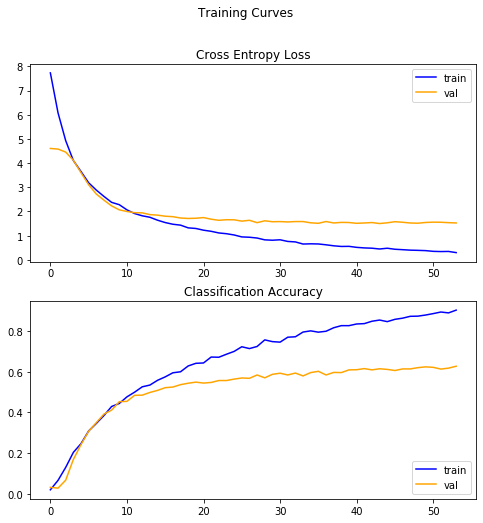


Test set evaluation metrics
30/30 [==============================] - 0s 10ms/step - loss: 1.5012 - accuracy: 0.6167
loss: 1.50
accuracy: 0.62


In [0]:
model_report(MobileNet_MODEL_all, MobileNet_MODEL_history_all, 32, 30)

### Freeze 10% of the layers

In [0]:
MobileNet_MODEL_10 = init_MobileNet_model(summary = True, trainable = "10")
MobileNet_MODEL_history_10 = train_model_TL(MobileNet_MODEL_10,"MobileNet_10", 32, 200, 40, 10)

/usr/local/lib/python3.6/dist-packages/keras_applications/mobilenet.py:207: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  warnings.warn('`input_shape` is undefined or non-square, '


Model: "sequential_29"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
mobilenet_1.00_224 (Model)   (None, 1, 1, 1024)        3228864   
_________________________________________________________________
dropout_29 (Dropout)         (None, 1, 1, 1024)        0         
_________________________________________________________________
global_average_pooling2d_29  (None, 1024)              0         
_________________________________________________________________
dense_29 (Dense)             (None, 100)               102500    
Total params: 3,331,364
Trainable params: 3,306,148
Non-trainable params: 25,216
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 4s 99ms/step - loss: 7.8694 - accuracy: 0.0135 - val_loss: 4.6006 - val_accuracy: 0.0312
Epoch 2/200
40/40 [==============================] -

In [0]:
MobileNet_MODEL_10.save("/content/drive/My Drive/NN/Lab3/MODELS/MobileNet_10_trainable_32x32.h5")

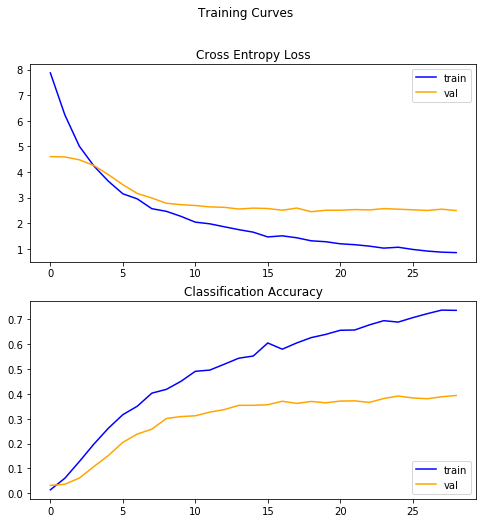


Test set evaluation metrics
30/30 [==============================] - 0s 10ms/step - loss: 2.4959 - accuracy: 0.4065
loss: 2.50
accuracy: 0.41


In [0]:
model_report(MobileNet_MODEL_10, MobileNet_MODEL_history_10, 32, 30)

### Freeze 20% of the layers

In [0]:
MobileNet_MODEL_20 = init_MobileNet_model(summary = True, trainable = "20")
MobileNet_MODEL_history_20 = train_model_TL(MobileNet_MODEL_20,"MobileNet_20", 32, 200, 40, 10)

/usr/local/lib/python3.6/dist-packages/keras_applications/mobilenet.py:207: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  warnings.warn('`input_shape` is undefined or non-square, '


Model: "sequential_30"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
mobilenet_1.00_224 (Model)   (None, 1, 1, 1024)        3228864   
_________________________________________________________________
dropout_30 (Dropout)         (None, 1, 1, 1024)        0         
_________________________________________________________________
global_average_pooling2d_30  (None, 1024)              0         
_________________________________________________________________
dense_30 (Dense)             (None, 100)               102500    
Total params: 3,331,364
Trainable params: 3,296,868
Non-trainable params: 34,496
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 4s 91ms/step - loss: 7.3799 - accuracy: 0.0236 - val_loss: 4.5967 - val_accuracy: 0.0250
Epoch 2/200
40/40 [==============================] -

In [0]:
MobileNet_MODEL_20.save("/content/drive/My Drive/NN/Lab3/MODELS/MobileNet_20_trainable_32x32.h5")

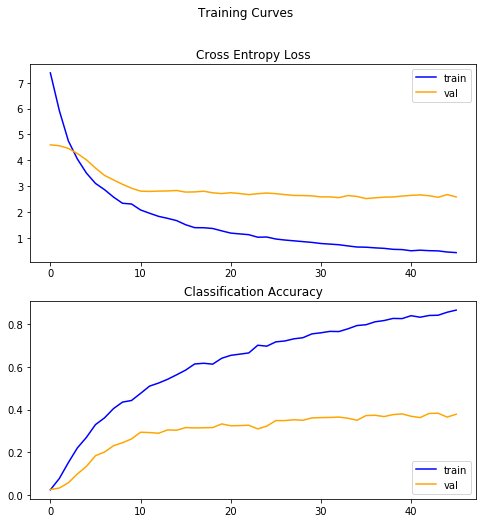


Test set evaluation metrics
30/30 [==============================] - 0s 10ms/step - loss: 2.4527 - accuracy: 0.4062
loss: 2.45
accuracy: 0.41


In [0]:
model_report(MobileNet_MODEL_20, MobileNet_MODEL_history_20, 32, 30)

### Only top layer is trainable

In [0]:
MobileNet_MODEL_top = init_MobileNet_model(summary = True, trainable = "top")
MobileNet_MODEL_history_top = train_model_TL(MobileNet_MODEL_top,"MobileNet_top", 32, 200, 40, 10)

/usr/local/lib/python3.6/dist-packages/keras_applications/mobilenet.py:207: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  warnings.warn('`input_shape` is undefined or non-square, '


Model: "sequential_31"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
mobilenet_1.00_224 (Model)   (None, 1, 1, 1024)        3228864   
_________________________________________________________________
dropout_31 (Dropout)         (None, 1, 1, 1024)        0         
_________________________________________________________________
global_average_pooling2d_31  (None, 1024)              0         
_________________________________________________________________
dense_31 (Dense)             (None, 100)               102500    
Total params: 3,331,364
Trainable params: 102,500
Non-trainable params: 3,228,864
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 2s 62ms/step - loss: 8.0993 - accuracy: 0.0131 - val_loss: 4.6095 - val_accuracy: 0.0148
Epoch 2/200
40/40 [==============================] 

In [0]:
MobileNet_MODEL_top.save("/content/drive/My Drive/NN/Lab3/MODELS/MobileNet_top_trainable_32x32.h5")

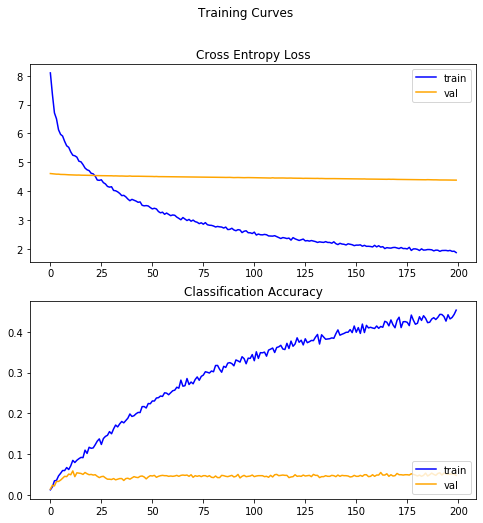


Test set evaluation metrics
30/30 [==============================] - 0s 11ms/step - loss: 4.3863 - accuracy: 0.0471
loss: 4.39
accuracy: 0.05


In [0]:
model_report(MobileNet_MODEL_top, MobileNet_MODEL_history_top, 32, 30)

##  DenseNet121

DenseNet121 consists of the following 121 layers:

![DenseNet121](https://www.researchgate.net/publication/331364877/figure/fig4/AS:741856270901253@1553883726942/Left-DenseNet121-architecture-Right-Dense-block-conv-block-and-transition-layer.png)

The default input size is 224x224x3. Keras allows us to change the input size of the model using the parameter `input_shape`.

In addition, we won't include its default top layer. We will add a top layer specified for CIFAR100 classification (20 classes).

In [0]:
# transfer learning: DenseNet121 trained on ImageNet without the top layer

def init_DenseNet121_model(summary, trainable):
  DenseNet121_MODEL=DenseNet121(input_shape=(img_rows, img_cols, img_channels), include_top=False, weights='imagenet')

  if (trainable == "all"):
    # unfreeze conv layers
    DenseNet121_MODEL.trainable=True
  elif (trainable == "top"):
    DenseNet121_MODEL.trainable=False
  else:
    percentage = float(trainable)/100
    nlayers =  len(DenseNet121_MODEL.layers)
    nfreeze = ceil(nlayers*percentage)

    for layer in DenseNet121_MODEL.layers[:nfreeze]:
	    layer.trainable = False


  dropout_layer = tf.keras.layers.Dropout(rate = 0.5)
  global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

  # add top layer for CIFAR100 classification
  prediction_layer = tf.keras.layers.Dense(len(CIFAR100_LABELS_LIST),activation='softmax')
  model = tf.keras.Sequential([DenseNet121_MODEL, dropout_layer, global_average_layer, prediction_layer])
  model.compile(optimizer=tf.optimizers.Adam(learning_rate=0.00005), loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=["accuracy"])
  if summary: 
    model.summary()
  return model

### All layers are trainable

In [0]:
DenseNet121_MODEL_all = init_DenseNet121_model( True, "all")
DenseNet121_MODEL_history_all = train_model_TL(DenseNet121_MODEL_all, "DenseNet121_all", 32, 200, 40, 10)

29089792/29084464 [==============================] - 1s 0us/step
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
densenet121 (Model)          (None, 1, 1, 1024)        7037504   
_________________________________________________________________
dropout (Dropout)            (None, 1, 1, 1024)        0         
_________________________________________________________________
global_average_pooling2d (Gl (None, 1024)              0         
_________________________________________________________________
dense (Dense)                (None, 100)               102500    
Total params: 7,140,004
Trainable params: 7,056,356
Non-trainable params: 83,648
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 25s 616ms/step - loss: 5.4941 - accuracy: 0.0361 - val_loss: 4.0854 - val_accur

In [0]:
DenseNet121_MODEL_all.save("/content/drive/My Drive/NN/Lab3/MODELS/DenseNet121_all_trainable_32x32.h5")

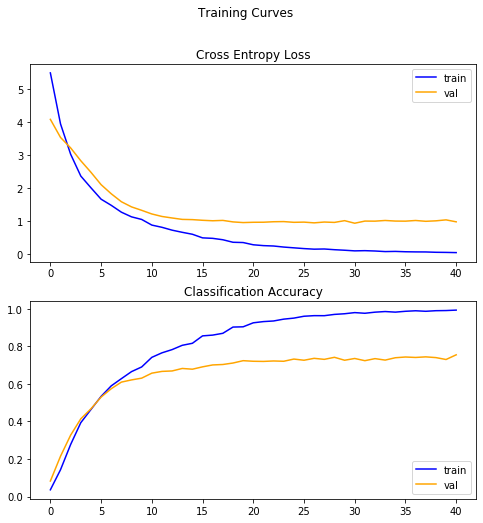


Test set evaluation metrics
30/30 [==============================] - 1s 32ms/step - loss: 1.0652 - accuracy: 0.7357
loss: 1.07
accuracy: 0.74


In [0]:
model_report(DenseNet121_MODEL_all, DenseNet121_MODEL_history_all, 32, 30)

### Freeze 10% of the layers

In [0]:
DenseNet121_MODEL_10 = init_DenseNet121_model(summary = True, trainable = "10")
DenseNet121_MODEL_history_10 = train_model_TL(DenseNet121_MODEL_10,"DenseNet121_10", 32, 200, 40, 10)

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
densenet121 (Model)          (None, 1, 1, 1024)        7037504   
_________________________________________________________________
dropout_1 (Dropout)          (None, 1, 1, 1024)        0         
_________________________________________________________________
global_average_pooling2d_1 ( (None, 1024)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               102500    
Total params: 7,140,004
Trainable params: 6,777,572
Non-trainable params: 362,432
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 16s 396ms/step - loss: 5.5970 - accuracy: 0.0299 - val_loss: 4.5617 - val_accuracy: 0.0391
Epoch 2/200
40/40 [==============================]

In [0]:
DenseNet121_MODEL_10.save("/content/drive/My Drive/NN/Lab3/MODELS/DenseNet121_10_trainable_32x32.h5")

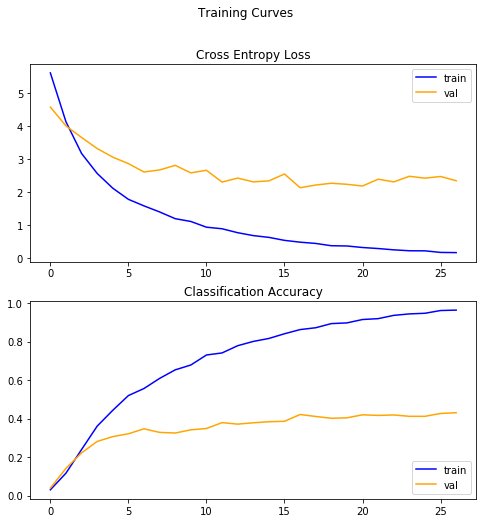


Test set evaluation metrics
30/30 [==============================] - 1s 32ms/step - loss: 2.3641 - accuracy: 0.4237
loss: 2.36
accuracy: 0.42


In [0]:
model_report(DenseNet121_MODEL_10, DenseNet121_MODEL_history_10, 32, 30)

### Freeze 20% of the layers

In [0]:
DenseNet121_MODEL_20 = init_DenseNet121_model(summary = True, trainable = "20")
DenseNet121_MODEL_history_20 = train_model_TL(DenseNet121_MODEL_20,"DenseNet121_20", 32, 200, 40, 10)

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
densenet121 (Model)          (None, 1, 1, 1024)        7037504   
_________________________________________________________________
dropout_2 (Dropout)          (None, 1, 1, 1024)        0         
_________________________________________________________________
global_average_pooling2d_2 ( (None, 1024)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 100)               102500    
Total params: 7,140,004
Trainable params: 6,404,964
Non-trainable params: 735,040
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 15s 375ms/step - loss: 5.6792 - accuracy: 0.0324 - val_loss: 4.6337 - val_accuracy: 0.0297
Epoch 2/200
40/40 [==============================]

In [0]:
DenseNet121_MODEL_20.save("/content/drive/My Drive/NN/Lab3/MODELS/DenseNet121_20_trainable_32x32.h5")

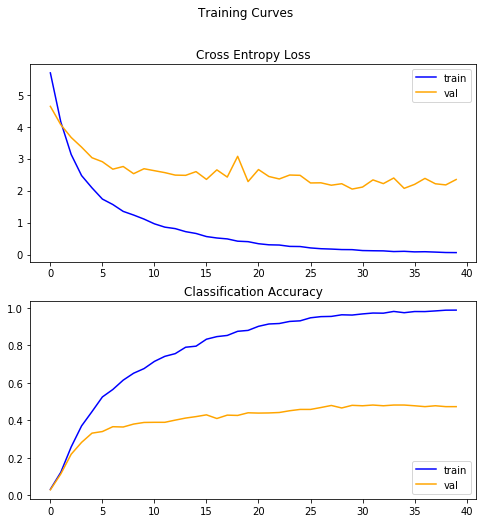


Test set evaluation metrics
30/30 [==============================] - 1s 34ms/step - loss: 2.3734 - accuracy: 0.4789
loss: 2.37
accuracy: 0.48


In [0]:
model_report(DenseNet121_MODEL_20, DenseNet121_MODEL_history_20, 32, 30)

### Freeze 30% of the layers

In [0]:
DenseNet121_MODEL_30 = init_DenseNet121_model(summary = True, trainable = "30")
DenseNet121_MODEL_history_30 = train_model_TL(DenseNet121_MODEL_30,"DenseNet121_30", 32, 200, 40, 10)

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
densenet121 (Model)          (None, 1, 1, 1024)        7037504   
_________________________________________________________________
dropout_3 (Dropout)          (None, 1, 1, 1024)        0         
_________________________________________________________________
global_average_pooling2d_3 ( (None, 1024)              0         
_________________________________________________________________
dense_3 (Dense)              (None, 100)               102500    
Total params: 7,140,004
Trainable params: 5,858,340
Non-trainable params: 1,281,664
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 15s 374ms/step - loss: 5.7055 - accuracy: 0.0281 - val_loss: 4.5142 - val_accuracy: 0.0719
Epoch 2/200
40/40 [=============================

In [0]:
DenseNet121_MODEL_30.save("/content/drive/My Drive/NN/Lab3/MODELS/DenseNet121_30_trainable_32x32.h5")

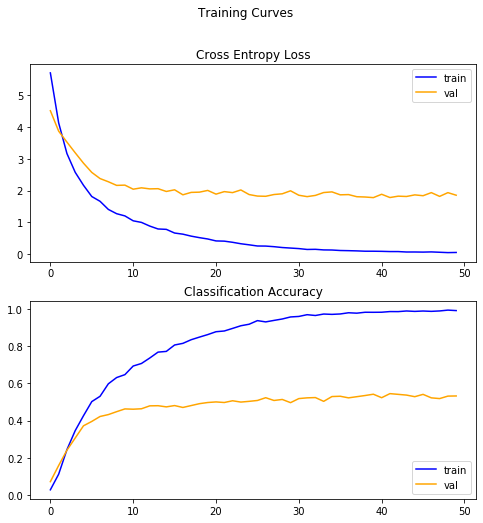


Test set evaluation metrics
30/30 [==============================] - 1s 30ms/step - loss: 1.9989 - accuracy: 0.5245
loss: 2.00
accuracy: 0.52


In [0]:
model_report(DenseNet121_MODEL_30, DenseNet121_MODEL_history_30, 32, 30)

### Only top layer is trainable

In [0]:
DenseNet121_MODEL_top = init_DenseNet121_model(summary = True, trainable = "top")
DenseNet121_MODEL_history_top = train_model_TL(DenseNet121_MODEL_top,"DenseNet121_top", 32, 200, 40, 10)

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
densenet121 (Model)          (None, 1, 1, 1024)        7037504   
_________________________________________________________________
dropout_4 (Dropout)          (None, 1, 1, 1024)        0         
_________________________________________________________________
global_average_pooling2d_4 ( (None, 1024)              0         
_________________________________________________________________
dense_4 (Dense)              (None, 100)               102500    
Total params: 7,140,004
Trainable params: 102,500
Non-trainable params: 7,037,504
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 9s 225ms/step - loss: 6.0707 - accuracy: 0.0145 - val_loss: 4.5666 - val_accuracy: 0.0359
Epoch 2/200
40/40 [==============================] 

In [0]:
DenseNet121_MODEL_top.save("/content/drive/My Drive/NN/Lab3/MODELS/DenseNet121_top_trainable_32x32.h5")

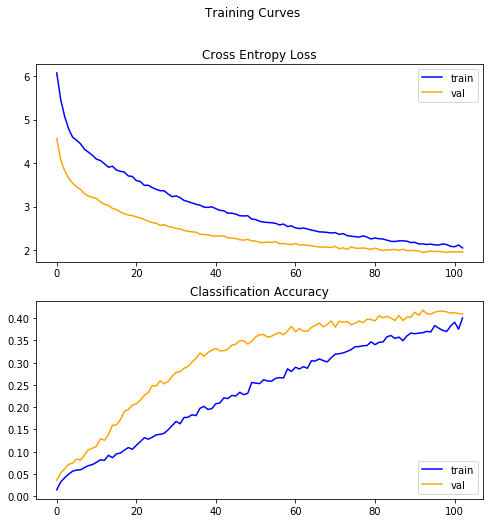


Test set evaluation metrics
30/30 [==============================] - 1s 31ms/step - loss: 1.9374 - accuracy: 0.4052
loss: 1.94
accuracy: 0.41


In [0]:
model_report(DenseNet121_MODEL_top, DenseNet121_MODEL_history_top, 32, 30)

## Efficient Nets

Next, we are going to apply transfer learning on the state of the art EfficientNets.

###  EfficientNetB0

EfficientNetB0 consists of the following layers:

![EfficientNetB0](https://cdn-images-1.medium.com/max/1000/1*OpvSpqMP61IO_9cp4mAXnA.png)

The default input size is 224x224x3. We can change the input size of the model using the parameter `input_shape`.

In addition, we won't include its default top layer. We will add a top layer specified for CIFAR100 classification (20 classes).

In [0]:
# transfer learning: EfficientNetB0 trained on ImageNet without the top layer

def init_EfficientNetB0_model(summary, trainable):
  EfficientNetB0_MODEL=EfficientNetB0(input_shape=(img_rows, img_cols, img_channels), include_top=False, weights='imagenet',utils= tf.keras.utils ,models = tf.keras.models,layers= tf.keras.layers, backend=tf.keras.backend)

  if (trainable == "all"):
    # unfreeze conv layers
    EfficientNetB0_MODEL.trainable=True
  elif (trainable == "top"):
    EfficientNetB0_MODEL.trainable=False
  else:
    percentage = float(trainable)/100
    nlayers =  len(EfficientNetB0_MODEL.layers)
    nfreeze = ceil(nlayers*percentage)

    for layer in EfficientNetB0_MODEL.layers[:nfreeze]:
	    layer.trainable = False


  dropout_layer = tf.keras.layers.Dropout(rate = 0.5)
  global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

  # add top layer for CIFAR100 classification
  prediction_layer = tf.keras.layers.Dense(len(CIFAR100_LABELS_LIST),activation='softmax')
  model = tf.keras.Sequential([EfficientNetB0_MODEL, dropout_layer, global_average_layer, prediction_layer])
  model.compile(optimizer=tf.optimizers.Adam(learning_rate=0.00005), loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=["accuracy"])
  if summary: 
    model.summary()
  return model

#### All layers are trainable

In [0]:
EfficientNetB0_MODEL_all = init_EfficientNetB0_model( True, "all")
EfficientNetB0_MODEL_history_all = train_model_TL(EfficientNetB0_MODEL_all, "EfficientNetB0_all", 32, 200, 40, 10)

16809984/16804768 [==============================] - 1s 0us/step
Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
efficientnet-b0 (Model)      (None, 1, 1, 1280)        4049564   
_________________________________________________________________
dropout_5 (Dropout)          (None, 1, 1, 1280)        0         
_________________________________________________________________
global_average_pooling2d_5 ( (None, 1280)              0         
_________________________________________________________________
dense_5 (Dense)              (None, 100)               128100    
Total params: 4,177,664
Trainable params: 4,135,648
Non-trainable params: 42,016
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 13s 319ms/step - loss: 5.4223 - accuracy: 0.0119 - val_loss: 4.7664 - val_acc

In [0]:
EfficientNetB0_MODEL_all.save("/content/drive/My Drive/NN/Lab3/MODELS/EfficientNetB0_all_trainable_32x32.h5")

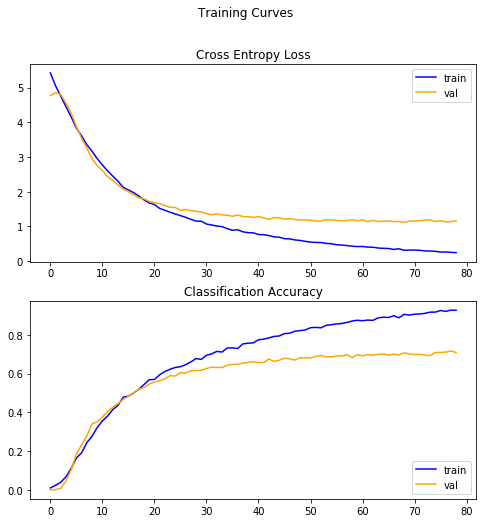


Test set evaluation metrics
30/30 [==============================] - 1s 24ms/step - loss: 1.1334 - accuracy: 0.7010
loss: 1.13
accuracy: 0.70


In [0]:
model_report(EfficientNetB0_MODEL_all, EfficientNetB0_MODEL_history_all, 32, 30)

#### Freeze 10% of the layers

In [0]:
EfficientNetB0_MODEL_10 = init_EfficientNetB0_model(summary = True, trainable = "10")
EfficientNetB0_MODEL_history_10 = train_model_TL(EfficientNetB0_MODEL_10,"EfficientNetB0_10", 32, 200, 40, 10)

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
efficientnet-b0 (Model)      (None, 1, 1, 1280)        4049564   
_________________________________________________________________
dropout_6 (Dropout)          (None, 1, 1, 1280)        0         
_________________________________________________________________
global_average_pooling2d_6 ( (None, 1280)              0         
_________________________________________________________________
dense_6 (Dense)              (None, 100)               128100    
Total params: 4,177,664
Trainable params: 4,130,100
Non-trainable params: 47,564
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 12s 302ms/step - loss: 5.4153 - accuracy: 0.0137 - val_loss: 4.7388 - val_accuracy: 0.0094
Epoch 2/200
40/40 [==============================] 

In [0]:
EfficientNetB0_MODEL_10.save("/content/drive/My Drive/NN/Lab3/MODELS/EfficientNetB0_10_trainable_32x32.h5")

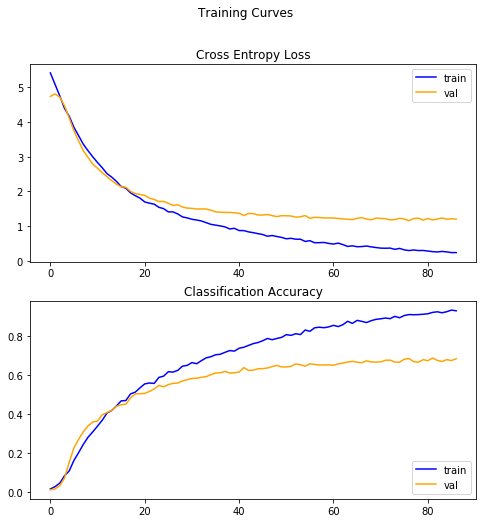


Test set evaluation metrics
30/30 [==============================] - 1s 23ms/step - loss: 1.2299 - accuracy: 0.6828
loss: 1.23
accuracy: 0.68


In [0]:
model_report(EfficientNetB0_MODEL_10, EfficientNetB0_MODEL_history_10, 32, 30)

#### Freeze 20% of the layers

In [0]:
EfficientNetB0_MODEL_20 = init_EfficientNetB0_model(summary = True, trainable = "20")
EfficientNetB0_MODEL_history_20 = train_model_TL(EfficientNetB0_MODEL_20,"EfficientNetB0_20", 32, 200, 40, 10)

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
efficientnet-b0 (Model)      (None, 1, 1, 1280)        4049564   
_________________________________________________________________
dropout_7 (Dropout)          (None, 1, 1, 1280)        0         
_________________________________________________________________
global_average_pooling2d_7 ( (None, 1280)              0         
_________________________________________________________________
dense_7 (Dense)              (None, 100)               128100    
Total params: 4,177,664
Trainable params: 4,109,214
Non-trainable params: 68,450
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 11s 266ms/step - loss: 5.3614 - accuracy: 0.0152 - val_loss: 4.8127 - val_accuracy: 0.0055
Epoch 2/200
40/40 [==============================] 

In [0]:
EfficientNetB0_MODEL_20.save("/content/drive/My Drive/NN/Lab3/MODELS/EfficientNetB0_20_trainable_32x32.h5")

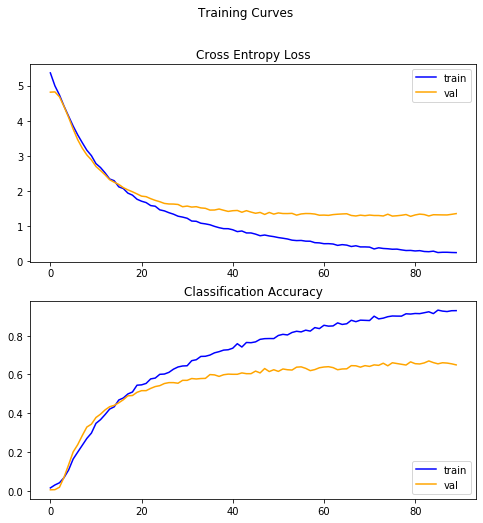


Test set evaluation metrics
30/30 [==============================] - 1s 24ms/step - loss: 1.2693 - accuracy: 0.6633
loss: 1.27
accuracy: 0.66


In [0]:
model_report(EfficientNetB0_MODEL_20, EfficientNetB0_MODEL_history_20, 32, 30)

#### Only top layer is trainable

In [0]:
EfficientNetB0_MODEL_top = init_EfficientNetB0_model(summary = True, trainable = "top")
EfficientNetB0_MODEL_history_top = train_model_TL(EfficientNetB0_MODEL_top,"EfficientNetB0_top", 32, 200, 40, 10)

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
efficientnet-b0 (Model)      (None, 1, 1, 1280)        4049564   
_________________________________________________________________
dropout_8 (Dropout)          (None, 1, 1, 1280)        0         
_________________________________________________________________
global_average_pooling2d_8 ( (None, 1280)              0         
_________________________________________________________________
dense_8 (Dense)              (None, 100)               128100    
Total params: 4,177,664
Trainable params: 128,100
Non-trainable params: 4,049,564
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 7s 178ms/step - loss: 4.3932 - accuracy: 0.0383 - val_loss: 4.0881 - val_accuracy: 0.0656
Epoch 2/200
40/40 [==============================] 

In [0]:
EfficientNetB0_MODEL_top.save("/content/drive/My Drive/NN/Lab3/MODELS/EfficientNetB0_top_trainable_32x32.h5")

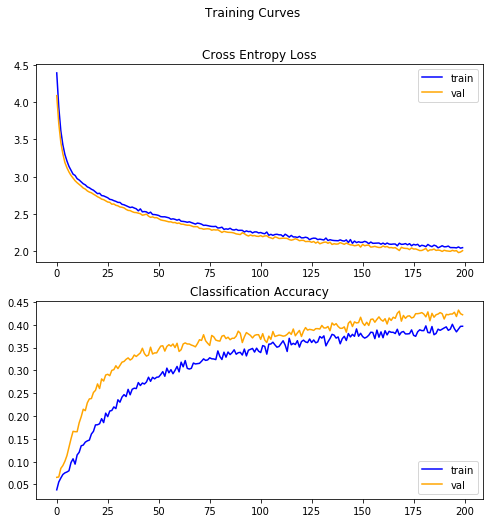


Test set evaluation metrics
30/30 [==============================] - 1s 25ms/step - loss: 1.9510 - accuracy: 0.4141
loss: 1.95
accuracy: 0.41


In [0]:
model_report(EfficientNetB0_MODEL_top, EfficientNetB0_MODEL_history_top, 32, 30)

###  EfficientNetB4

EfficientNetB4:

![EfficientNetB4](https://pythonawesome.com/content/images/2019/06/params.png)

The default input size is 224x224x3. We can change the input size of the model using the parameter `input_shape`.

In addition, we won't include its default top layer. We will add a top layer specified for CIFAR100 classification (20 classes).

In [0]:
# transfer learning: EfficientNetB4 trained on ImageNet without the top layer

def init_EfficientNetB4_model(summary, trainable):
  EfficientNetB4_MODEL=EfficientNetB4(input_shape=(img_rows, img_cols, img_channels), include_top=False, weights='imagenet',utils= tf.keras.utils ,models = tf.keras.models,layers= tf.keras.layers, backend=tf.keras.backend)

  if (trainable == "all"):
    # unfreeze conv layers
    EfficientNetB4_MODEL.trainable=True
  elif (trainable == "top"):
    EfficientNetB4_MODEL.trainable=False
  else:
    percentage = float(trainable)/100
    nlayers =  len(EfficientNetB4_MODEL.layers)
    nfreeze = ceil(nlayers*percentage)

    for layer in EfficientNetB4_MODEL.layers[:nfreeze]:
	    layer.trainable = False


  dropout_layer = tf.keras.layers.Dropout(rate = 0.5)
  global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

  # add top layer for CIFAR100 classification
  prediction_layer = tf.keras.layers.Dense(len(CIFAR100_LABELS_LIST),activation='softmax')
  model = tf.keras.Sequential([EfficientNetB4_MODEL, dropout_layer, global_average_layer, prediction_layer])
  model.compile(optimizer=tf.optimizers.Adam(learning_rate=0.00005), loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=["accuracy"])
  if summary: 
    model.summary()
  return model

#### All layers are trainable

In [0]:
EfficientNetB4_MODEL_all = init_EfficientNetB4_model( True, "all")
EfficientNetB4_MODEL_history_all = train_model_TL(EfficientNetB4_MODEL_all, "EfficientNetB4_all", 32, 200, 40, 10)

71892992/71892840 [==============================] - 3s 0us/step
Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
efficientnet-b4 (Model)      (None, 1, 1, 1792)        17673816  
_________________________________________________________________
dropout_9 (Dropout)          (None, 1, 1, 1792)        0         
_________________________________________________________________
global_average_pooling2d_9 ( (None, 1792)              0         
_________________________________________________________________
dense_9 (Dense)              (None, 100)               179300    
Total params: 17,853,116
Trainable params: 17,727,916
Non-trainable params: 125,200
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 28s 710ms/step - loss: 4.9173 - accuracy: 0.0141 - val_loss: 4.4527 - val_

In [0]:
EfficientNetB4_MODEL_all.save("/content/drive/My Drive/NN/Lab3/MODELS/EfficientNetB4_all_trainable_32x32.h5")

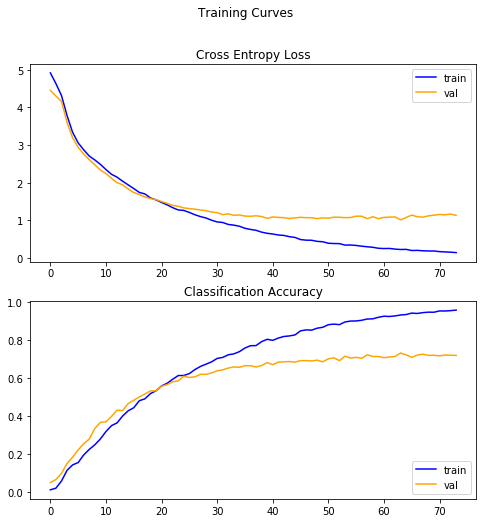


Test set evaluation metrics
30/30 [==============================] - 2s 57ms/step - loss: 1.2084 - accuracy: 0.7010
loss: 1.21
accuracy: 0.70


In [0]:
model_report(EfficientNetB4_MODEL_all, EfficientNetB4_MODEL_history_all, 32, 30)

#### Freeze 10% of the layers

In [0]:
EfficientNetB4_MODEL_10 = init_EfficientNetB4_model(summary = True, trainable = "10")
EfficientNetB4_MODEL_history_10 = train_model_TL(EfficientNetB4_MODEL_10,"EfficientNetB4_10", 32, 200, 40, 10)

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
efficientnet-b4 (Model)      (None, 1, 1, 1792)        17673816  
_________________________________________________________________
dropout_10 (Dropout)         (None, 1, 1, 1792)        0         
_________________________________________________________________
global_average_pooling2d_10  (None, 1792)              0         
_________________________________________________________________
dense_10 (Dense)             (None, 100)               179300    
Total params: 17,853,116
Trainable params: 17,701,860
Non-trainable params: 151,256
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 26s 655ms/step - loss: 4.9138 - accuracy: 0.0133 - val_loss: 4.4169 - val_accuracy: 0.0422
Epoch 2/200
40/40 [============================

In [0]:
EfficientNetB4_MODEL_10.save("/content/drive/My Drive/NN/Lab3/MODELS/EfficientNetB4_10_trainable_32x32.h5")

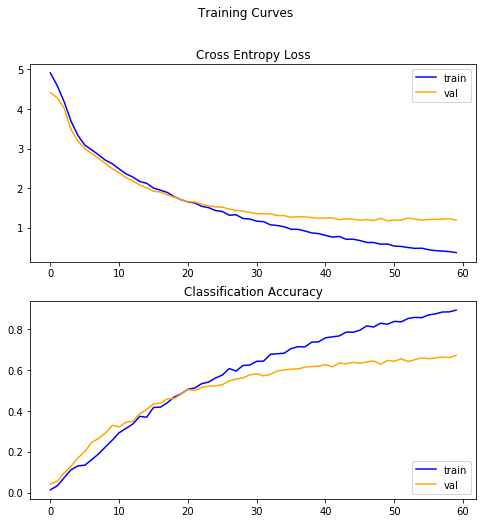


Test set evaluation metrics
30/30 [==============================] - 2s 58ms/step - loss: 1.2135 - accuracy: 0.6719
loss: 1.21
accuracy: 0.67


In [0]:
model_report(EfficientNetB4_MODEL_10, EfficientNetB4_MODEL_history_10, 32, 30)

#### Freeze 20% of the layers

In [0]:
EfficientNetB4_MODEL_20 = init_EfficientNetB4_model(summary = True, trainable = "20")
EfficientNetB4_MODEL_history_20 = train_model_TL(EfficientNetB4_MODEL_20,"EfficientNetB4_20", 32, 200, 40, 10)

Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
efficientnet-b4 (Model)      (None, 1, 1, 1792)        17673816  
_________________________________________________________________
dropout_11 (Dropout)         (None, 1, 1, 1792)        0         
_________________________________________________________________
global_average_pooling2d_11  (None, 1792)              0         
_________________________________________________________________
dense_11 (Dense)             (None, 100)               179300    
Total params: 17,853,116
Trainable params: 17,641,156
Non-trainable params: 211,960
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 24s 591ms/step - loss: 4.8767 - accuracy: 0.0158 - val_loss: 4.4410 - val_accuracy: 0.0523
Epoch 2/200
40/40 [============================

In [0]:
EfficientNetB4_MODEL_20.save("/content/drive/My Drive/NN/Lab3/MODELS/EfficientNetB4_20_trainable_32x32.h5")

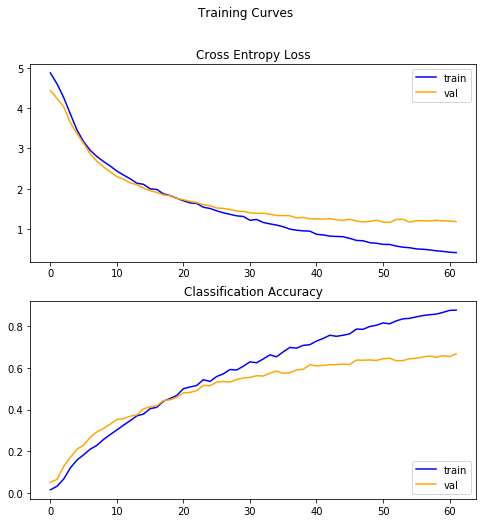


Test set evaluation metrics
30/30 [==============================] - 2s 57ms/step - loss: 1.1801 - accuracy: 0.6680
loss: 1.18
accuracy: 0.67


In [0]:
model_report(EfficientNetB4_MODEL_20, EfficientNetB4_MODEL_history_20, 32, 30)

#### Only top layer is trainable

In [0]:
EfficientNetB4_MODEL_top = init_EfficientNetB4_model(summary = True, trainable = "top")
EfficientNetB4_MODEL_history_top = train_model_TL(EfficientNetB4_MODEL_top,"EfficientNetB4_top", 32, 200, 40, 10)

Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
efficientnet-b4 (Model)      (None, 1, 1, 1792)        17673816  
_________________________________________________________________
dropout_12 (Dropout)         (None, 1, 1, 1792)        0         
_________________________________________________________________
global_average_pooling2d_12  (None, 1792)              0         
_________________________________________________________________
dense_12 (Dense)             (None, 100)               179300    
Total params: 17,853,116
Trainable params: 179,300
Non-trainable params: 17,673,816
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 15s 372ms/step - loss: 4.2776 - accuracy: 0.0445 - val_loss: 3.7375 - val_accuracy: 0.0453
Epoch 2/200
40/40 [============================

In [0]:
EfficientNetB4_MODEL_top.save("/content/drive/My Drive/NN/Lab3/MODELS/EfficientNetB4_top_trainable_32x32.h5")

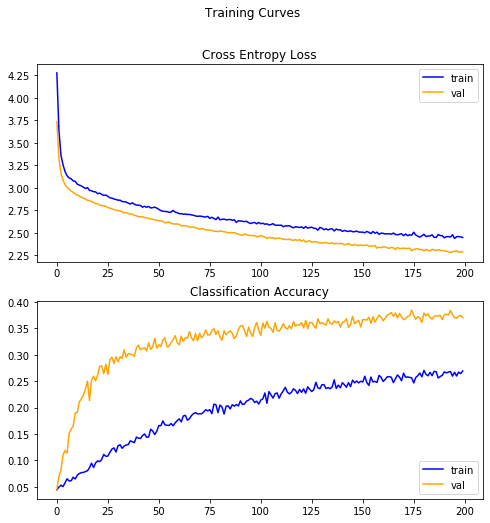


Test set evaluation metrics
30/30 [==============================] - 2s 57ms/step - loss: 2.3071 - accuracy: 0.3591
loss: 2.31
accuracy: 0.36


In [0]:
model_report(EfficientNetB4_MODEL_top, EfficientNetB4_MODEL_history_top, 32, 30)

###  EfficientNetB7

EfficientNetB7 has the higher number of parameters and the higher accuracy on Imagenet.

![EfficientNetB7](https://pythonawesome.com/content/images/2019/06/params.png)

The default input size is 224x224x3. We can change the input size of the model using the parameter `input_shape`.

In addition, we won't include its default top layer. We will add a top layer specified for CIFAR100 classification (20 classes).

In [0]:
# transfer learning: EfficientNetB7 trained on ImageNet without the top layer

def init_EfficientNetB7_model(summary, trainable):
  EfficientNetB7_MODEL=EfficientNetB7(input_shape=(img_rows, img_cols, img_channels), include_top=False, weights='imagenet',utils= tf.keras.utils ,models = tf.keras.models,layers= tf.keras.layers, backend=tf.keras.backend)

  if (trainable == "all"):
    # unfreeze conv layers
    EfficientNetB7_MODEL.trainable=True
  elif (trainable == "top"):
    EfficientNetB7_MODEL.trainable=False
  else:
    percentage = float(trainable)/100
    nlayers =  len(EfficientNetB7_MODEL.layers)
    nfreeze = ceil(nlayers*percentage)

    for layer in EfficientNetB7_MODEL.layers[:nfreeze]:
	    layer.trainable = False


  dropout_layer = tf.keras.layers.Dropout(rate = 0.5)
  global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

  # add top layer for CIFAR100 classification
  prediction_layer = tf.keras.layers.Dense(len(CIFAR100_LABELS_LIST),activation='softmax')
  model = tf.keras.Sequential([EfficientNetB7_MODEL, dropout_layer, global_average_layer, prediction_layer])
  model.compile(optimizer=tf.optimizers.Adam(learning_rate=0.00005), loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=["accuracy"])
  if summary: 
    model.summary()
  return model

#### All layers are trainable

In [0]:
EfficientNetB7_MODEL_all = init_EfficientNetB7_model( True, "all")
EfficientNetB7_MODEL_history_all = train_model_TL(EfficientNetB7_MODEL_all, "EfficientNetB7_all", 32, 200, 40, 10)

258441216/258434480 [==============================] - 9s 0us/step
Model: "sequential_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
efficientnet-b7 (Model)      (None, 1, 1, 2560)        64097680  
_________________________________________________________________
dropout_15 (Dropout)         (None, 1, 1, 2560)        0         
_________________________________________________________________
global_average_pooling2d_15  (None, 2560)              0         
_________________________________________________________________
dense_15 (Dense)             (None, 100)               256100    
Total params: 64,353,780
Trainable params: 64,043,060
Non-trainable params: 310,720
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 57s 1s/step - loss: 4.5552 - accuracy: 0.0354 - val_loss: 10.7616 - val

In [0]:
EfficientNetB7_MODEL_all.save("/content/drive/My Drive/NN/Lab3/MODELS/EfficientNetB7_all_trainable_32x32.h5")

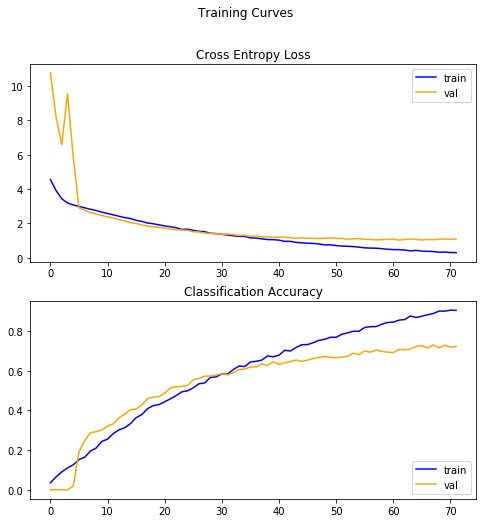


Test set evaluation metrics
30/30 [==============================] - 3s 94ms/step - loss: 1.0951 - accuracy: 0.7229
loss: 1.10
accuracy: 0.72


In [0]:
model_report(EfficientNetB7_MODEL_all, EfficientNetB7_MODEL_history_all, 32, 30)

#### Freeze 10% of the layers

In [0]:
EfficientNetB7_MODEL_10 = init_EfficientNetB7_model(summary = True, trainable = "10")
EfficientNetB7_MODEL_history_10 = train_model_TL(EfficientNetB7_MODEL_10,"EfficientNetB7_10", 32, 200, 40, 10)

Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
efficientnet-b7 (Model)      (None, 1, 1, 2560)        64097680  
_________________________________________________________________
dropout_16 (Dropout)         (None, 1, 1, 2560)        0         
_________________________________________________________________
global_average_pooling2d_16  (None, 2560)              0         
_________________________________________________________________
dense_16 (Dense)             (None, 100)               256100    
Total params: 64,353,780
Trainable params: 63,955,960
Non-trainable params: 397,820
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 53s 1s/step - loss: 4.5262 - accuracy: 0.0350 - val_loss: 10.6065 - val_accuracy: 0.0000e+00
Epoch 2/200
40/40 [==========================

In [0]:
EfficientNetB7_MODEL_10.save("/content/drive/My Drive/NN/Lab3/MODELS/EfficientNetB7_10_trainable_32x32.h5")

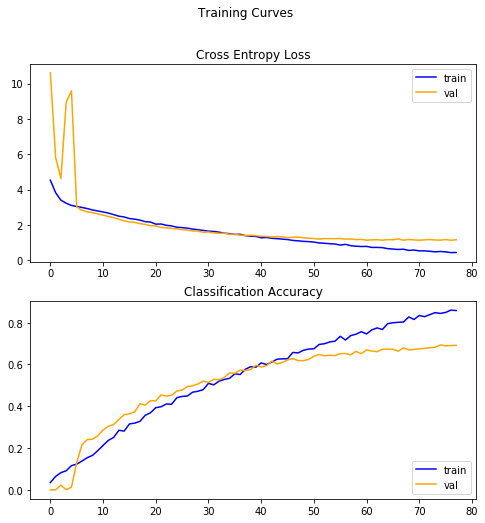


Test set evaluation metrics
30/30 [==============================] - 3s 94ms/step - loss: 1.1355 - accuracy: 0.6867
loss: 1.14
accuracy: 0.69


In [0]:
model_report(EfficientNetB7_MODEL_10, EfficientNetB7_MODEL_history_10, 32, 30)

#### Freeze 20% of the layers

In [0]:
EfficientNetB7_MODEL_20 = init_EfficientNetB7_model(summary = True, trainable = "20")
EfficientNetB7_MODEL_history_20 = train_model_TL(EfficientNetB7_MODEL_20,"EfficientNetB7_20", 32, 200, 40, 10)

258441216/258434480 [==============================] - 8s 0us/step
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
efficientnet-b7 (Model)      (None, 1, 1, 2560)        64097680  
_________________________________________________________________
dropout (Dropout)            (None, 1, 1, 2560)        0         
_________________________________________________________________
global_average_pooling2d (Gl (None, 2560)              0         
_________________________________________________________________
dense (Dense)                (None, 100)               256100    
Total params: 64,353,780
Trainable params: 63,751,216
Non-trainable params: 602,564
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 54s 1s/step - loss: 4.5827 - accuracy: 0.0281 - val_loss: 8.6500 - val_acc

In [0]:
EfficientNetB7_MODEL_20.save("/content/drive/My Drive/NN/Lab3/MODELS/EfficientNetB7_20_trainable_32x32.h5")

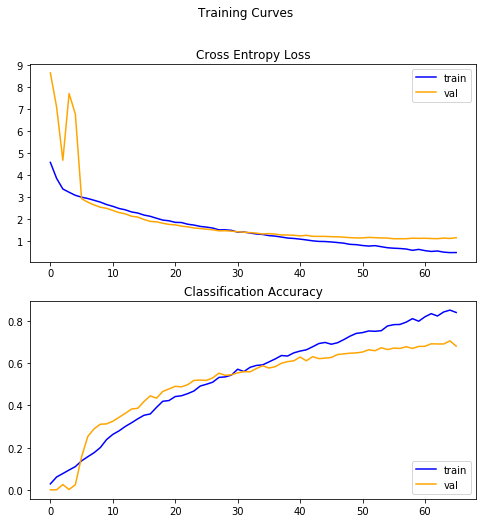


Test set evaluation metrics
30/30 [==============================] - 3s 87ms/step - loss: 1.1053 - accuracy: 0.6969
loss: 1.11
accuracy: 0.70


In [0]:
model_report(EfficientNetB7_MODEL_20, EfficientNetB7_MODEL_history_20, 32, 30)

#### Only top layer is trainable

In [0]:
EfficientNetB7_MODEL_top = init_EfficientNetB7_model(summary = True, trainable = "top")
EfficientNetB7_MODEL_history_top = train_model_TL(EfficientNetB7_MODEL_top,"EfficientNetB7_top", 32, 200, 40, 10)

258441216/258434480 [==============================] - 5s 0us/step
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
efficientnet-b7 (Model)      (None, 1, 1, 2560)        64097680  
_________________________________________________________________
dropout (Dropout)            (None, 1, 1, 2560)        0         
_________________________________________________________________
global_average_pooling2d (Gl (None, 2560)              0         
_________________________________________________________________
dense (Dense)                (None, 100)               256100    
Total params: 64,353,780
Trainable params: 256,100
Non-trainable params: 64,097,680
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 37s 932ms/step - loss: 16.2179 - accuracy: 0.0334 - val_loss: 3.6265 - val

In [0]:
EfficientNetB7_MODEL_top.save("/content/drive/My Drive/NN/Lab3/MODELS/EfficientNetB7_top_trainable_32x32.h5")

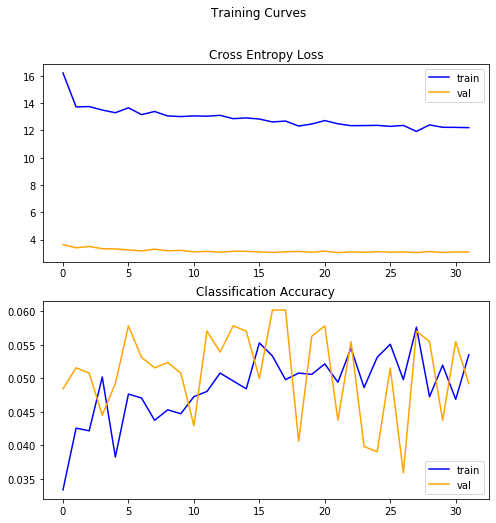


Test set evaluation metrics
30/30 [==============================] - 4s 126ms/step - loss: 3.0919 - accuracy: 0.0536
loss: 3.09
accuracy: 0.05


In [0]:
model_report(EfficientNetB7_MODEL_top, EfficientNetB7_MODEL_history_top, 32, 30)

## Retraining XCEPTION

The best accuracy, 0.90, was achieved using transfer learning on the XCEPTION model, followed by the acuracy 0.83 of the InceptionResNetV2.

XCEPTION achieved higher accuracy while having 21,973,252 trainable parameters, less than half of the InceptionResNetV2's trainable parameters. Which lead to a smaller model size of 241MB versus the 626MB model size of the InceptionResNetV2. Both sizes were calculated while training all the layers of the neural network.

However the training of the XCEPTION model lasted about the same time as the training of the InceptionResNetV2 model, while having way less trainable parameters. Therefore below we will not only try to optimize our accuracy but also our model's overall performance.

In [0]:
def train_XCEPTION(model, name, epochs = 10, steps_per_epoch = 2, validation_steps = 1, reduce_factor = 0.2, patience = 10):

  logdir = os.path.join("/content/drive/My Drive/NN/Lab3/MODELS/logs", name + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)
  early_stopping_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience = 10) 

  if (reduce_factor < 1):
    reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=reduce_factor,
                              patience=5, min_lr=0.00001)

  if (reduce_factor == 1):
    history = model.fit(train_ds_78, epochs=epochs, steps_per_epoch=steps_per_epoch, validation_data=validation_ds_78, validation_steps=validation_steps, callbacks=[tensorboard_callback, early_stopping_callback])
  else:
    history = model.fit(train_ds_78, epochs=epochs, steps_per_epoch=steps_per_epoch, validation_data=validation_ds_78, validation_steps=validation_steps, callbacks=[tensorboard_callback, early_stopping_callback,reduce_lr])

  return(history)

In [0]:
def init_Xception_model(summary, optimizer = "adam"):
  Xception_MODEL=Xception(input_shape=TARGET_SIZE, include_top=False, weights='imagenet')

  dropout_layer = tf.keras.layers.Dropout(rate = 0.5)
  global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

  # add top layer for CIFAR100 classification
  prediction_layer = tf.keras.layers.Dense(len(CIFAR100_LABELS_LIST),activation='softmax')
  model = tf.keras.Sequential([Xception_MODEL, dropout_layer, global_average_layer, prediction_layer])

  if optimizer=='adagrad':
    model.compile(optimizer=tf.optimizers.Adagrad(), loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=["accuracy"])
  elif optimizer=='nadam':
    model.compile(optimizer=tf.optimizers.Nadam(), loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=["accuracy"])
  elif optimizer=='sgd':
    model.compile(optimizer=tf.optimizers.SGD(), loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=["accuracy"])
  else:
    model.compile(optimizer=tf.optimizers.Adam(), loss=tf.keras.losses.sparse_categorical_crossentropy, metrics=["accuracy"])

  if summary: 
    model.summary()
  return model

### Optimizers

#### Adam optimizer using reducing learning rate (factor=0.2)

In [0]:
Xception_adam_rlr = init_Xception_model(True)
Xception_adam_rlr_history = train_XCEPTION(Xception_adam_rlr, "Xception_adam_rlr", epochs=200, steps_per_epoch=40, validation_steps=10, reduce_factor=0.2, patience=10)

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
xception (Model)             (None, 3, 3, 2048)        20861480  
_________________________________________________________________
dropout_1 (Dropout)          (None, 3, 3, 2048)        0         
_________________________________________________________________
global_average_pooling2d_1 ( (None, 2048)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 100)               204900    
Total params: 21,066,380
Trainable params: 21,011,852
Non-trainable params: 54,528
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 23s 565ms/step - loss: 1.3634 - accuracy: 0.6807 - val_loss: 2.9752 - val_accuracy: 0.6367
Epoch 2/200
40/40 [==============================

In [0]:
Xception_adam_rlr.save("/content/drive/My Drive/Νευρωνικά/Lab3/THANOS_MODELS/Xception_adam_rlr.h5")

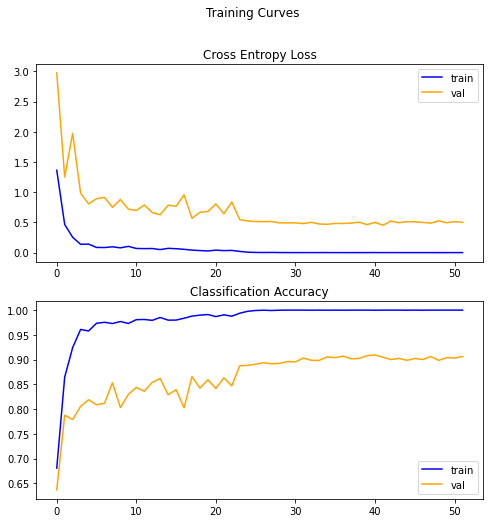


Test set evaluation metrics
30/30 [==============================] - 6s 192ms/step - loss: 0.4564 - accuracy: 0.9083
loss: 0.46
accuracy: 0.91


In [0]:
model_report(Xception_adam_rlr, Xception_adam_rlr_history, 78, 30)

#### Adagrad optimizer

> Adagrad is an optimizer with parameter-specific learning rates, which are adapted relative to how frequently a parameter gets updated during training. The more updates a parameter receives, the smaller the learning rate.

Therefore we wont use reducing learning rate in our training (factor=1)

In [0]:
Xception_adagrad = init_Xception_model(True,'adagrad')
Xception_adagrad_history = train_XCEPTION(Xception_adagrad, "Xception_adagrad", epochs=200, steps_per_epoch=40, validation_steps=10, reduce_factor=1, patience=10)

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
xception (Model)             (None, 3, 3, 2048)        20861480  
_________________________________________________________________
dropout_4 (Dropout)          (None, 3, 3, 2048)        0         
_________________________________________________________________
global_average_pooling2d_4 ( (None, 2048)              0         
_________________________________________________________________
dense_4 (Dense)              (None, 100)               204900    
Total params: 21,066,380
Trainable params: 21,011,852
Non-trainable params: 54,528
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 34s 860ms/step - loss: 4.6450 - accuracy: 0.0109 - val_loss: 4.5976 - val_accuracy: 0.0164
Epoch 2/200
40/40 [==============================

In [0]:
Xception_adagrad.save("/content/drive/My Drive/Νευρωνικά/Lab3/THANOS_MODELS/Xception_adagrad.h5")

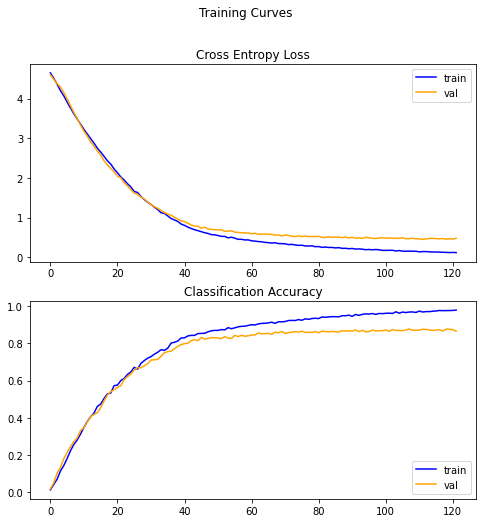


Test set evaluation metrics
30/30 [==============================] - 8s 256ms/step - loss: 0.4709 - accuracy: 0.8604
loss: 0.47
accuracy: 0.86


In [0]:
model_report(Xception_adagrad, Xception_adagrad_history, 78, 30)

#### Nadam optimizer using reducing learning rate (factor=0.2)

In [0]:
Xception_Nadam_rlr = init_Xception_model(True, 'nadam')
Xception_Nadam_rlr_history = train_XCEPTION(Xception_Nadam_rlr, "Xception_Nadam_rlr", epochs=200, steps_per_epoch=40, validation_steps=10, reduce_factor=0.2, patience=10)

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
xception (Model)             (None, 3, 3, 2048)        20861480  
_________________________________________________________________
dropout_5 (Dropout)          (None, 3, 3, 2048)        0         
_________________________________________________________________
global_average_pooling2d_5 ( (None, 2048)              0         
_________________________________________________________________
dense_5 (Dense)              (None, 100)               204900    
Total params: 21,066,380
Trainable params: 21,011,852
Non-trainable params: 54,528
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 27s 676ms/step - loss: 1.2950 - accuracy: 0.6959 - val_loss: 2.3752 - val_accuracy: 0.6852
Epoch 2/200
40/40 [==============================

In [0]:
Xception_Nadam_rlr.save("/content/drive/My Drive/Νευρωνικά/Lab3/THANOS_MODELS/Xception_Nadam_rlr.h5")

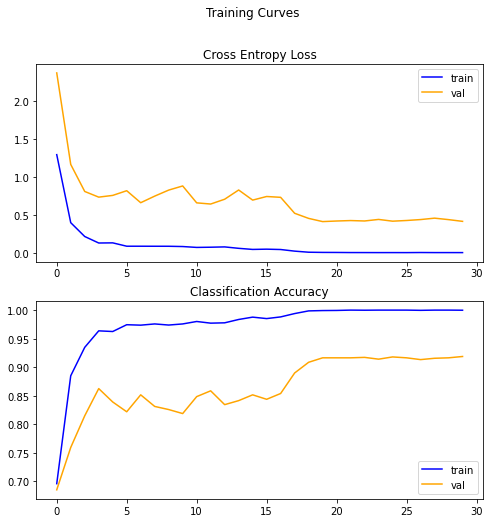


Test set evaluation metrics
30/30 [==============================] - 2s 74ms/step - loss: 0.4557 - accuracy: 0.8984
loss: 0.46
accuracy: 0.90


In [0]:
model_report(Xception_Nadam_rlr, Xception_Nadam_rlr_history, 78, 30)

#### SGD optimizer using reducing learning rate (factor=0.2) and Nesterov momentum

In [0]:
Xception_SGD_rlr = init_Xception_model(True, 'sgd')
Xception_SGD_rlr_history = train_XCEPTION(Xception_SGD_rlr, "Xception_SGD_rlr", epochs=200, steps_per_epoch=40, validation_steps=10, reduce_factor=0.2, patience=10)

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
xception (Model)             (None, 3, 3, 2048)        20861480  
_________________________________________________________________
dropout_6 (Dropout)          (None, 3, 3, 2048)        0         
_________________________________________________________________
global_average_pooling2d_6 ( (None, 2048)              0         
_________________________________________________________________
dense_6 (Dense)              (None, 100)               204900    
Total params: 21,066,380
Trainable params: 21,011,852
Non-trainable params: 54,528
_________________________________________________________________
Train for 40 steps, validate for 10 steps
Epoch 1/200
40/40 [==============================] - 15s 380ms/step - loss: 4.4584 - accuracy: 0.0580 - val_loss: 4.1223 - val_accuracy: 0.1430
Epoch 2/200
40/40 [==============================

In [0]:
Xception_SGD_rlr.save("/content/drive/My Drive/Νευρωνικά/Lab3/THANOS_MODELS/Xception_SGD_rlr.h5")

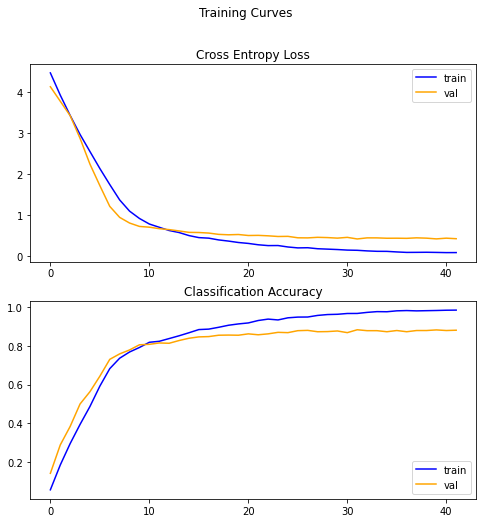


Test set evaluation metrics
30/30 [==============================] - 2s 73ms/step - loss: 0.4477 - accuracy: 0.8716
loss: 0.45
accuracy: 0.87


In [0]:
model_report(Xception_SGD_rlr, Xception_SGD_rlr_history, 78, 30)

### Training steps per epoch

We managed to increase the accuracy of the XCEPTION model to 0.91 by including the reducing learning rate callback. Now lets try different training steps per epoch to reduce the training time.

#### Training steps: 10

In [0]:
Xception_adam_rlr_10 = init_Xception_model(True)
Xception_adam_rlr_10_history = train_XCEPTION(Xception_adam_rlr_10, "Xception_adam_rlr_10", epochs=200, steps_per_epoch=10, validation_steps=10, reduce_factor=0.2, patience=10)

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
xception (Model)             (None, 3, 3, 2048)        20861480  
_________________________________________________________________
dropout_9 (Dropout)          (None, 3, 3, 2048)        0         
_________________________________________________________________
global_average_pooling2d_9 ( (None, 2048)              0         
_________________________________________________________________
dense_9 (Dense)              (None, 100)               204900    
Total params: 21,066,380
Trainable params: 21,011,852
Non-trainable params: 54,528
_________________________________________________________________
Train for 10 steps, validate for 10 steps
Epoch 1/200
10/10 [==============================] - 11s 1s/step - loss: 3.0090 - accuracy: 0.3781 - val_loss: 2.2791 - val_accuracy: 0.4953
Epoch 2/200
10/10 [==============================] -

In [0]:
Xception_adam_rlr_10.save("/content/drive/My Drive/Νευρωνικά/Lab3/THANOS_MODELS/Xception_adam_rlr_10.h5")

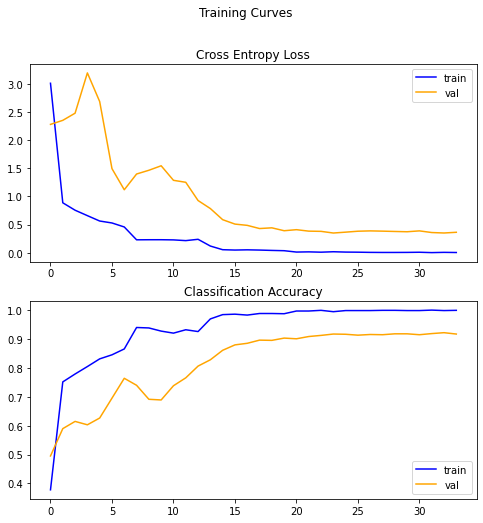


Test set evaluation metrics
30/30 [==============================] - 6s 192ms/step - loss: 0.3414 - accuracy: 0.9057
loss: 0.34
accuracy: 0.91


In [0]:
model_report(Xception_adam_rlr_10, Xception_adam_rlr_10_history, 78, 30)

#### Training steps: 20

In [0]:
Xception_adam_rlr_20 = init_Xception_model(True)
Xception_adam_rlr_20_history = train_XCEPTION(Xception_adam_rlr_20, "Xception_adam_rlr_20", epochs=200, steps_per_epoch=20, validation_steps=10, reduce_factor=0.2, patience=10)

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
xception (Model)             (None, 3, 3, 2048)        20861480  
_________________________________________________________________
dropout_7 (Dropout)          (None, 3, 3, 2048)        0         
_________________________________________________________________
global_average_pooling2d_7 ( (None, 2048)              0         
_________________________________________________________________
dense_7 (Dense)              (None, 100)               204900    
Total params: 21,066,380
Trainable params: 21,011,852
Non-trainable params: 54,528
_________________________________________________________________
Train for 20 steps, validate for 10 steps
Epoch 1/200
20/20 [==============================] - 13s 663ms/step - loss: 1.9939 - accuracy: 0.5465 - val_loss: 2.0975 - val_accuracy: 0.5906
Epoch 2/200
20/20 [==============================

In [0]:
Xception_adam_rlr_20.save("/content/drive/My Drive/Νευρωνικά/Lab3/THANOS_MODELS/Xception_adam_rlr_20.h5")

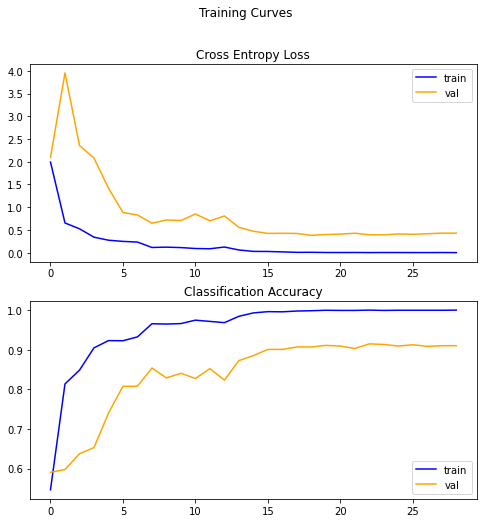


Test set evaluation metrics
30/30 [==============================] - 2s 71ms/step - loss: 0.3557 - accuracy: 0.9161
loss: 0.36
accuracy: 0.92


In [0]:
model_report(Xception_adam_rlr_20, Xception_adam_rlr_20_history, 78, 30)

#### Training steps: 60

In [0]:
Xception_adam_rlr_60 = init_Xception_model(True)
Xception_adam_rlr_60_history = train_XCEPTION(Xception_adam_rlr_60, "Xception_adam_rlr_60", epochs=200, steps_per_epoch=60, validation_steps=10, reduce_factor=0.2, patience=10)

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
xception (Model)             (None, 3, 3, 2048)        20861480  
_________________________________________________________________
dropout_8 (Dropout)          (None, 3, 3, 2048)        0         
_________________________________________________________________
global_average_pooling2d_8 ( (None, 2048)              0         
_________________________________________________________________
dense_8 (Dense)              (None, 100)               204900    
Total params: 21,066,380
Trainable params: 21,011,852
Non-trainable params: 54,528
_________________________________________________________________
Train for 60 steps, validate for 10 steps
Epoch 1/200
60/60 [==============================] - 20s 329ms/step - loss: 1.1000 - accuracy: 0.7203 - val_loss: 2.0534 - val_accuracy: 0.7102
Epoch 2/200
60/60 [==============================

In [0]:
Xception_adam_rlr_60.save("/content/drive/My Drive/Νευρωνικά/Lab3/THANOS_MODELS/Xception_adam_rlr_60.h5")

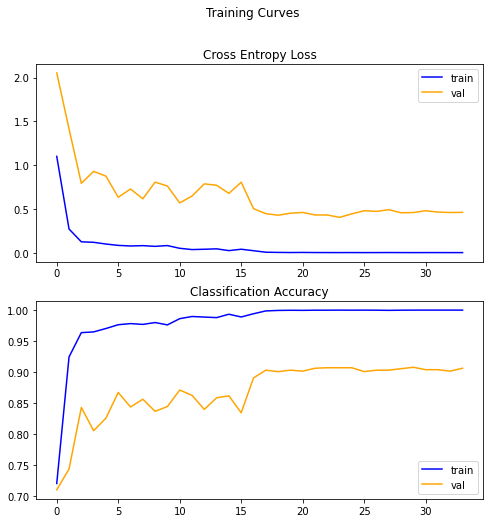


Test set evaluation metrics
30/30 [==============================] - 2s 74ms/step - loss: 0.5528 - accuracy: 0.8943
loss: 0.55
accuracy: 0.89


In [0]:
model_report(Xception_adam_rlr_60, Xception_adam_rlr_60_history, 78, 30)

# Tensorboard

In [0]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [0]:
%tensorboard --logdir "/content/drive/My Drive/NN/Lab3/MODELS/logs/"

<IPython.core.display.Javascript object>